In [1]:
# Antes de correr este archivo, renombrar los videos usando "Rename czi files.ipynb"

# Importo librerías necesarias
from ipynb.fs.defs.aux_functions import *

from ipywidgets import interact, interact_manual, interactive, fixed
from IPython.display import display
import pandas as pd

from os.path import exists
from PIL import Image

c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\tensorflow\python\framework\dtypes.

Levantamos los PKLS del experimento a 6.23 Hz

In [684]:
areas_dir = r'C:\Users\PC\Desktop\Mascaras templados\Pkls\SubSam'
# areas_dir = r'C:\Users\PC\Desktop\Analisis conf\PKL 11-2024'
areas = load_areas(areas_dir)

for key in areas:
    print(key + ":", len(areas[key].trials), "trials.")

1-1: 20 trials.
10-1: 20 trials.
11-1: 20 trials.
12-1: 20 trials.
13-1: 20 trials.
14-1: 20 trials.
15-1: 20 trials.
17-1: 20 trials.
18-1: 20 trials.
19-1: 20 trials.
2-1: 20 trials.
20-1: 20 trials.
21-1: 20 trials.
22-1: 20 trials.
23-1: 20 trials.
25-1: 20 trials.
26-1: 20 trials.
27-1: 20 trials.
4-1: 20 trials.
5-1: 20 trials.
6-1: 20 trials.
7-1: 20 trials.
8-1: 20 trials.


In [4]:
areas

{}

In [25]:
trial= areas['2-1'].trials[0]

In [29]:
trial.roi_activities['Hb'].shape

(172, 229)

Vamos a diezmas (subsamplear) la señal original y a calcular el df/f

In [30]:
def decimate_columns(array, n):
    """
    Diezma un array en la segunda dimensión (columnas), tomando 1 de cada n columnas.
    
    Parámetros:
        array (np.ndarray): Array de entrada de dimensiones (L, K).
        n (int): Factor de diezmo (se toma 1 de cada n columnas).
        
    Retorna:
        np.ndarray: Array reducido con dimensiones (L, K/n aproximadamente).
    """
    return array[:, ::n]

Tuvimos que volver a calcular la linea de base después del submuestreo, tuve que correr un par de veces las dos celdas proximas en ordenes distintos y cambiando cosas pero
ya esta todo guardado en un set de .pkl 


In [74]:
def to_dffs(activities, acts_to_filter, time_scale_in_frames = 15, window = 10, fast = False):
    baseline = linearly_extended_filter(acts_to_filter, time_scale_in_frames, window = window, fast = fast)
    # baseline = gaussian_filter1d(activities, time_scale_in_frames, mode = 'nearest')
    
    dffs = (activities - baseline)#/baseline
    return dffs, baseline

dffs_scale_seconds = 4
dffs_window_seconds = 3

binaries_std_s = 1
binaries_window_seconds = 15

binaries_baseline = 15
binaries_th = 1.5

for key in areas:
    if '25' not in key:
        print(key)
        for trial in areas[key].trials:
            trial.roi_activities_subsam ={}
            trial.roi_dffs_subsam = {}
            if np.isnan(trial.total_time):
                frames_per_s = trial.nframes /37
            else:
                frames_per_s = trial.nframes / trial.total_time
            
            # for subarea in trial.roi_binaries:
            subarea= 'Hb'
            trial.roi_activities_subsam[subarea] = decimate_columns(trial.roi_activities[subarea], 6)
            new_acts = []
            
            for roi in range(trial.roi_binaries_subsam[subarea].shape[0]):
                x = np.arange(len(trial.roi_binaries_subsam[subarea][roi]))[trial.roi_binaries_subsam[subarea][roi]==0]
                y = trial.roi_activities_subsam[subarea][roi,trial.roi_binaries_subsam[subarea][roi]==0]
                
                nx = np.arange(len(trial.roi_activities_subsam[subarea][0]))
                ny = np.interp(nx,x,y)
                
                new_acts.append(ny)
                
            new_acts = np.vstack(new_acts)
            
            trial.roi_dffs_subsam[subarea], __ = to_dffs(trial.roi_activities_subsam[subarea], new_acts, time_scale_in_frames = frames_per_s * dffs_scale_seconds,
                                                                window = int(frames_per_s * dffs_window_seconds), fast = True)

1-1
10-1
11-1
12-1
13-1
14-1
15-1
17-1
18-1
19-1
2-1
20-1
21-1
22-1
23-1
26-1
27-1
4-1
5-1
6-1
7-1
8-1


In [66]:
def to_binaries(dffs, std = 3, window = 10, baseline = 25, th = 1.4, ret_params = False, fast = False):
    #filtered = gaussian_filter1d(dffs, std)
    filtered = linearly_extended_filter(dffs, std, window = window, fast = fast)
    
    perc = np.percentile(filtered, baseline, axis = 1)
    th = th*np.std(dffs, axis = 1)
    thresholded = np.zeros(filtered.shape).astype('bool')
    thresholded[filtered > np.expand_dims((perc+th), axis=1)] = 1
    
    if ret_params:
        return thresholded, filtered, perc, th
    else:
        return thresholded, filtered

binaries_std_s = 1
binaries_window_seconds = 15

binaries_baseline = 15
binaries_th = 1.2

for key in areas:
    if '25' not in key:
        print(key)
        for trial in areas[key].trials:
            trial.roi_binaries_subsam={}
            trial.roi_smooth_dffs_subsam={}
            frames_per_s = trial.nframes / trial.total_time
            
            subarea ='Hb'
            activities = decimate_columns(trial.roi_activities[subarea], 6)
            
            if activities.shape[0] > 0:
                trial.roi_binaries_subsam[subarea], trial.roi_smooth_dffs_subsam[subarea] = to_binaries(trial.roi_dffs_subsam[subarea],
                                            std = binaries_std_s*frames_per_s, window = int(binaries_window_seconds*frames_per_s),
                                            baseline = binaries_baseline, th = binaries_th, fast = True)
                    
            # for subarea in trial.grid_activities:
            #     activities = trial.grid_activities[subarea]
                
            #     if activities.shape[0] > 0:
            #         trial.grid_binaries[subarea], trial.grid_smooth_dffs[subarea] = to_binaries(trial.grid_dffs[subarea],
            #                                     std = binaries_std_s*frames_per_s, window = int(binaries_window_seconds*frames_per_s),
            #                                     baseline = binaries_baseline, th = binaries_th, fast = True)

1-1
10-1
11-1
12-1
13-1
14-1
15-1
17-1
18-1
19-1
2-1
20-1
21-1
22-1
23-1
26-1
27-1
4-1
5-1
6-1
7-1
8-1


Con esta celda graficamos los trials de una key en una condición fija:
* Vemos los rasters de df/f originales y los del submuestreo. 
* El orden de las filas del raster es por quien tiene el maximo primero, con el booleano match_order se puede hacer que el subsam tenga el mismo orden que el original ó el 
orden según sus propios máximos.
* Vemos el gráfico del Z-score de todos los rois antes y después de un filtro gaussiano. Para el subsam se usa un filtro del mismo tamaño temporal que en el caso normal. 


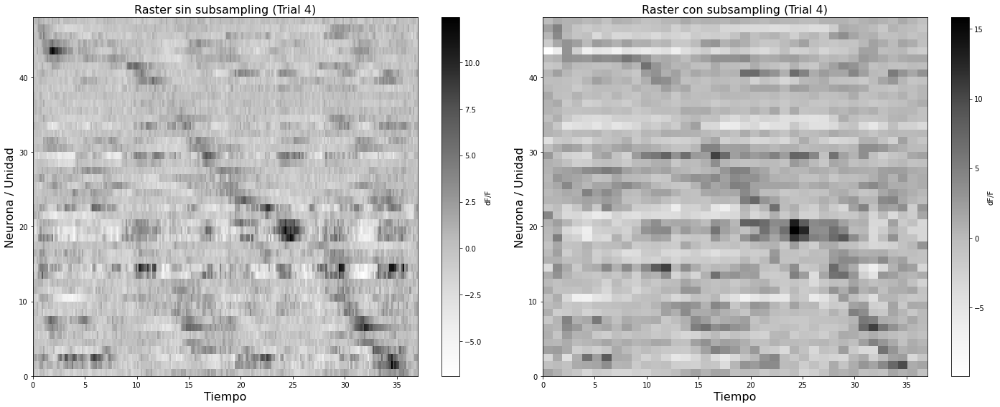

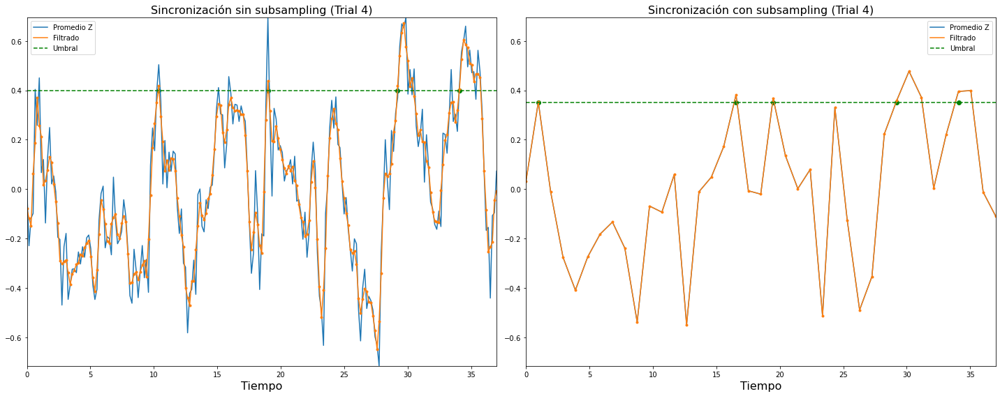

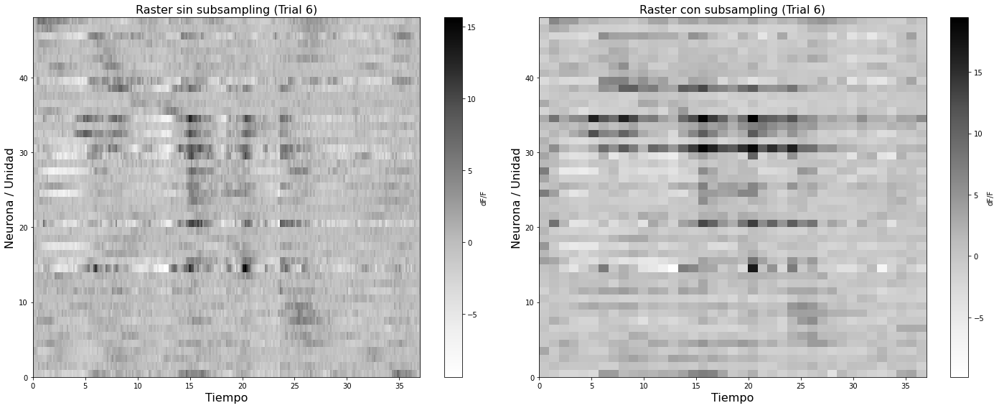

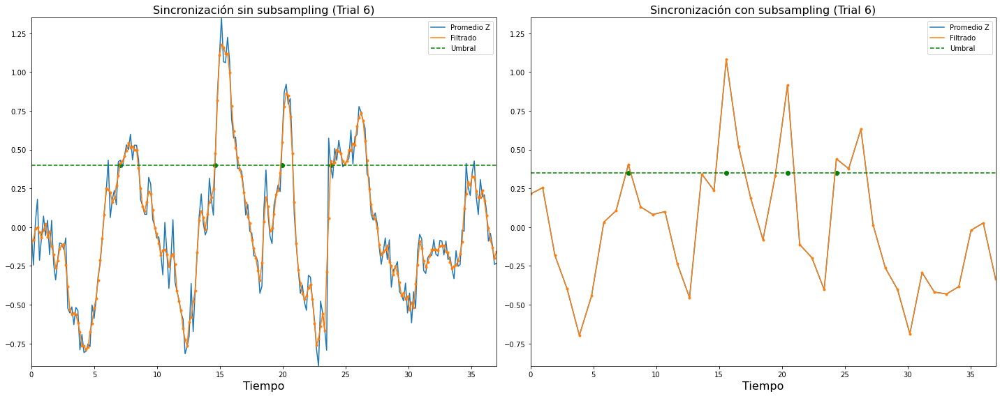

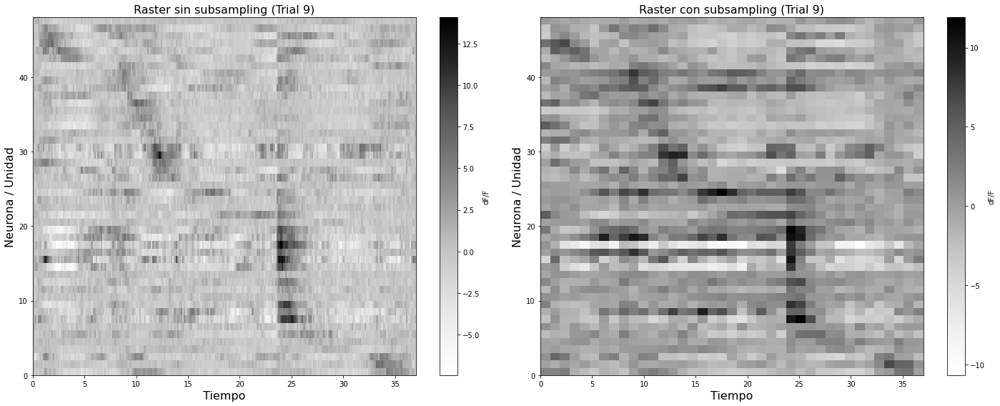

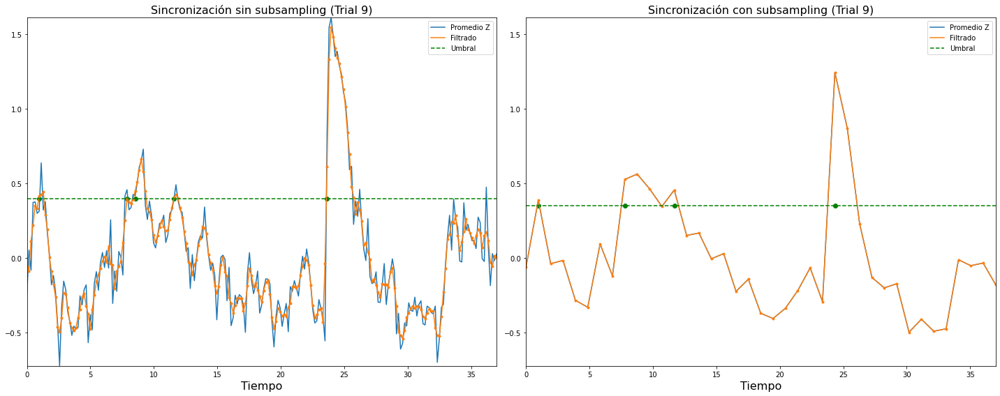

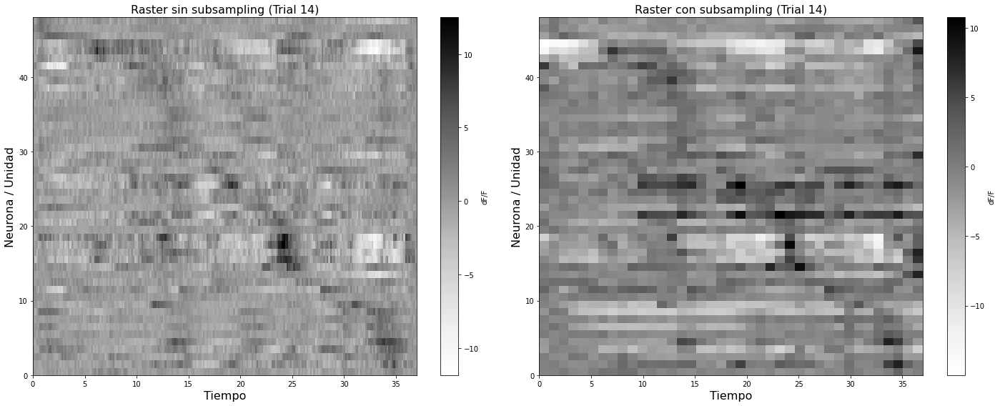

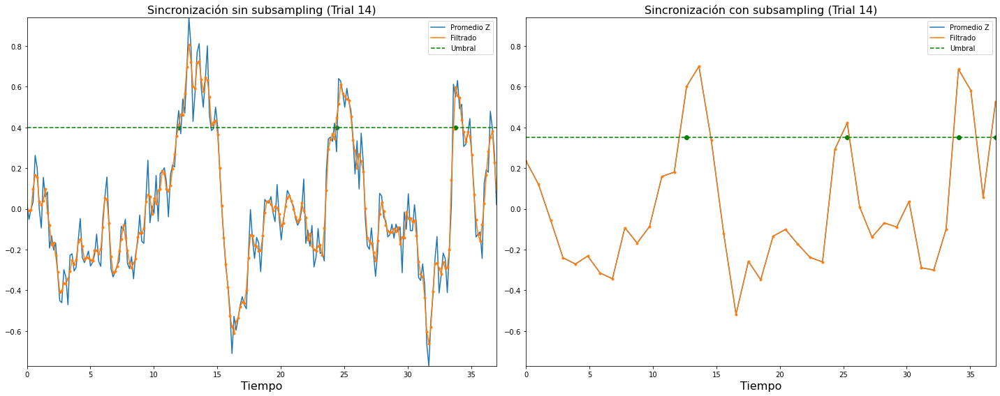

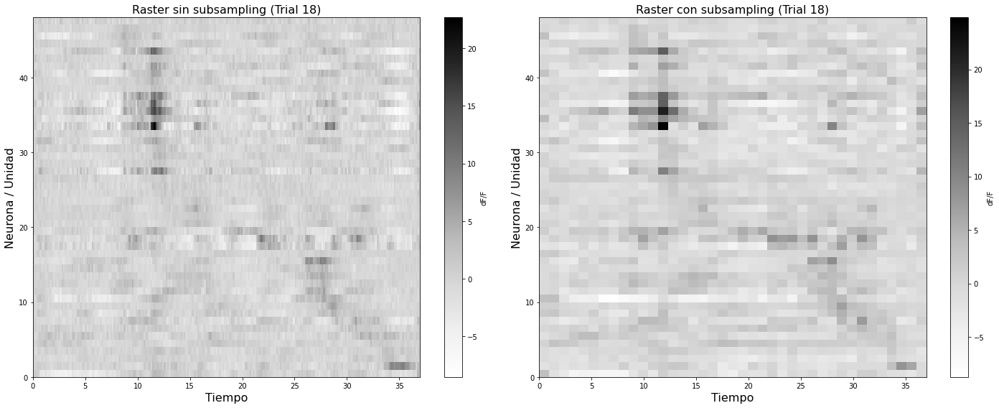

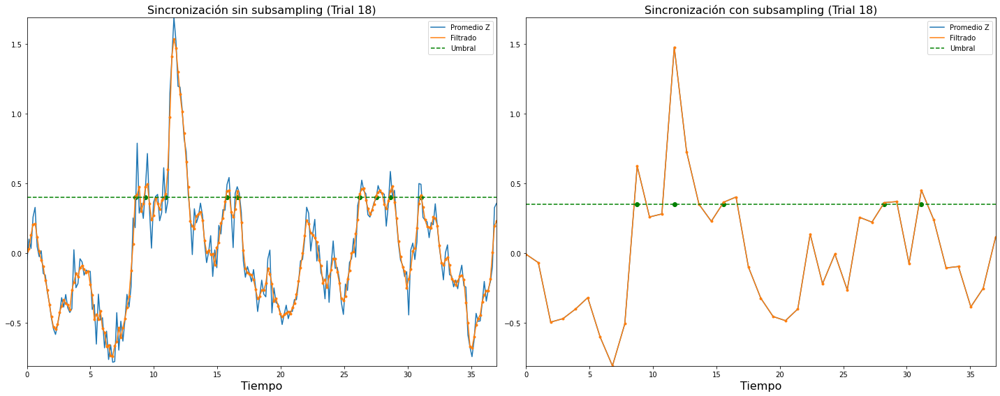

In [344]:
planos = '1'
vis_con = 1
aud_con = 1
leftie = True
key = '5-1'
match_order = True  # True para que ambos usen el mismo orden de columnas
i = 0

for trial in areas[key].trials:
    i += 1
    if trial.vis == vis_con and trial.aud == aud_con and key[-1] == planos:
        # Datos sin subsampling
        data_array = trial.roi_dffs["Hb"][areas[key].roi_lefties['Hb'] == leftie]
        first_event_indices = np.argmax(data_array, axis=1)
        sorted_indices = np.argsort(first_event_indices)
        sorted_data_array = data_array[sorted_indices]

        # Datos con subsampling
        data_array_subsam = trial.roi_dffs_subsam["Hb"][areas[key].roi_lefties['Hb'] == leftie]
        first_event_indices_subsam = np.argmax(data_array_subsam, axis=1)
        sorted_indices_subsam = np.argsort(first_event_indices_subsam)

        # Si `match_order` es True, el orden del subsampling sigue al sin subsampling
        if match_order:
            sorted_data_array_subsam = data_array_subsam[sorted_indices]
        else:
            sorted_data_array_subsam = data_array_subsam[sorted_indices_subsam]

        # Normalización Z-score
        data_z = sorted_data_array - np.expand_dims(np.mean(sorted_data_array, axis=1), axis=1)
        data_z = data_z / np.expand_dims(np.std(sorted_data_array, axis=1), axis=1)

        data_z_subsam = sorted_data_array_subsam - np.expand_dims(np.mean(sorted_data_array_subsam, axis=1), axis=1)
        data_z_subsam = data_z_subsam / np.expand_dims(np.std(sorted_data_array_subsam, axis=1), axis=1)

        # Mapeo del eje X de 0 a 37
        original_time = np.linspace(0, 37, data_z.shape[1])
        subsam_time = np.linspace(0, 37, data_z_subsam.shape[1])

        # Ajustar el tamaño del kernel en tiempo
        frames_ratio = data_z.shape[1] / data_z_subsam.shape[1]
        kernel_size_no_subsam = 3  # Tamaño original del kernel en frames
        kernel_size_subsam = max(1, round(kernel_size_no_subsam / frames_ratio))  # Ajustado para subsampling
        kernel_no_subsam = np.ones(kernel_size_no_subsam) / kernel_size_no_subsam
        kernel_subsam = np.ones(kernel_size_subsam) / kernel_size_subsam

        # Filtrado con kernel ajustado
        promedio_data_z = data_z.mean(axis=0)
        promedio_data_z_subsam = data_z_subsam.mean(axis=0)

        promedio_data_z_filtrada = np.convolve(promedio_data_z, kernel_no_subsam, mode='same')
        promedio_data_z_filtrada_subsam = np.convolve(promedio_data_z_subsam, kernel_subsam, mode='same')

        umbral = .4
        mascara_th = promedio_data_z_filtrada > umbral
        mascara_th_subsam = promedio_data_z_filtrada_subsam > umbral_subsam

        start_indices = np.where((mascara_th[:-1] == False) & (mascara_th[1:] == True))[0] + 1
        start_indices_subsam = np.where((mascara_th_subsam[:-1] == False) & (mascara_th_subsam[1:] == True))[0] + 1

        if mascara_th[0]:
            start_indices = np.insert(start_indices, 0, 0)
        if mascara_th_subsam[0]:
            start_indices_subsam = np.insert(start_indices_subsam, 0, 0)

        # Crear gráficos en columnas (con subsampling a la izquierda, sin subsampling a la derecha)
        fig, axes = plt.subplots(1, 2, figsize=(20, 8))

        # Raster plot con subsampling
        ax1 = axes[1]
        im = ax1.imshow(sorted_data_array_subsam, aspect='auto', cmap='Greys', interpolation='nearest', extent=[0, 37, 0, sorted_data_array_subsam.shape[0]])
        fig.colorbar(im, ax=ax1, label='dF/F')
        ax1.set_xlabel('Tiempo', fontsize=16)
        ax1.set_ylabel('Neurona / Unidad', fontsize=16)
        ax1.set_title(f'Raster con subsampling (Trial {i})', fontsize=16)
        ax1.set_xlim(0, 37)

        # Raster plot sin subsampling
        ax2 = axes[0]
        im = ax2.imshow(sorted_data_array, aspect='auto', cmap='Greys', interpolation='nearest', extent=[0, 37, 0, sorted_data_array.shape[0]])
        fig.colorbar(im, ax=ax2, label='dF/F')
        ax2.set_xlabel('Tiempo', fontsize=16)
        ax2.set_ylabel('Neurona / Unidad', fontsize=16)
        ax2.set_title(f'Raster sin subsampling (Trial {i})', fontsize=16)
        ax2.set_xlim(0, 37)

        plt.tight_layout()
        plt.show()

        # Gráficos de sincronización
        fig, axes = plt.subplots(1, 2, figsize=(20, 8))

        # Sincronización con subsampling
        ax1 = axes[1]
        ax1.set_title(f'Sincronización con subsampling (Trial {i})', fontsize=16)
        ax1.plot(subsam_time, promedio_data_z_subsam, color='#1f77b4', label='Promedio Z')
        ax1.plot(subsam_time, promedio_data_z_filtrada_subsam, '.', color='#ff7f0e')
        ax1.plot(subsam_time, promedio_data_z_filtrada_subsam, color='#ff7f0e', label='Filtrado')
        ax1.axhline(umbral_subsam, color='green', linestyle='--', label='Umbral')
        ax1.scatter(subsam_time[start_indices_subsam], np.ones_like(start_indices_subsam) * umbral_subsam, color='green')
        ax1.legend()
        ax1.set_xlim(0, 37)
        ax1.set_ylim(min(min(promedio_data_z_subsam), min(promedio_data_z)), max(max(promedio_data_z_subsam), max(promedio_data_z)))
        ax1.set_xlabel('Tiempo', fontsize=16)


        # Sincronización sin subsampling
        ax2 = axes[0]
        ax2.set_title(f'Sincronización sin subsampling (Trial {i})', fontsize=16)
        ax2.plot(original_time, promedio_data_z, color='#1f77b4', label='Promedio Z')
        ax2.plot(original_time, promedio_data_z_filtrada, '.', color='#ff7f0e')
        ax2.plot(original_time, promedio_data_z_filtrada, color='#ff7f0e', label='Filtrado')
        ax2.axhline(umbral, color='green', linestyle='--', label='Umbral')
        ax2.scatter(original_time[start_indices], np.ones_like(start_indices) * umbral, color='green')
        ax2.legend()
        ax2.set_xlim(0, 37)
        ax2.set_ylim(min(min(promedio_data_z_subsam), min(promedio_data_z)), max(max(promedio_data_z_subsam), max(promedio_data_z)))
        ax2.set_xlabel('Tiempo', fontsize=16)



        plt.tight_layout()
        plt.show()


Ahora calculamos los eventos de sinc para los dos casos y hacemos los histogramas

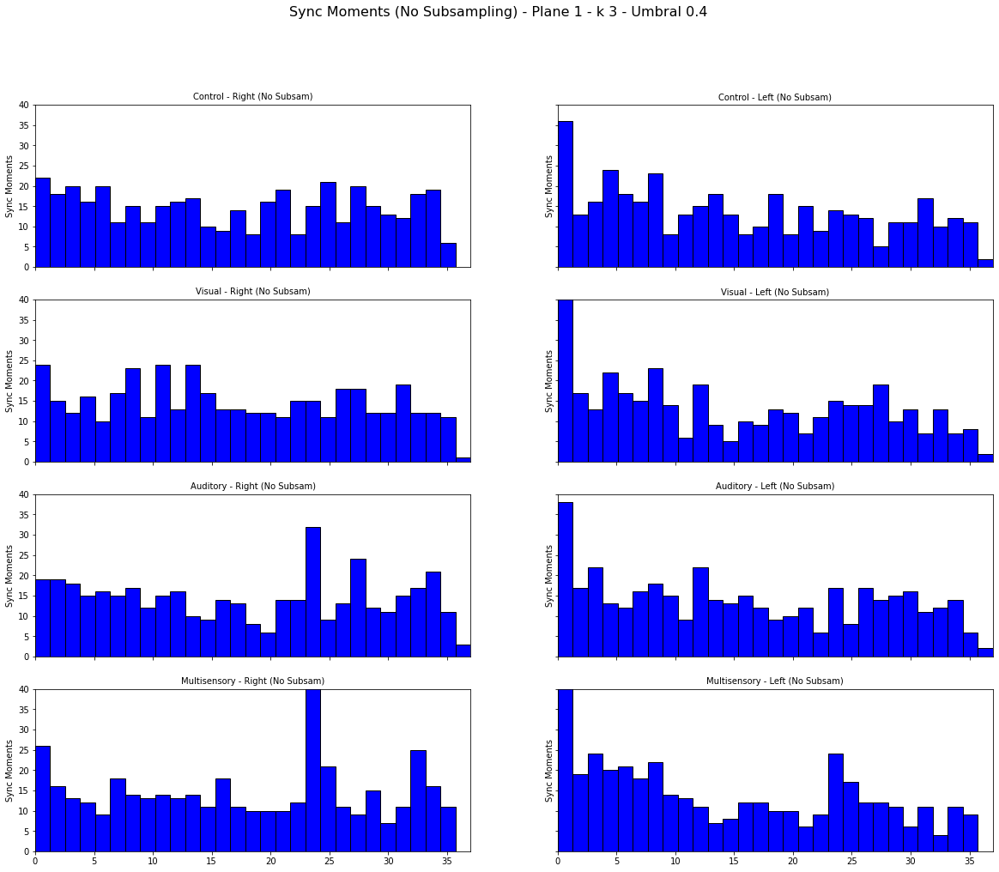

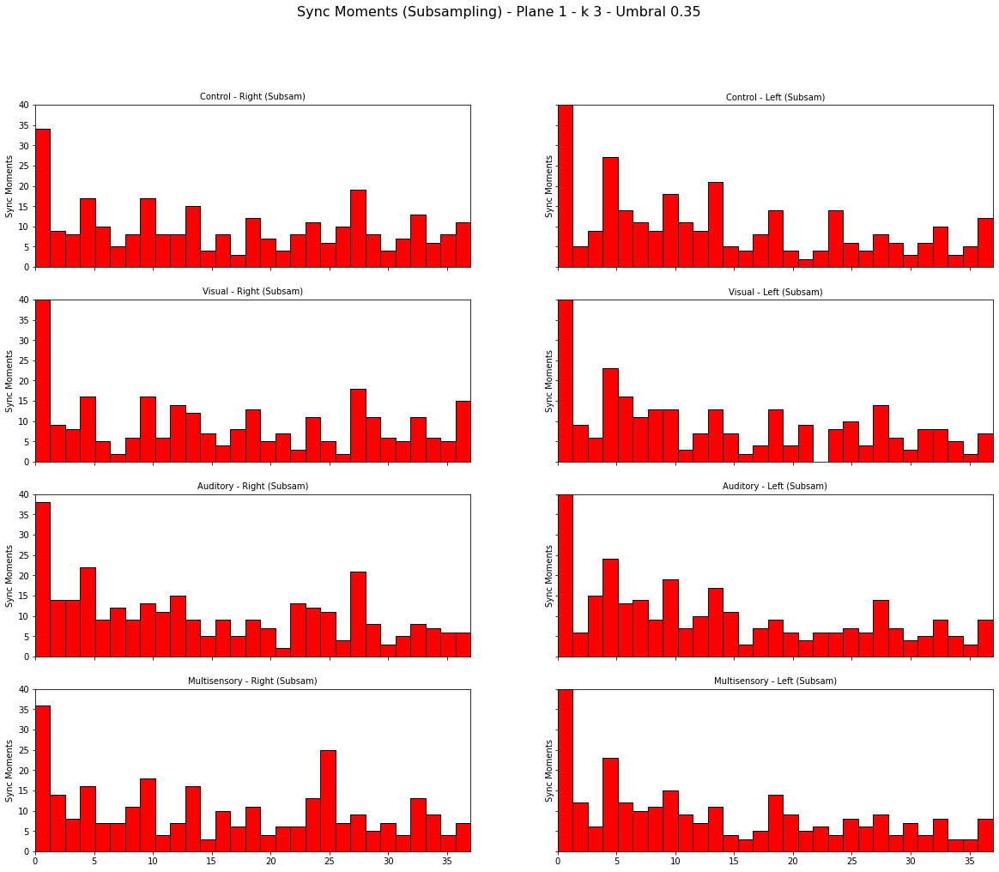

In [326]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['1']  # Solo un plano

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

sinc_mom_dic_6Hz = {}

sinc_mom_dic_6Hz_subsam = {}

match_order = True  # True para que los datos subsam sigan el orden del sin subsam

for planos in planos_values:
    # Crear dos figuras, una para datos sin subsampling y otra para datos con subsampling
    fig_no_subsam, axes_no_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                                 figsize=(20, 16), sharex=True, sharey=True)
    
    fig_subsam, axes_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                           figsize=(20, 16), sharex=True, sharey=True)
    
    umbral = .4
    umbral_subsam = .35
    kernel_no_subsam = np.array([1, 2, 1]) / 4  # Kernel original
    # kernel = np.array([1,2, 4,2, 1]) / 10

    fig_no_subsam.suptitle(f"Sync Moments (No Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)
    fig_subsam.suptitle(f"Sync Moments (Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral_subsam}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                momentos_sincronia = []
                momentos_sincronia_subsam = []

                # Iterar sobre las áreas
                for key in areas:
                    if '25' not in key:
                        for trial in areas[key].trials:
                            if trial.vis == vis_con and trial.aud == aud_con and key[-1] == planos:
                                # Datos sin subsampling
                                data_array = trial.roi_dffs["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                first_event_indices = np.argmax(data_array, axis=1)
                                sorted_indices = np.argsort(first_event_indices)
                                sorted_data_array = data_array[sorted_indices]

                                # Datos con subsampling
                                data_array_subsam = trial.roi_dffs_subsam["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                first_event_indices_subsam = np.argmax(data_array_subsam, axis=1)
                                sorted_indices_subsam = np.argsort(first_event_indices_subsam)

                                # Si `match_order` es True, se usa el mismo orden para subsampling
                                if match_order:
                                    sorted_data_array_subsam = data_array_subsam[sorted_indices]
                                else:
                                    sorted_data_array_subsam = data_array_subsam[sorted_indices_subsam]

                                # Normalización Z-score
                                data_z = sorted_data_array - np.expand_dims(np.mean(sorted_data_array, axis=1), axis=1)
                                data_z = data_z / np.expand_dims(np.std(sorted_data_array, axis=1), axis=1)

                                data_z_subsam = sorted_data_array_subsam - np.expand_dims(np.mean(sorted_data_array_subsam, axis=1), axis=1)
                                data_z_subsam = data_z_subsam / np.expand_dims(np.std(sorted_data_array_subsam, axis=1), axis=1)

                                # Ajuste del tamaño del kernel en tiempo
                                frames_ratio = data_z.shape[1] / data_z_subsam.shape[1]
                                kernel_size_subsam = max(1, round(len(kernel_no_subsam) / frames_ratio))
                                kernel_subsam = np.ones(kernel_size_subsam) / kernel_size_subsam

                                # Filtrado con kernel ajustado
                                promedio_data_z = data_z.mean(axis=0)
                                promedio_data_z_subsam = data_z_subsam.mean(axis=0)

                                promedio_data_z_filtrada = np.convolve(promedio_data_z, kernel_no_subsam, mode='same')
                                # promedio_data_z_filtrada_subsam = np.convolve(promedio_data_z_subsam, kernel_subsam, mode='same')
                                promedio_data_z_filtrada_subsam = promedio_data_z_subsam

                                # Detección de momentos de sincronización
                                mascara_th = promedio_data_z_filtrada > umbral
                                mascara_th_subsam = promedio_data_z_filtrada_subsam > umbral_subsam

                                start_indices = np.where((mascara_th[:-1] == False) & (mascara_th[1:] == True))[0] + 1
                                start_indices_subsam = np.where((mascara_th_subsam[:-1] == False) & (mascara_th_subsam[1:] == True))[0] + 1

                                if mascara_th[0]:
                                    start_indices = np.insert(start_indices, 0, 0)
                                if mascara_th_subsam[0]:
                                    start_indices_subsam = np.insert(start_indices_subsam, 0, 0)

                                momentos_sincronia.extend(start_indices)
                                momentos_sincronia_subsam.extend(start_indices_subsam)

                # Definir la posición del subplot
                ax_no_subsam = axes_no_subsam[i * len(vis_con_values) + j, k]
                ax_subsam = axes_subsam[i * len(vis_con_values) + j, k]

                # Graficar histogramas sin subsampling
                if momentos_sincronia:
                    # bins = np.linspace(0, 230, 30)
                    # ax_no_subsam.hist(momentos_sincronia, bins=bins, color='blue', edgecolor='black')
                    # # ax_no_subsam.hist(momentos_sincronia,  bins=20, color='blue', edgecolor='black')
                    # ax_no_subsam.set_ylim(0, 40)
                    momentos_sincronia_rescaled = np.array(momentos_sincronia) / 230 * 37
                    bins = np.linspace(0, 37, 30)  # Definir los bins en la escala correcta
                    ax_no_subsam.hist(momentos_sincronia_rescaled, bins=bins, color='blue', edgecolor='black')
                    ax_no_subsam.set_ylim(0, 40)
                    ax_no_subsam.set_xlim(0, 37)  
                sinc_mom_dic_6Hz[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia_rescaled
                # Graficar histogramas con subsampling
                if momentos_sincronia_subsam:
                    bins = np.linspace(0, 37, 30)
                    ax_subsam.hist(momentos_sincronia_subsam, bins=bins, color='red', edgecolor='black')
                    # ax_subsam.hist(momentos_sincronia_subsam,  color='red', edgecolor='black')
                    ax_subsam.set_xlim(0, 37)  
                    ax_subsam.set_ylim(0, 40)
                sinc_mom_dic_6Hz_subsam[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia_subsam
                ax_no_subsam.set_ylabel("Sync Moments", fontsize=10)
                ax_subsam.set_ylabel("Sync Moments", fontsize=10)

                # if j == len(vis_con_values) - 1:
                    # ax_no_subsam.set_xlabel("Time (seconds)", fontsize=10)
                    # ax_subsam.set_xlabel("Time (seconds)", fontsize=10)

                # Títulos de cada subplot
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax_no_subsam.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)
                ax_subsam.set_title(f"{condition_label} - {side_label} (Subsam)", fontsize=10)

    # Ajustar el diseño y comentar el guardado de las figuras
    # plt.tight_layout(rect=[0, 0.03, 1, 0.97])

    # Guardar las figuras (COMENTADO PARA NO SOBREESCRIBIR)
    # plt.savefig(f"histogram_no_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')
    # plt.savefig(f"histogram_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')

    plt.show()


In [ ]:
# for key in areas:
#     save_area(r'C:\\Users\\PC\\Desktop\\Mascaras templados\\Pkls', key+'_subsam', areas[key])

In [87]:
os.getcwd()

'C:\\Users\\PC\\Desktop\\Mascaras templados\\Pkls'

# Levantemos los experimentos a 1Hz y veamos que onda


In [15]:
areas_dir = r'C:\Users\PC\Desktop\Analisis conf\PKL 11-2024'
# areas_dir = r'C:\Users\PC\Desktop\Analisis conf\PKL 11-2024'
areas_1hz = load_areas(areas_dir)

for key in areas_1hz:
    print(key + ":", len(areas_1hz[key].trials), "trials.")
    areas_1hz[key].trials[0].roi_dffs

29-0: 20 trials.
29-1: 20 trials.
29-2: 20 trials.
30-0: 20 trials.
30-1: 20 trials.
30-2: 20 trials.
31-0: 20 trials.
31-1: 20 trials.
31-2: 20 trials.
32-0: 20 trials.
32-1: 20 trials.
32-2: 20 trials.
33-0: 20 trials.
33-1: 20 trials.
33-2: 20 trials.
34-0: 20 trials.
34-1: 20 trials.
34-2: 20 trials.
35-0: 20 trials.
35-1: 20 trials.
35-2: 20 trials.
36-0: 20 trials.
36-1: 20 trials.
36-2: 20 trials.
37-0: 20 trials.
37-1: 20 trials.
37-2: 20 trials.
38-0: 20 trials.
38-1: 20 trials.
38-2: 20 trials.
39-0: 20 trials.
39-1: 20 trials.
39-2: 20 trials.
40-0: 20 trials.
40-1: 20 trials.
40-2: 20 trials.
41-0: 20 trials.
41-1: 20 trials.
41-2: 20 trials.
42-0: 20 trials.
42-1: 20 trials.
42-2: 20 trials.
43-0: 20 trials.
43-1: 20 trials.
43-2: 20 trials.
44-0: 20 trials.
44-1: 20 trials.
44-2: 20 trials.
45-0: 20 trials.
45-1: 20 trials.
45-2: 20 trials.
46-0: 20 trials.
46-1: 20 trials.
46-2: 20 trials.
47-0: 20 trials.
47-1: 20 trials.
47-2: 20 trials.
48-0: 20 trials.
48-1: 20 trial

AttributeError: 'Trial' object has no attribute 'roi_dffs'

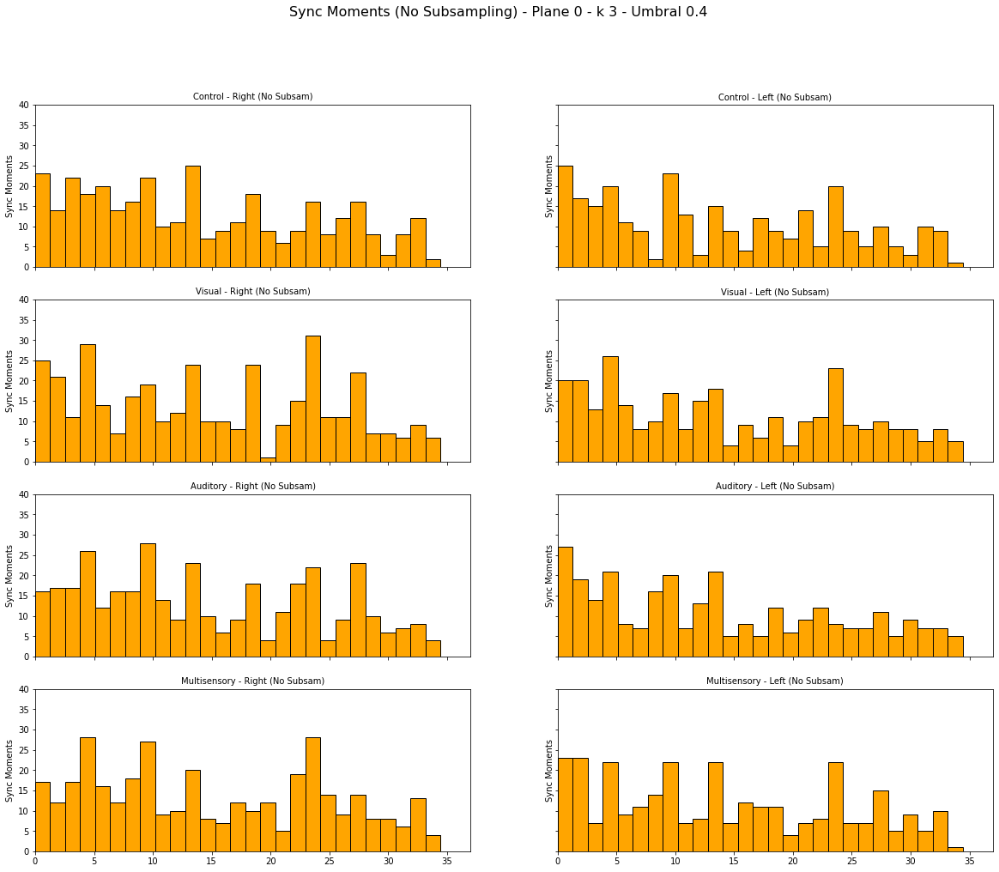

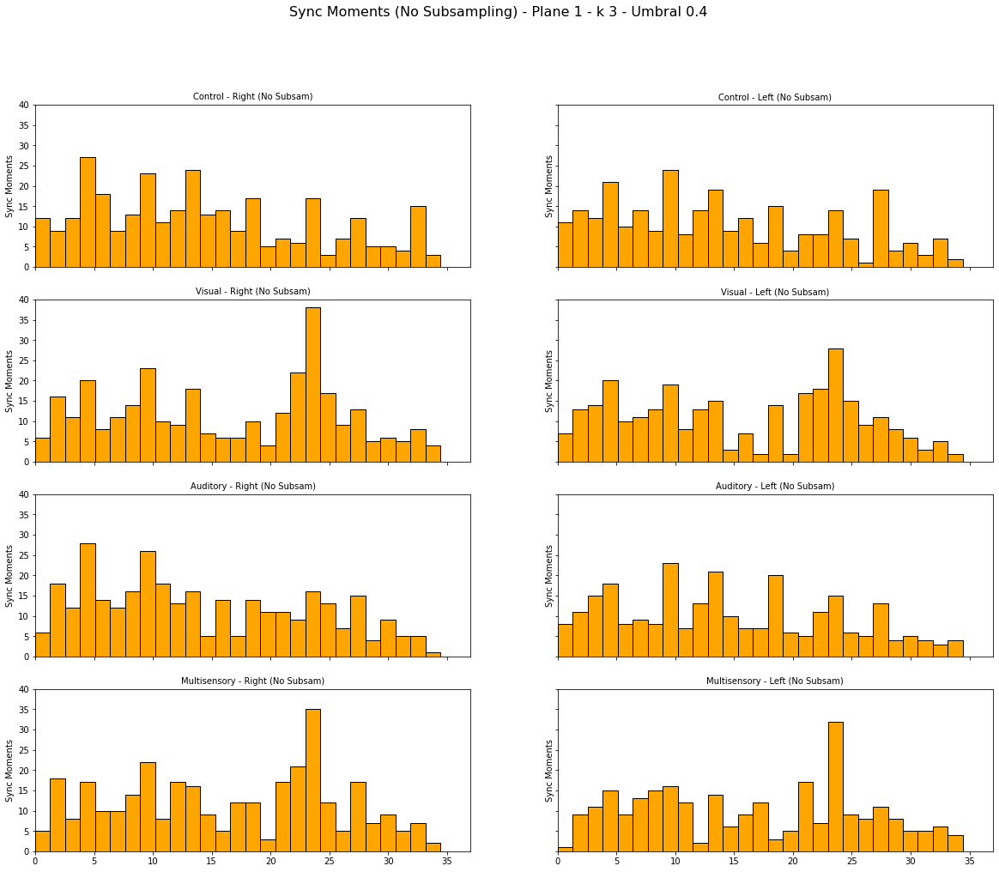

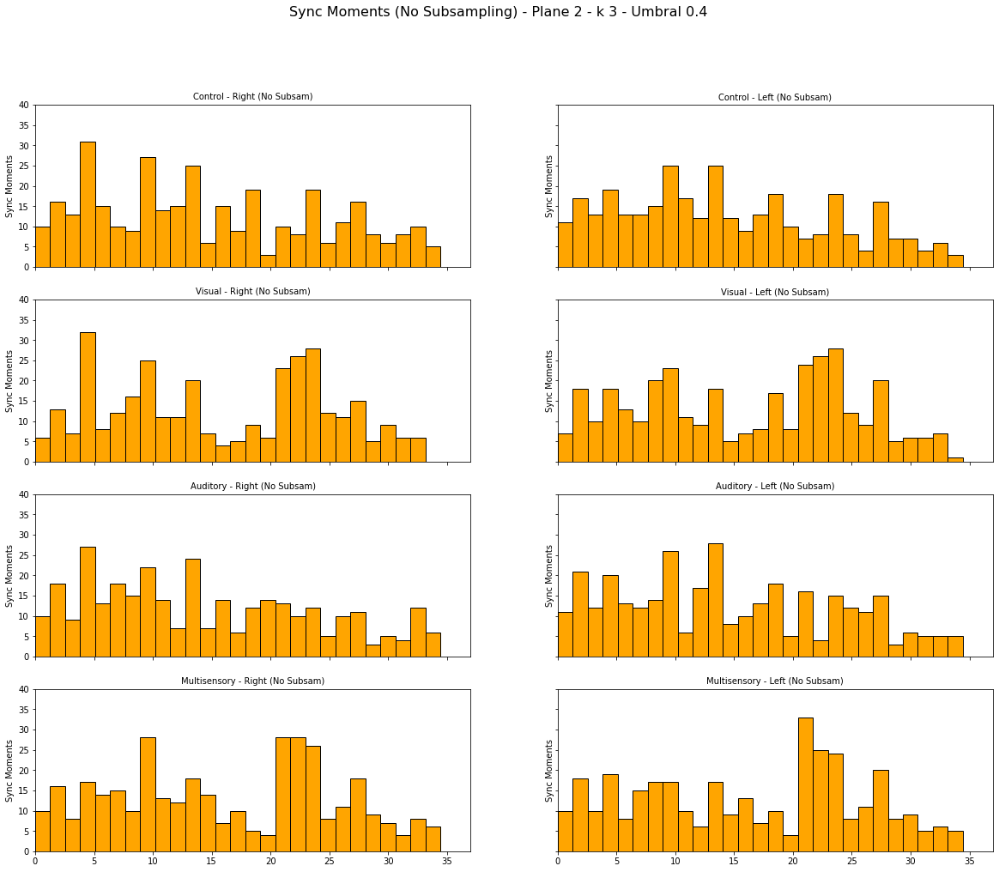

In [402]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # Solo un plano

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}
sinc_mom_dic = {}
match_order = True  # True para que los datos subsam sigan el orden del sin subsam

for planos in planos_values:
    # Crear dos figuras, una para datos sin subsampling y otra para datos con subsampling
    fig_no_subsam, axes_no_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                                 figsize=(20, 16), sharex=True, sharey=True)
    
    # fig_subsam, axes_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                        #    figsize=(20, 16), sharex=True, sharey=True)
    
    umbral = .4
    umbral_subsam = .35
    # kernel_no_subsam = np.array([1, 2, 1]) / 4  # Kernel original
    # kernel = np.array([1,2, 4,2, 1]) / 10

    fig_no_subsam.suptitle(f"Sync Moments (No Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)
    # fig_subsam.suptitle(f"Sync Moments (Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral_subsam}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                momentos_sincronia = []
                # momentos_sincronia_subsam = []

                # Iterar sobre las áreas
                for key in areas_1hz:
                    if '52' not in key:
                        for trial in areas_1hz[key].trials:
                            if trial.vis == vis_con and trial.aud == aud_con and key[-1] == planos:
                                # Datos sin subsampling
                                data_array = trial.roi_dffs["Hb"][areas_1hz[key].roi_lefties['Hb'] == leftie]
                                first_event_indices = np.argmax(data_array, axis=1)
                                sorted_indices = np.argsort(first_event_indices)
                                sorted_data_array = data_array[sorted_indices]

                                # # Datos con subsampling
                                # data_array_subsam = trial.roi_dffs_subsam["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                # first_event_indices_subsam = np.argmax(data_array_subsam, axis=1)
                                # sorted_indices_subsam = np.argsort(first_event_indices_subsam)

                                # # Si `match_order` es True, se usa el mismo orden para subsampling
                                # if match_order:
                                #     sorted_data_array_subsam = data_array_subsam[sorted_indices]
                                # else:
                                #     sorted_data_array_subsam = data_array_subsam[sorted_indices_subsam]

                                # Normalización Z-score
                                data_z = sorted_data_array - np.expand_dims(np.mean(sorted_data_array, axis=1), axis=1)
                                data_z = data_z / np.expand_dims(np.std(sorted_data_array, axis=1), axis=1)

                                # data_z_subsam = sorted_data_array_subsam - np.expand_dims(np.mean(sorted_data_array_subsam, axis=1), axis=1)
                                # data_z_subsam = data_z_subsam / np.expand_dims(np.std(sorted_data_array_subsam, axis=1), axis=1)

                                # Ajuste del tamaño del kernel en tiempo
                                # frames_ratio = data_z.shape[1] / data_z_subsam.shape[1]
                                # kernel_size_subsam = max(1, round(len(kernel_no_subsam) / frames_ratio))
                                # kernel_subsam = np.ones(kernel_size_subsam) / kernel_size_subsam

                                # Filtrado con kernel ajustado
                                promedio_data_z = data_z.mean(axis=0)
                                # promedio_data_z_subsam = data_z_subsam.mean(axis=0)

                                promedio_data_z_filtrada = np.convolve(promedio_data_z, kernel_no_subsam, mode='same')
                                # promedio_data_z_filtrada_subsam = np.convolve(promedio_data_z_subsam, kernel_subsam, mode='same')
                                # promedio_data_z_filtrada_subsam = promedio_data_z_subsam

                                # Detección de momentos de sincronización
                                mascara_th = promedio_data_z > umbral
                                # mascara_th_subsam = promedio_data_z_filtrada_subsam > umbral_subsam

                                start_indices = np.where((mascara_th[:-1] == False) & (mascara_th[1:] == True))[0] + 1
                                # start_indices_subsam = np.where((mascara_th_subsam[:-1] == False) & (mascara_th_subsam[1:] == True))[0] + 1

                                if mascara_th[0]:
                                    start_indices = np.insert(start_indices, 0, 0)
                                # if mascara_th_subsam[0]:
                                #     start_indices_subsam = np.insert(start_indices_subsam, 0, 0)

                                momentos_sincronia.extend(start_indices)
                                # momentos_sincronia_subsam.extend(start_indices_subsam)

                # Definir la posición del subplot
                ax_no_subsam = axes_no_subsam[i * len(vis_con_values) + j, k]
                # ax_subsam = axes_subsam[i * len(vis_con_values) + j, k]
                sinc_mom_dic[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia
                # Graficar histogramas sin subsampling
                if momentos_sincronia:
                    # bins = np.linspace(0, 230, 30)
                    # ax_no_subsam.hist(momentos_sincronia, bins=bins, color='blue', edgecolor='black')
                    # # ax_no_subsam.hist(momentos_sincronia,  bins=20, color='blue', edgecolor='black')
                    # ax_no_subsam.set_ylim(0, 40)
                    # momentos_sincronia_rescaled = np.array(momentos_sincronia) / 230 * 37
                    bins = np.linspace(0, 37, 30)  # Definir los bins en la escala correcta
                    ax_no_subsam.hist(momentos_sincronia, bins=bins, color='orange', edgecolor='black')
                    ax_no_subsam.set_ylim(0, 40)
                    ax_no_subsam.set_xlim(0, 37)  

                # # Graficar histogramas con subsampling
                # if momentos_sincronia_subsam:
                #     bins = np.linspace(0, 37, 30)
                #     ax_subsam.hist(momentos_sincronia_subsam, bins=bins, color='red', edgecolor='black')
                #     # ax_subsam.hist(momentos_sincronia_subsam,  color='red', edgecolor='black')
                #     ax_subsam.set_xlim(0, 37)  
                #     ax_subsam.set_ylim(0, 40)

                ax_no_subsam.set_ylabel("Sync Moments", fontsize=10)
                # ax_subsam.set_ylabel("Sync Moments", fontsize=10)

                # if j == len(vis_con_values) - 1:
                    # ax_no_subsam.set_xlabel("Time (seconds)", fontsize=10)
                    # ax_subsam.set_xlabel("Time (seconds)", fontsize=10)

                # Títulos de cada subplot
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax_no_subsam.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)
                # ax_subsam.set_title(f"{condition_label} - {side_label} (Subsam)", fontsize=10)

    # Ajustar el diseño y comentar el guardado de las figuras
    # plt.tight_layout(rect=[0, 0.03, 1, 0.97])

    # Guardar las figuras (COMENTADO PARA NO SOBREESCRIBIR)
    # plt.savefig(f"histogram_no_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')
    # plt.savefig(f"histogram_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')

    plt.show()

In [38]:
sinc_mom_dic.keys()

dict_keys(['A0-V0-LTrue-P0', 'A0-V0-LFalse-P0', 'A0-V1-LTrue-P0', 'A0-V1-LFalse-P0', 'A1-V0-LTrue-P0', 'A1-V0-LFalse-P0', 'A1-V1-LTrue-P0', 'A1-V1-LFalse-P0', 'A0-V0-LTrue-P1', 'A0-V0-LFalse-P1', 'A0-V1-LTrue-P1', 'A0-V1-LFalse-P1', 'A1-V0-LTrue-P1', 'A1-V0-LFalse-P1', 'A1-V1-LTrue-P1', 'A1-V1-LFalse-P1', 'A0-V0-LTrue-P2', 'A0-V0-LFalse-P2', 'A0-V1-LTrue-P2', 'A0-V1-LFalse-P2', 'A1-V0-LTrue-P2', 'A1-V0-LFalse-P2', 'A1-V1-LTrue-P2', 'A1-V1-LFalse-P2'])

# Numero de unidades en cada plano

In [191]:
# unidades_Hb_0 = []
unidades_Hb_1_6hz = []
# unidades_Hb_2 = []

for key in areas:
    if '25' not in key:
        if key[-1] == '1':
            unidades_Hb_1_6hz.append(len(areas[key].trials[0].roi_activities['Hb']))

unidades_Hb_0 = []
unidades_Hb_1 = []
unidades_Hb_2 = []

for key in areas_1hz:
    if '52' not in key:
    # print(key)
        if key[-1] == '0':
            unidades_Hb_0.append(len(areas_1hz[key].trials[0].roi_activities['Hb']))
        if key[-1] == '1':
            unidades_Hb_1.append(len(areas_1hz[key].trials[0].roi_activities['Hb']))
        if key[-1] == '2':
            unidades_Hb_2.append(len(areas_1hz[key].trials[0].roi_activities['Hb']))

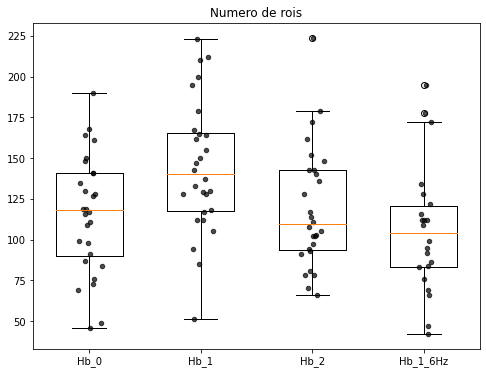

In [193]:
# Crear figura y ejes
plt.figure(figsize=(8, 6))

# Dibujar los boxplots en distintas posiciones
positions = [1, 2, 3, 4]
plt.boxplot([unidades_Hb_0, unidades_Hb_1, unidades_Hb_2, unidades_Hb_1_6hz], positions=positions, widths=0.6)

# Añadir puntos con dispersión
for i, data in enumerate([unidades_Hb_0, unidades_Hb_1, unidades_Hb_2, unidades_Hb_1_6hz]):
    x_jitter = np.random.normal(loc=positions[i], scale=0.05, size=len(data))  # Desplazamiento aleatorio
    plt.scatter(x_jitter, data, alpha=0.7, color='black', s=20)  # Puntos dispersos

# Etiquetas del eje x
plt.title('Numero de rois')
plt.xticks(positions, ['Hb_0', 'Hb_1', 'Hb_2', 'Hb_1_6Hz'])
# plt.savefig('box_plot_numero_unidades.png')
# Mostrar gráfico
plt.show()

Ahora lo ordenamos por edad

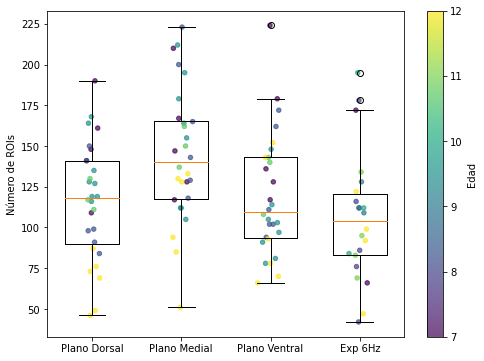

In [ ]:


# Supongo que ya tienes definidos los diccionarios 'areas' y 'areas_1hz'

# Listas para los datos de unidades y edades para cada grupo
unidades_Hb_0 = []
edades_Hb_0 = []
unidades_Hb_1 = []
edades_Hb_1 = []
unidades_Hb_2 = []
edades_Hb_2 = []
unidades_Hb_1_6hz = []
edades_Hb_1_6hz = []

# Para el grupo proveniente de areas_1hz (Hb_0, Hb_1 y Hb_2)
for key in areas_1hz:
    if '52' not in key:
        # Usamos el último caracter para identificar el grupo
        if key[-1] == '0':
            unidades_Hb_0.append(len(areas_1hz[key].trials[0].roi_activities['Hb']))
            edades_Hb_0.append(areas_1hz[key].trials[0].data['Edad'])
        elif key[-1] == '1':
            unidades_Hb_1.append(len(areas_1hz[key].trials[0].roi_activities['Hb']))
            edades_Hb_1.append(areas_1hz[key].trials[0].data['Edad'])
        elif key[-1] == '2':
            unidades_Hb_2.append(len(areas_1hz[key].trials[0].roi_activities['Hb']))
            edades_Hb_2.append(areas_1hz[key].trials[0].data['Edad'])

# Para el grupo de 1.6Hz, proveniente de 'areas'
for key in areas:
    if '25' not in key:
        if key[-1] == '1':
            unidades_Hb_1_6hz.append(len(areas[key].trials[0].roi_activities['Hb']))
            edades_Hb_1_6hz.append(areas[key].trials[0].data['Edad'])

# Crear figura y ejes
plt.figure(figsize=(8, 6))
positions = [1, 2, 3, 4]

# Dibujar los boxplots
plt.boxplot([unidades_Hb_0, unidades_Hb_1, unidades_Hb_2, unidades_Hb_1_6hz],
            positions=positions, widths=0.6)

# Preparar las listas en conjunto para iterar
data_groups = [unidades_Hb_0, unidades_Hb_1, unidades_Hb_2, unidades_Hb_1_6hz]
edad_groups = [edades_Hb_0, edades_Hb_1, edades_Hb_2, edades_Hb_1_6hz]

# Dibujar los puntos dispersos (scatter) coloreados según la edad
for i, (data, edad) in enumerate(zip(data_groups, edad_groups)):
    # Generar un pequeño jitter en x para evitar solapamiento
    x_jitter = np.random.normal(loc=positions[i], scale=0.05, size=len(data))
    scatter = plt.scatter(x_jitter, data, alpha=0.7, c=edad, cmap='viridis', s=20)

# plt.title('Número de ROIs')
plt.xticks(positions, ['Plano Dorsal', 'Plano Medial', 'Plano Ventral', 'Exp 6Hz'])
# plt.xlabel('Grupos')
plt.ylabel('Número de ROIs')

# Añadir barra de color que representa la edad
cbar = plt.colorbar(scatter)
cbar.set_label('Edad')
# plt.savefig('rois-por-grupo.pdf')
plt.show()


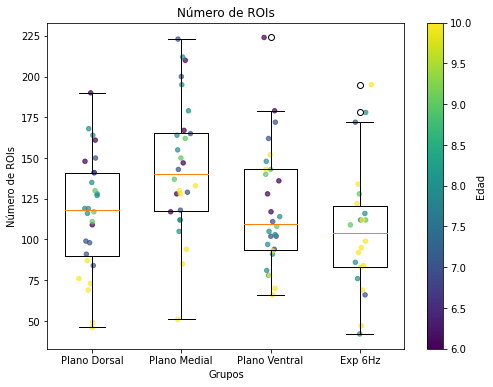

In [316]:
# import numpy as np
# import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

# Ejemplo: Supongo que ya tienes definidos los diccionarios 'areas' y 'areas_1hz'
# y que la estructura de cada entrada es similar a:
# areas[key].trials[0].roi_activities['Hb'] y areas[key].trials[0].data['Edad']

# Inicializar listas para cada grupo y sus edades
unidades_Hb_0 = []
edades_Hb_0 = []
unidades_Hb_1 = []
edades_Hb_1 = []
unidades_Hb_2 = []
edades_Hb_2 = []
unidades_Hb_1_6hz = []
edades_Hb_1_6hz = []

# Para los datos de areas_1hz (grupos Hb_0, Hb_1 y Hb_2)
for key in areas_1hz:
    if '52' not in key:
        if key[-1] == '0':
            unidades_Hb_0.append(len(areas_1hz[key].trials[0].roi_activities['Hb']))
            edades_Hb_0.append(areas_1hz[key].trials[0].data['Edad'])
        elif key[-1] == '1':
            unidades_Hb_1.append(len(areas_1hz[key].trials[0].roi_activities['Hb']))
            edades_Hb_1.append(areas_1hz[key].trials[0].data['Edad'])
        elif key[-1] == '2':
            unidades_Hb_2.append(len(areas_1hz[key].trials[0].roi_activities['Hb']))
            edades_Hb_2.append(areas_1hz[key].trials[0].data['Edad'])

# Para el grupo de 1.6Hz (Hb_1_6hz) proveniente de areas
for key in areas:
    if '25' not in key:
        if key[-1] == '1':
            unidades_Hb_1_6hz.append(len(areas[key].trials[0].roi_activities['Hb']))
            edades_Hb_1_6hz.append(areas[key].trials[0].data['Edad'])

# Calcular el rango global de edades para usarlo en la normalización del colormap
todas_edades = edades_Hb_0 + edades_Hb_1 + edades_Hb_2 + edades_Hb_1_6hz
global_min = min(todas_edades)
# global_max = max(todas_edades)
global_max = 10

# Crear figura y ejes
plt.figure(figsize=(8, 6))
positions = [1, 2, 3, 4]

# Dibujar boxplots para cada grupo
plt.boxplot([unidades_Hb_0, unidades_Hb_1, unidades_Hb_2, unidades_Hb_1_6hz],
            positions=positions, widths=0.6)

# Preparar listas en conjunto para iterar sobre cada grupo
data_groups = [unidades_Hb_0, unidades_Hb_1, unidades_Hb_2, unidades_Hb_1_6hz]
edad_groups = [edades_Hb_0, edades_Hb_1, edades_Hb_2, edades_Hb_1_6hz]

# Dibujar los puntos dispersos (scatter) y asignarles color según la edad
for i, (data, edad) in enumerate(zip(data_groups, edad_groups)):
    x_jitter = np.random.normal(loc=positions[i], scale=0.05, size=len(data))
    plt.scatter(x_jitter, data, alpha=0.7, c=edad, cmap='viridis',
                vmin=global_min, vmax=global_max, s=20)

plt.title('Número de ROIs')
plt.xticks(positions, ['Plano Dorsal', 'Plano Medial', 'Plano Ventral', 'Exp 6Hz'])
plt.xlabel('Grupos')
plt.ylabel('Número de ROIs')

# Crear un objeto ScalarMappable para la colorbar usando la misma normalización
norm = colors.Normalize(vmin=global_min, vmax=global_max)
sm = cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])

cbar = plt.colorbar(sm)
cbar.set_label('Edad')

plt.show()


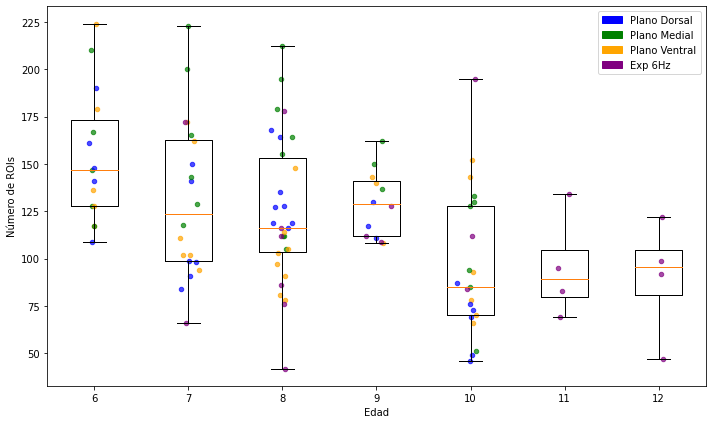

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# Supongamos que ya tienes definidos los diccionarios 'areas_1hz' y 'areas'
# donde en cada objeto se puede acceder a:
#   - areas[...] .trials[0].roi_activities['Hb']   --> para obtener el número de ROIs
#   - areas[...] .trials[0].data['Edad']              --> para obtener la edad (float, con valores de 6 a 12)

# Creamos un diccionario para agrupar por edad.
# Cada entrada tendrá como clave la edad y como valor una lista de tuplas (valor, trial_type).
data_by_age = {}

# Procesamos los datos de areas_1hz (se colorean según key[-1])
for key in areas_1hz:
    if '52' not in key:
        # Convertimos la edad a float (aunque sean enteros en valor)
        edad = float(areas_1hz[key].trials[0].data['Edad'])
        trial_type = key[-1]  # Se espera que sea '0', '1' o '2'
        valor = len(areas_1hz[key].trials[0].roi_activities['Hb'])
        data_by_age.setdefault(edad, []).append((valor, trial_type))

# Procesamos los datos de areas (a los que asignaremos un color fijo, por ejemplo 'special')
for key in areas:
    if '25' not in key:
        edad = float(areas[key].trials[0].data['Edad'])
        trial_type = 'special'
        valor = len(areas[key].trials[0].roi_activities['Hb'])
        data_by_age.setdefault(edad, []).append((valor, trial_type))

# Obtenemos las edades únicas ordenadas (serán las posiciones del eje x)
edades_unicas = sorted(data_by_age.keys())

# Preparamos los datos para el boxplot: para cada edad, extraemos la lista de valores (número de ROIs)
boxplot_data = []
for edad in edades_unicas:
    valores = [item[0] for item in data_by_age[edad]]
    boxplot_data.append(valores)

# Creamos la figura
plt.figure(figsize=(10, 6))

# Dibujamos los boxplots en las posiciones correspondientes (usamos las edades como posiciones)
plt.boxplot(boxplot_data, positions=edades_unicas, widths=0.5)

# Definimos el mapeo de colores:
# Para areas_1hz se colorea según trial_type ('0','1','2') y para areas se asigna un color fijo ('special')
color_mapping = {
    '0': 'blue',
    '1': 'green',
    '2': 'orange',
    'special': 'purple'
}

# Dibujamos los puntos con scatter (con un pequeño jitter en x para evitar solapamientos)
for edad in edades_unicas:
    for valor, trial_type in data_by_age[edad]:
        jitter = np.random.normal(loc=0, scale=0.05)
        x_val = edad + jitter
        plt.scatter(x_val, valor, color=color_mapping[trial_type], alpha=0.7, s=20)

plt.xlabel("Edad")
plt.ylabel("Número de ROIs")
# plt.title("Boxplot por Edad con puntos coloreados según trial type")

# Opcional: mostrar las edades como enteros en el eje x
plt.xticks(edades_unicas, [str(int(e)) for e in edades_unicas])


# positions, ['Plano Dorsal', 'Plano Medial', 'Plano Ventral', 'Exp 6Hz'])

# Creamos una leyenda personalizada
legend_handles = [
    mpatches.Patch(color=color_mapping['0'], label='Plano Dorsal'),
    mpatches.Patch(color=color_mapping['1'], label='Plano Medial'),
    mpatches.Patch(color=color_mapping['2'], label='Plano Ventral'),
    mpatches.Patch(color=color_mapping['special'], label='Exp 6Hz')
]
plt.legend(handles=legend_handles)

plt.tight_layout()
# plt.savefig('rois-alreves-png')
plt.show()


# Vamos a calcular cositas de los momento de sincronía


Prueba de Poisson:
- p-valor = 0.0000
- Eventos reales en el intervalo de estímulo = 86
- Eventos esperados según Poisson = 36.80
- Tasa de eventos estimada en el basal (λ) = 9.20 eventos/s


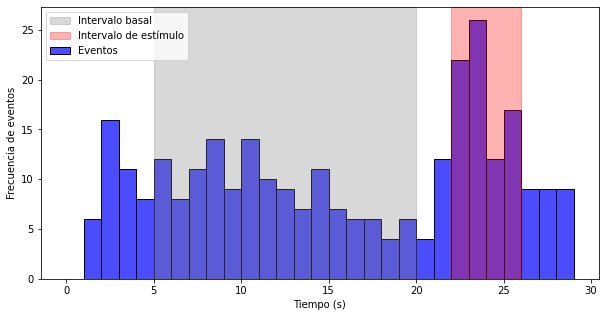

In [144]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

def eventos_en_intervalo(eventos, inicio, fin):
    """
    Cuenta cuántos eventos ocurren en un intervalo de tiempo dado.

    Args:
        eventos (array-like): Lista de tiempos de eventos.
        inicio (float): Inicio del intervalo de análisis.
        fin (float): Fin del intervalo de análisis.

    Returns:
        int: Número de eventos en el intervalo [inicio, fin].
    """
    return np.sum((eventos >= inicio) & (eventos <= fin))

def test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo):
    """
    Evalúa si el número de eventos en el intervalo de estimulación es mayor a lo esperado
    según una distribución de Poisson basada en el intervalo basal.

    Args:
        eventos (array-like): Lista de tiempos de eventos.
        inicio_basal (float): Inicio del intervalo basal.
        fin_basal (float): Fin del intervalo basal.
        inicio_estimulo (float): Inicio del intervalo de estímulo.
        fin_estimulo (float): Fin del intervalo de estímulo.

    Returns:
        float: p-valor basado en la distribución de Poisson.
        float: Número de eventos esperados en el intervalo de estimulación.
        int: Número de eventos reales en el intervalo de estimulación.
    """
    # Contar eventos en el intervalo basal
    n_basal = eventos_en_intervalo(eventos, inicio_basal, fin_basal)
    duracion_basal = fin_basal - inicio_basal

    # Tasa de eventos en el basal (lambda estimado)
    lambda_est = n_basal / duracion_basal  # Eventos por segundo

    # Contar eventos en el intervalo de estimulación
    n_real = eventos_en_intervalo(eventos, inicio_estimulo, fin_estimulo)
    duracion_estimulo = fin_estimulo - inicio_estimulo

    # Número esperado de eventos en el intervalo de estimulación
    n_esperado = lambda_est * duracion_estimulo

    # p-valor usando la distribución de Poisson
    p_valor = 1 - stats.poisson.cdf(n_real - 1, n_esperado)

    return p_valor, n_esperado, n_real, lambda_est

# # Simulación de eventos en un periodo de tiempo
# np.random.seed(42)
# eventos = np.sort(np.random.uniform(0, 100, 50))  # Simulación de eventos en 100s
eventos = np.array(sinc_mom_dic['A0-V1-LTrue-P1'])  # Simulamos eventos en 100s

# Definir intervalos
inicio_basal, fin_basal = 5, 20  # Intervalo basal de 0 a 20s
inicio_estimulo, fin_estimulo = 22, 26  # Intervalo de estímulo de 22 a 26s

# Aplicar la prueba de Poisson
p_poisson, n_esperado, n_real, lambda_est = test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)

print(f"\nPrueba de Poisson:")
print(f"- p-valor = {p_poisson:.4f}")
print(f"- Eventos reales en el intervalo de estímulo = {n_real}")
print(f"- Eventos esperados según Poisson = {n_esperado:.2f}")
print(f"- Tasa de eventos estimada en el basal (λ) = {lambda_est:.2f} eventos/s")
# Prepara el texto con tus resultados
texto = (
    f"Prueba de Poisson:\n"
    f"- p-valor = {p_poisson:.4f}\n"
    f"- Eventos reales en el intervalo = {n_real}\n"
    f"- Eventos esperados según Poisson = {n_esperado:.2f}\n"
    f"- Tasa estimada en el basal (λ) = {lambda_est:.2f} eventos/s"
)

# Opciones para el cuadro del texto
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
# Graficar histogramas de eventos antes y durante la estimulación
plt.figure(figsize=(10, 5))
sns.histplot(eventos, bins=np.arange(0, 30, 1), kde=False, color="blue", alpha=0.7, label="Eventos")
plt.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Intervalo basal")
plt.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Intervalo de estímulo")
plt.xlabel("Tiempo (s)")
plt.ylabel("Frecuencia de eventos")

plt.legend()
plt.show()


In [ ]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # Solo un plano
# Definir intervalos
inicio_basal, fin_basal = 5, 20  # Intervalo basal de 0 a 20s
inicio_estimulo, fin_estimulo = 22, 26  # Intervalo de estímulo de 22 a 26s
# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}
sinc_mom_dic = {}
match_order = True  # True para que los datos subsam sigan el orden del sin subsam

for planos in planos_values:
    # Crear dos figuras, una para datos sin subsampling y otra para datos con subsampling
    fig_no_subsam, axes_no_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                                 figsize=(20, 16), sharex=True, sharey=True)
    
    # fig_subsam, axes_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                        #    figsize=(20, 16), sharex=True, sharey=True)
    
    umbral = .4
    umbral_subsam = .35
    # kernel_no_subsam = np.array([1, 2, 1]) / 4  # Kernel original
    # kernel = np.array([1,2, 4,2, 1]) / 10

    fig_no_subsam.suptitle(f"Sync Moments (No Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)
    # fig_subsam.suptitle(f"Sync Moments (Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral_subsam}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                eventos = sinc_mom_dic[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}']
                p_poisson, n_esperado, n_real, lambda_est = test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)

                texto = (
                            f"Prueba de Poisson:\n"
                            f"- p-valor = {p_poisson:.4f}\n"
                            f"- Eventos reales en el intervalo = {n_real}\n"
                            f"- Eventos esperados según Poisson = {n_esperado:.2f}\n"
                            f"- Tasa estimada en el basal (λ) = {lambda_est:.2f} eventos/s"
                        )

                # Opciones para el cuadro del texto
                props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

                # Añade el texto al gráfico, usando coordenadas relativas al eje (0 a 1)
                ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=10,
                         verticalalignment='top', bbox=props)
                




                # Definir la posición del subplot
                ax_no_subsam = axes_no_subsam[i * len(vis_con_values) + j, k]
                # ax_subsam = axes_subsam[i * len(vis_con_values) + j, k]
                sinc_mom_dic[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia
                # Graficar histogramas sin subsampling
                if momentos_sincronia:
                    # bins = np.linspace(0, 230, 30)
                    # ax_no_subsam.hist(momentos_sincronia, bins=bins, color='blue', edgecolor='black')
                    # # ax_no_subsam.hist(momentos_sincronia,  bins=20, color='blue', edgecolor='black')
                    # ax_no_subsam.set_ylim(0, 40)
                    # momentos_sincronia_rescaled = np.array(momentos_sincronia) / 230 * 37
                    bins = np.linspace(0, 37, 30)  # Definir los bins en la escala correcta
                    ax_no_subsam.hist(momentos_sincronia, bins=bins, color='orange', edgecolor='black')
                    ax_no_subsam.set_ylim(0, 40)
                    ax_no_subsam.set_xlim(0, 37)  

                # # Graficar histogramas con subsampling
                # if momentos_sincronia_subsam:
                #     bins = np.linspace(0, 37, 30)
                #     ax_subsam.hist(momentos_sincronia_subsam, bins=bins, color='red', edgecolor='black')
                #     # ax_subsam.hist(momentos_sincronia_subsam,  color='red', edgecolor='black')
                #     ax_subsam.set_xlim(0, 37)  
                #     ax_subsam.set_ylim(0, 40)

                ax_no_subsam.set_ylabel("Sync Moments", fontsize=10)
                # ax_subsam.set_ylabel("Sync Moments", fontsize=10)

                # if j == len(vis_con_values) - 1:
                    # ax_no_subsam.set_xlabel("Time (seconds)", fontsize=10)
                    # ax_subsam.set_xlabel("Time (seconds)", fontsize=10)

                # Títulos de cada subplot
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax_no_subsam.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)
                # ax_subsam.set_title(f"{condition_label} - {side_label} (Subsam)", fontsize=10)

    # Ajustar el diseño y comentar el guardado de las figuras
    # plt.tight_layout(rect=[0, 0.03, 1, 0.97])

    # Guardar las figuras (COMENTADO PARA NO SOBREESCRIBIR)
    # plt.savefig(f"histogram_no_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')
    # plt.savefig(f"histogram_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')

    plt.show()

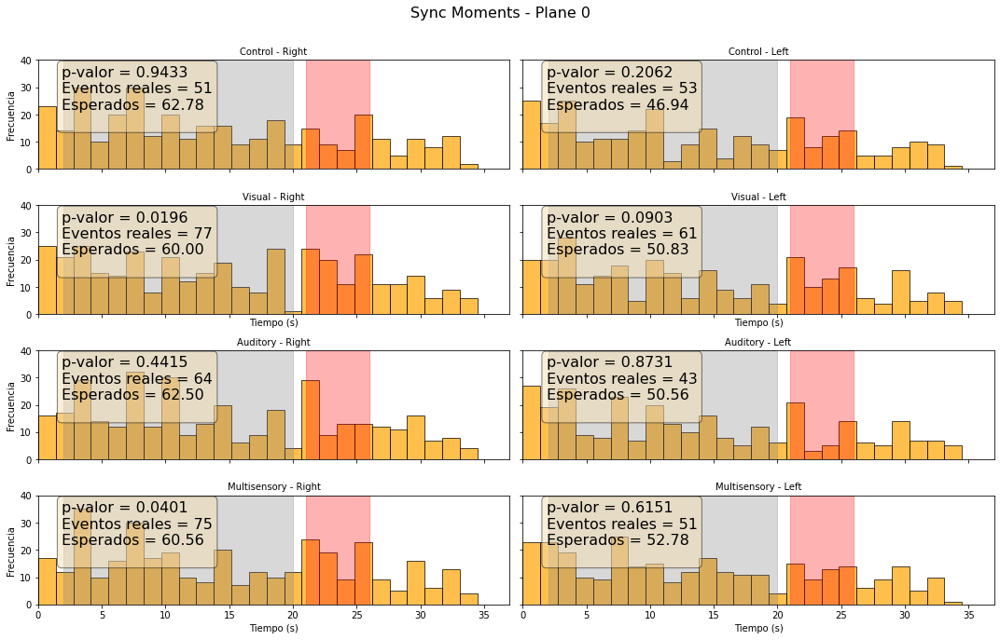

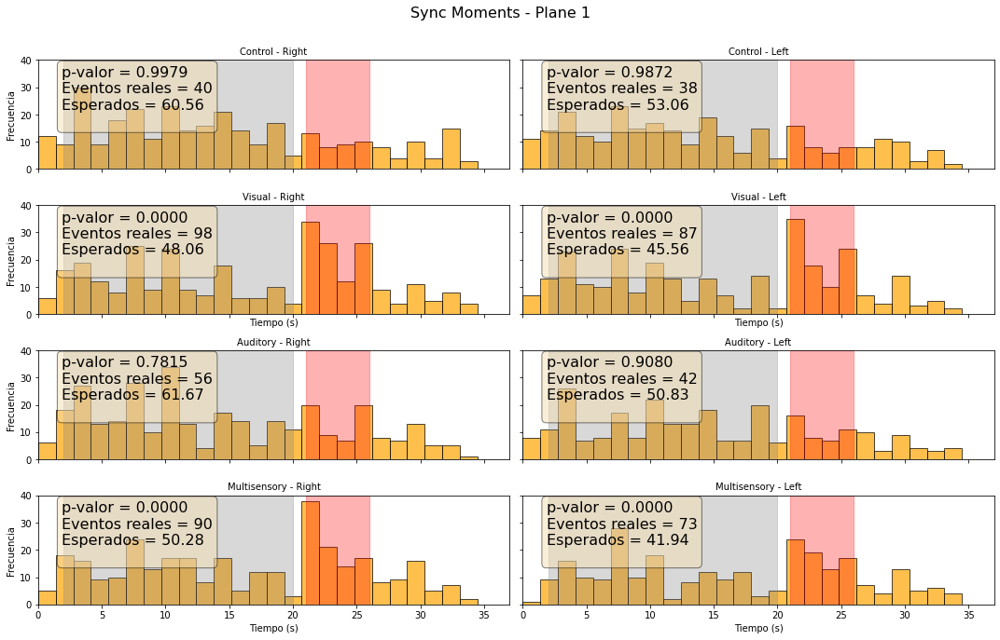

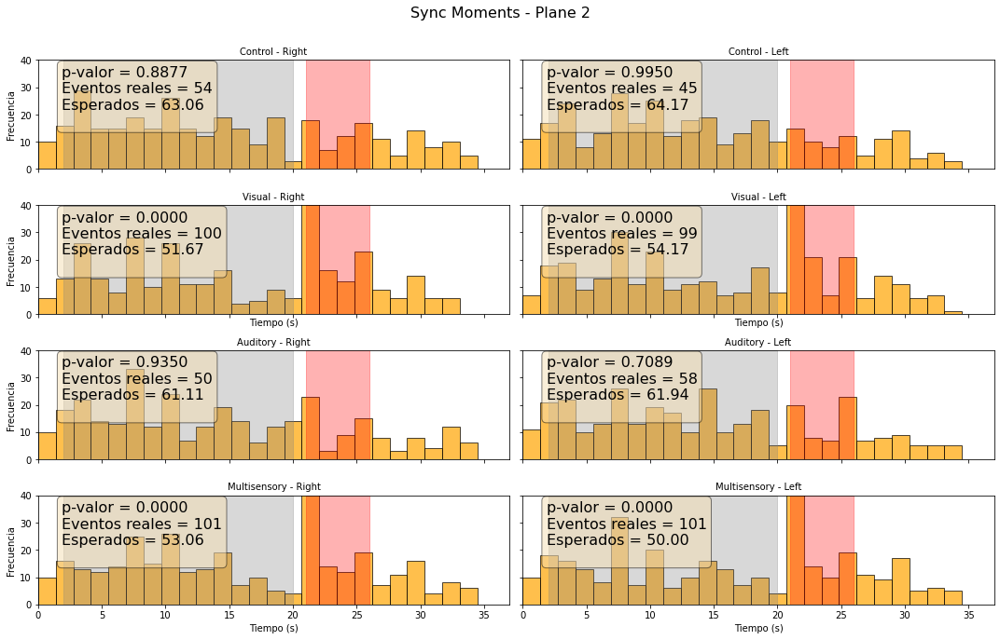

In [278]:


# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # Solo un plano

# Definir intervalos
inicio_basal, fin_basal = 2, 20  # Intervalo basal de 5 a 20s
inicio_estimulo, fin_estimulo = 21, 26  # Intervalo de estímulo de 22 a 26s

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

# # Simulación de eventos por condición
# np.random.seed(42)
# sinc_mom_dic = {
#     f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}': np.sort(np.random.uniform(0, 40, 50)) 
#     for aud_con in aud_con_values
#     for vis_con in vis_con_values
#     for leftie in leftie_values
#     for planos in planos_values
# }

# Función para contar eventos en un intervalo
def eventos_en_intervalo(eventos, inicio, fin):
    return np.sum((eventos >= inicio) & (eventos <= fin))

# Función para el test de Poisson
def test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo):
    n_basal = eventos_en_intervalo(eventos, inicio_basal, fin_basal)
    duracion_basal = fin_basal - inicio_basal

    lambda_est = n_basal / duracion_basal  # Tasa basal (eventos/s)

    n_real = eventos_en_intervalo(eventos, inicio_estimulo, fin_estimulo)
    duracion_estimulo = fin_estimulo - inicio_estimulo

    n_esperado = lambda_est * duracion_estimulo
    p_valor = 1 - stats.poisson.cdf(n_real - 1, n_esperado)

    return p_valor, n_esperado, n_real, lambda_est

# Generar gráficos por cada plano
for planos in planos_values:
    fig, axes = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                             figsize=(15, 10), sharex=True, sharey=True)

    fig.suptitle(f"Sync Moments - Plane {planos}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                eventos = np.array(sinc_mom_dic[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'])
                p_poisson, n_esperado, n_real, lambda_est = test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)

                # Seleccionar el subplot correcto
                ax = axes[i * len(vis_con_values) + j, k] if len(leftie_values) > 1 else axes[i * len(vis_con_values) + j]

                # Graficar histograma de eventos
                bins = np.linspace(0, 40, 30)
                ax.hist(eventos, bins=bins, color='orange', edgecolor='black', alpha=0.7)

                # Resaltar intervalos de análisis
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
                ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
                ax.set_ylim(0, 40)
                ax.set_xlim(0, 37)  
                # Texto con resultados del test de Poisson
                texto = (f"p-valor = {p_poisson:.4f}\n"
                         f"Eventos reales = {n_real}\n"
                         f"Esperados = {n_esperado:.2f}\n"
                         )
                props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
                ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=16,
                        verticalalignment='top', horizontalalignment='left',bbox=props)

                # Etiquetas y títulos
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax.set_title(f"{condition_label} - {side_label}", fontsize=10)

                if j == len(vis_con_values) - 1:
                    ax.set_xlabel("Tiempo (s)", fontsize=10)
                if k == 0:
                    ax.set_ylabel("Frecuencia", fontsize=10)

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


KeyError: 'A0-V0-LTrue-P0'

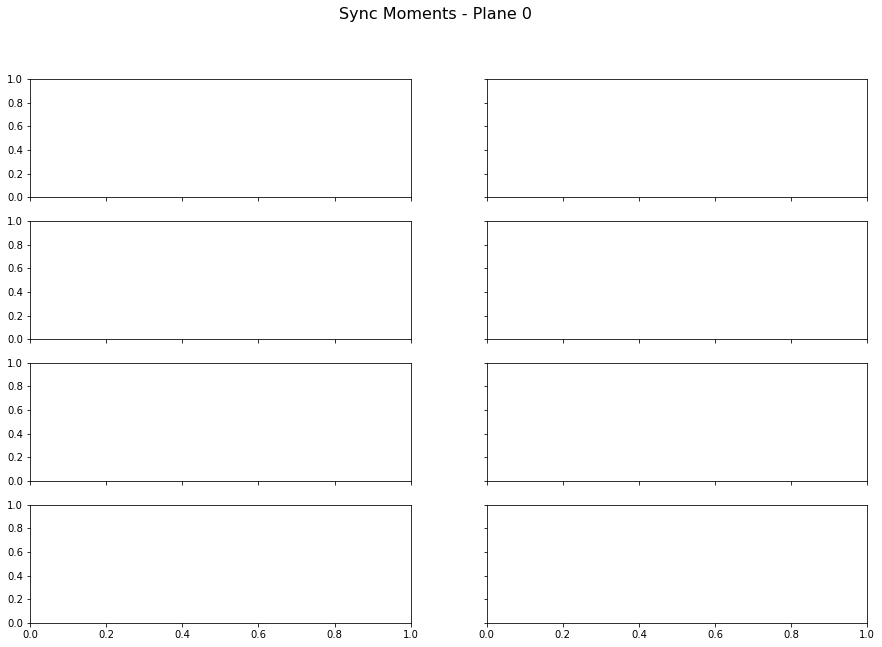

In [401]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # Solo un plano

# Definir intervalos
inicio_basal, fin_basal = 2, 20  # Intervalo basal de 2 a 20s
inicio_estimulo, fin_estimulo = 21, 26  # Intervalo de estímulo de 21 a 26s

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

# Ejemplo de generación de datos (simulación)
# Nota: Asegúrate de tener importadas las librerías necesarias: numpy, matplotlib.pyplot, scipy.stats


# Función para contar eventos en un intervalo
def eventos_en_intervalo(eventos, inicio, fin):
    return np.sum((eventos >= inicio) & (eventos <= fin))

# Función para el test de Poisson
def test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo):
    n_basal = eventos_en_intervalo(eventos, inicio_basal, fin_basal)
    duracion_basal = fin_basal - inicio_basal

    lambda_est = n_basal / duracion_basal  # Tasa basal (eventos/s)

    n_real = eventos_en_intervalo(eventos, inicio_estimulo, fin_estimulo)
    duracion_estimulo = fin_estimulo - inicio_estimulo

    n_esperado = lambda_est * duracion_estimulo
    p_valor = 1 - stats.poisson.cdf(n_real - 1, n_esperado)

    return p_valor, n_esperado, n_real, lambda_est

# Generar gráficos de línea por cada plano
for planos in planos_values:
    fig, axes = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                             figsize=(15, 10), sharex=True, sharey=True)

    fig.suptitle(f"Sync Moments - Plane {planos}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                eventos = np.array(sinc_mom_dic[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'])
                p_poisson, n_esperado, n_real, lambda_est = test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)

                # Seleccionar el subplot correcto
                ax = axes[i * len(vis_con_values) + j, k] if len(leftie_values) > 1 else axes[i * len(vis_con_values) + j]

                # Calcular histograma para usar en el plot de línea
                bins = np.linspace(0, 40, 30)
                counts, edges = np.histogram(eventos, bins=bins)
                centers = 0.5 * (edges[:-1] + edges[1:])

                # Graficar línea (en lugar de histograma)
                ax.plot(centers, counts, color='orange', marker='o', linestyle='-')

                # Resaltar intervalos de análisis
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
                ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
                ax.set_ylim(0, 40)
                ax.set_xlim(0, 37)  

                # Texto con resultados del test de Poisson
                texto = (f"p-valor = {p_poisson:.4f}\n"
                         f"Eventos reales = {n_real}\n"
                         f"Esperados = {n_esperado:.2f}\n")
                props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
                ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=16,
                        verticalalignment='top', horizontalalignment='left', bbox=props)

                # Etiquetas y títulos
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax.set_title(f"{condition_label} - {side_label}", fontsize=10)

                if j == len(vis_con_values) - 1:
                    ax.set_xlabel("Tiempo (s)", fontsize=10)
                if k == 0:
                    ax.set_ylabel("Frecuencia", fontsize=10)

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


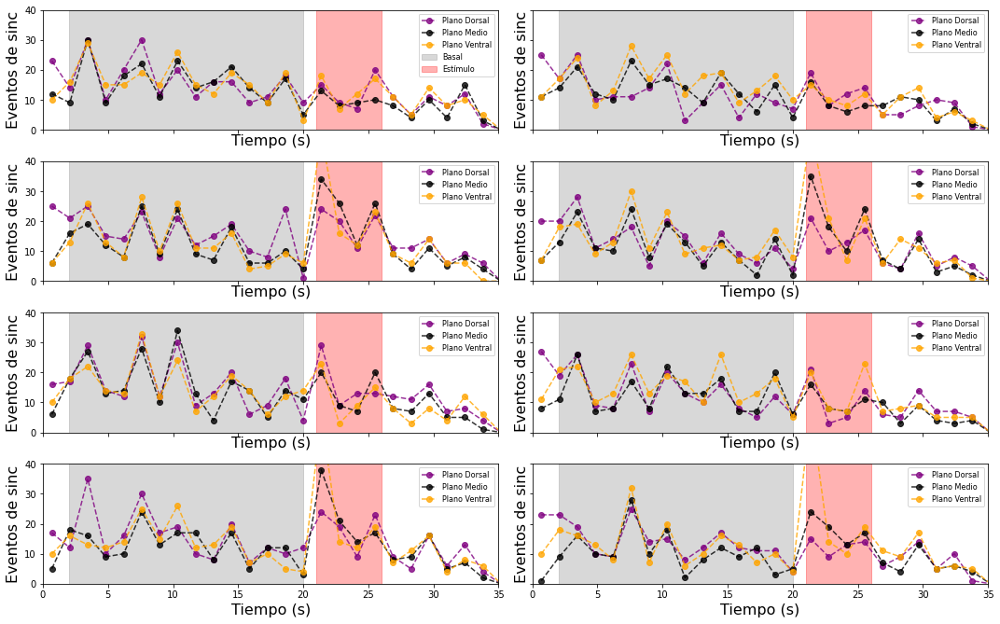

In [ ]:


# Se asume que ya dispones de tu diccionario 'sinc_mom_dic' con los datos.

# Definición de niveles y parámetros
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # 3 planos

inicio_basal, fin_basal = 2, 20      # Intervalo basal: de 2 a 20 s
inicio_estimulo, fin_estimulo = 21, 26 # Intervalo de estímulo: de 21 a 26 s

trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

# Funciones de análisis
def eventos_en_intervalo(eventos, inicio, fin):
    return np.sum((eventos >= inicio) & (eventos <= fin))

def test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo):
    n_basal = eventos_en_intervalo(eventos, inicio_basal, fin_basal)
    duracion_basal = fin_basal - inicio_basal
    lambda_est = n_basal / duracion_basal  # Tasa basal (eventos/s)
    
    n_real = eventos_en_intervalo(eventos, inicio_estimulo, fin_estimulo)
    duracion_estimulo = fin_estimulo - inicio_estimulo
    
    n_esperado = lambda_est * duracion_estimulo
    p_valor = 1 - stats.poisson.cdf(n_real - 1, n_esperado)
    
    return p_valor, n_esperado, n_real, lambda_est

# Mapeo de colores para cada plano
colores = {'0': 'purple', '1': 'black', '2': 'orange'}

# # Crear figura con 8 subplots (4 filas x 2 columnas)
#     fig, axes = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
#                              figsize=(15, 10), sharex=True, sharey=True)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 10), sharex=True, sharey=True)
axes = axes.flatten()  # para iterar fácilmente sobre ellos
plano_name = {'0':'Dorsal', '1':'Medio', '2': 'Ventral'}
plot_idx = 0
for aud_con in aud_con_values:
    for vis_con in vis_con_values:
        for leftie in leftie_values:
            ax = axes[plot_idx]
            plot_idx += 1

            # En cada subgráfico se trazan los 3 planos
            for planos in planos_values:
                key = f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'
                # Se asume que el diccionario ya contiene los datos para esta clave
                eventos = np.array(sinc_mom_dic[key])
                
                # Calcular histograma para generar los datos del trazo
                bins = np.linspace(0, 40, 30)
                counts, edges = np.histogram(eventos, bins=bins)
                centers = 0.5 * (edges[:-1] + edges[1:])
                
                ax.plot(centers, counts, color=colores[planos], marker='o', linestyle='--', alpha = .8,
                        label=f"Plano {plano_name[planos]}")
                
                # (Opcional) Si quieres obtener y usar los resultados del test de Poisson:
                p_poisson, n_esperado, n_real, lambda_est = test_poisson(
                    eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
                # Podrías incluir esta info en el label o en un recuadro de texto.
                # Por ejemplo:
                # ax.text(0.05, 0.9 - 0.1*int(planos), f"P{planos}: p={p_poisson:.4f}",
                #         transform=ax.transAxes, fontsize=8, color=colores[planos])
            
            # Resaltar los intervalos basal y de estímulo (solo se agregan labels en el 1er subplot)
            if plot_idx == 1:
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
                ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
            else:
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3)
                ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3)
            
            # Etiquetado del subgráfico
            condition_label = trial_labels.get((aud_con, vis_con), "")
            side_label = "Right" if leftie else "Left"
            # ax.set_title(f"{condition_label} - {side_label}", fontsize=10)
            ax.set_xlim(0, 35)
            ax.set_ylim(0, 40)
            ax.set_xlabel("Tiempo (s)", fontsize=16)
            ax.set_ylabel("Eventos de sinc", fontsize=16)
            ax.legend(fontsize=8)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig('testeo.pdf', dpi = 500)
plt.show()


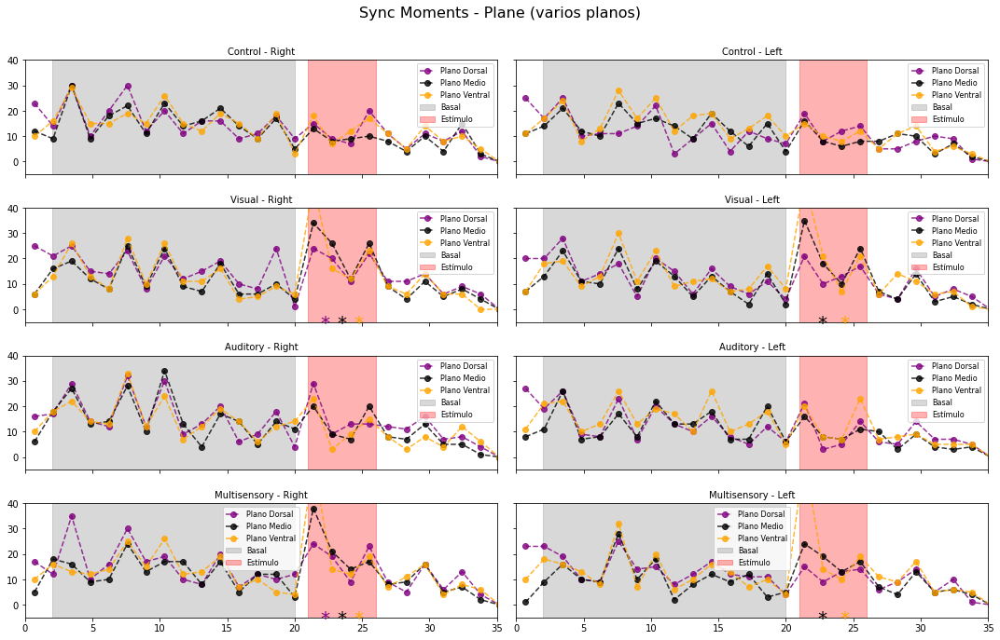

In [306]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# --- Definición de niveles y parámetros ---
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # 3 planos

inicio_basal, fin_basal = 2, 20      # Intervalo basal: de 2 a 20 s
inicio_estimulo, fin_estimulo = 21, 26 # Intervalo de estímulo: de 21 a 26 s

trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

# Mapeo de colores para cada plano
colores = {'0': 'purple', '1': 'black', '2': 'orange'}
plano_name = {'0':'Dorsal', '1':'Medio', '2': 'Ventral'}

# --- Funciones de análisis ---
def eventos_en_intervalo(eventos, inicio, fin):
    return np.sum((eventos >= inicio) & (eventos <= fin))

def test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo):
    n_basal = eventos_en_intervalo(eventos, inicio_basal, fin_basal)
    duracion_basal = fin_basal - inicio_basal
    lambda_est = n_basal / duracion_basal  # Tasa basal (eventos/s)
    
    n_real = eventos_en_intervalo(eventos, inicio_estimulo, fin_estimulo)
    duracion_estimulo = fin_estimulo - inicio_estimulo
    
    n_esperado = lambda_est * duracion_estimulo
    p_valor = 1 - stats.poisson.cdf(n_real - 1, n_esperado)
    
    return p_valor, n_esperado, n_real, lambda_est

# --- Creación de la figura ---
# Se crean 8 subplots (4 filas x 2 columnas)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 10), sharex=True, sharey=True)
axes = axes.flatten()  # Para iterar fácilmente
fig.suptitle("Sync Moments - Plane (varios planos)", fontsize=16)

# Se usará el diccionario 'sinc_mom_dic' (los datos que ya usas para graficar)
# Se asume que 'sinc_mom_dic' tiene claves del tipo: f'A{aud}-V{vis}-L{leftie}-P{planos}'

plot_idx = 0
# Recorrer combinaciones: 2 (aud) x 2 (vis) x 2 (leftie) = 8 subplots
for aud in aud_con_values:
    for vis in vis_con_values:
        for leftie in leftie_values:
            ax = axes[plot_idx]
            plot_idx += 1

            # Lista para recolectar los símbolos de significación para este subplot
            sig_markers = []  # cada elemento será una tupla (símbolo, color)

            # Se trazan los 3 planos en el mismo subplot
            for planos in planos_values:
                key = f'A{aud}-V{vis}-L{leftie}-P{planos}'
                # Se asume que el diccionario ya tiene los datos para esa clave
                eventos = np.array(sinc_mom_dic[key])
                
                # Calcular histograma (30 bins) y centros
                bins = np.linspace(0, 40, 30)
                counts, edges = np.histogram(eventos, bins=bins)
                centers = 0.5 * (edges[:-1] + edges[1:])
                dt = edges[1] - edges[0]
                
                # Trazar el perfil como línea (con puntos) en el color asignado al plano
                ax.plot(centers, counts, linestyle='--', marker='o', color=colores[planos],
                        alpha=0.8, label=f"Plano {plano_name[planos]}")
                
                # Aplicar test de Poisson para estos eventos
                p_val, n_esp, n_real, lambda_est = test_poisson(
                    eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
                
                # Calcular el valor esperado por bin (para el intervalo de estímulo)
                expected = lambda_est * dt
                # Se dibuja una línea punteada en el intervalo de estímulo (opcional)
                x_exp = np.linspace(inicio_estimulo, fin_estimulo, 100)
                y_exp = np.full_like(x_exp, expected)
                # ax.plot(x_exp, y_exp, linestyle=':', color=colores[planos], linewidth=2)
                
                # Si el p-valor es significativo, se agregará un asterisco para este plano
                if p_val < 0.05:
                    sig_markers.append( ("*", colores[planos]) )
            
            # Si se encontraron signos de significación en alguna de las trazas,
            # se colocan horizontalmente dentro del intervalo de estímulo, debajo del eje x.
            if sig_markers:
                width_est = fin_estimulo - inicio_estimulo
                spacing = width_est / (len(sig_markers) + 1)
                y_sig = -2  # Posición vertical fija para los símbolos (debajo del eje x)
                for idx, (sym, col_sym) in enumerate(sig_markers):
                    x_sig = inicio_estimulo + spacing * (idx + 1)
                    ax.text(x_sig, y_sig, sym, color=col_sym, fontsize=20, ha='center', va='top')
            
            # Resaltar intervalos basal y de estímulo
            ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
            ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
            ax.set_xlim(0, 35)
            # Extender el límite inferior para que se vean los asteriscos
            ax.set_ylim(-5, 40)
            
            # Etiquetas y título para el subplot
            condition_label = trial_labels.get((aud, vis), "")
            side_label = "Right" if leftie else "Left"
            ax.set_title(f"{condition_label} - {side_label}", fontsize=10)
            ax.legend(fontsize=8)
            
            # (Opcional) Agregar un recuadro con info del test
            # texto = (f"p = {p_val:.4f}\nReal = {n_real}\nExp = {n_esp:.2f}")
            # props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
            # ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=10,
            #         verticalalignment='top', horizontalalignment='left', bbox=props)
            

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig('1Hz-full colors.pdf')
plt.show()


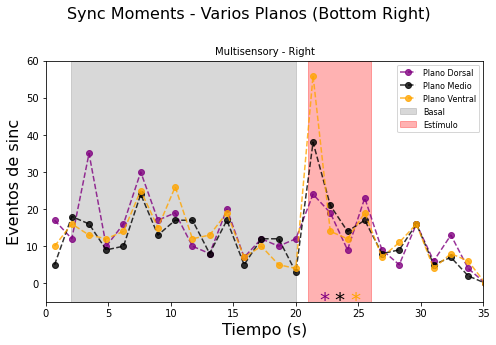

In [370]:

# --- Definición de niveles y parámetros ---
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # 3 planos

inicio_basal, fin_basal = 2, 20      # Intervalo basal: de 2 a 20 s
inicio_estimulo, fin_estimulo = 21, 26 # Intervalo de estímulo: de 21 a 26 s

trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

# Mapeo de colores para cada plano
colores = {'0': 'purple', '1': 'black', '2': 'orange'}
plano_name = {'0': 'Dorsal', '1': 'Medio', '2': 'Ventral'}

# --- Funciones de análisis ---
def eventos_en_intervalo(eventos, inicio, fin):
    return np.sum((eventos >= inicio) & (eventos <= fin))

def test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo):
    n_basal = eventos_en_intervalo(eventos, inicio_basal, fin_basal)
    duracion_basal = fin_basal - inicio_basal
    lambda_est = n_basal / duracion_basal  # Tasa basal (eventos/s)
    
    n_real = eventos_en_intervalo(eventos, inicio_estimulo, fin_estimulo)
    duracion_estimulo = fin_estimulo - inicio_estimulo
    
    n_esperado = lambda_est * duracion_estimulo
    p_valor = 1 - stats.poisson.cdf(n_real - 1, n_esperado)
    
    return p_valor, n_esperado, n_real, lambda_est

# --- Suposición de que 'sinc_mom_dic' ya está definido ---
# Se asume que 'sinc_mom_dic' tiene claves del tipo: f'A{aud}-V{vis}-L{leftie}-P{planos}'
# Por ejemplo: 'A1-V1-LFalse-P0', 'A1-V1-LFalse-P1', etc.

# --- Selección de la condición correspondiente al subplot de abajo a la derecha ---
# Según el orden del loop original, la última condición es:
aud = aud_con_values[-1]        # 1
vis = vis_con_values[-1]          # 1
leftie = leftie_values[0]        # False  --> corresponde a "Left" (ver nota en el título)

# Crear figura y eje único
fig, ax = plt.subplots(figsize=(7, 5))
fig.suptitle("Sync Moments - Varios Planos (Bottom Right)", fontsize=16)

# Lista para recolectar los símbolos de significación para este subplot
sig_markers = []  # Cada elemento será una tupla (símbolo, color)

# Se trazan los 3 planos en el mismo subplot
for planos in planos_values:
    key = f'A{aud}-V{vis}-L{leftie}-P{planos}'
    # Se asume que el diccionario ya tiene los datos para esa clave
    eventos = np.array(sinc_mom_dic[key])
    
    # Calcular histograma (30 bins) y centros
    bins = np.linspace(0, 40, 30)
    counts, edges = np.histogram(eventos, bins=bins)
    centers = 0.5 * (edges[:-1] + edges[1:])
    dt = edges[1] - edges[0]
    
    # Trazar el perfil como línea (con puntos) en el color asignado al plano
    ax.plot(centers, counts, linestyle='--', marker='o', color=colores[planos],
            alpha=0.8, label=f"Plano {plano_name[planos]}")
    
    # Aplicar test de Poisson para estos eventos
    p_val, n_esp, n_real, lambda_est = test_poisson(
        eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
    
    # Calcular el valor esperado por bin (para el intervalo de estímulo)
    expected = lambda_est * dt
    
    # Si el p-valor es significativo, se agregará un asterisco para este plano
    if p_val < 0.05:
        sig_markers.append( ("*", colores[planos]) )

# Si se encontraron signos de significación, se colocan horizontalmente
if sig_markers:
    width_est = fin_estimulo - inicio_estimulo
    spacing = width_est / (len(sig_markers) + 1)
    y_sig = -2  # Posición vertical fija para los símbolos (debajo del eje x)
    for idx, (sym, col_sym) in enumerate(sig_markers):
        x_sig = inicio_estimulo + spacing * (idx + 1)
        ax.text(x_sig, y_sig, sym, color=col_sym, fontsize=20, ha='center', va='top')

# Resaltar intervalos basal y de estímulo
ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
ax.set_xlim(0, 35)
ax.set_ylim(-5, 60)

# Etiquetas y título para el subplot
condition_label = trial_labels.get((aud, vis), "")
# Nota: En el código original se asigna "Right" si leftie es True y "Left" si es False.
side_label = "Right" if leftie else "Left"
ax.set_title(f"{condition_label} - {side_label}", fontsize=10)
ax.legend(fontsize=8)
# Etiquetas de ejes
ax.set_ylabel("Eventos de sinc", fontsize=16)
ax.set_xlabel("Tiempo (s)", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig('1Hz-bottomRight.png')
plt.show()


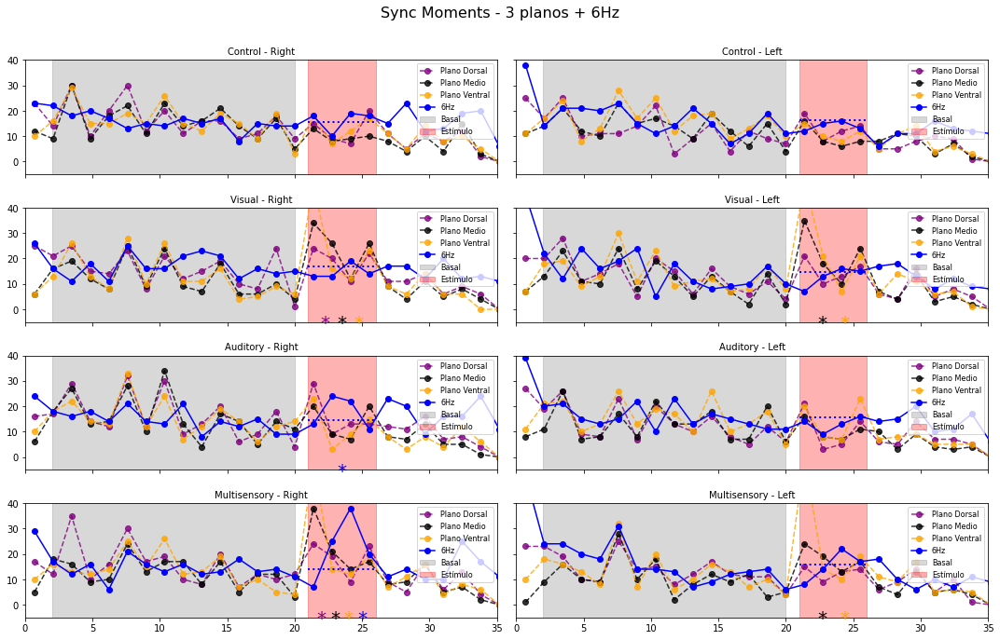

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# --- Definición de niveles y parámetros ---
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # 3 planos para sinc_mom_dic

# Intervalos de análisis
inicio_basal, fin_basal = 2, 20      # Intervalo basal: 2 a 20 s
inicio_estimulo, fin_estimulo = 21, 26 # Intervalo de estímulo: 21 a 26 s

# Etiquetas para condiciones (según (aud, vis))
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

# Mapeo de colores para cada plano (sinc_mom_dic)
colores = {'0': 'purple', '1': 'black', '2': 'orange'}
plano_name = {'0': 'Dorsal', '1': 'Medio', '2': 'Ventral'}

# --- Funciones de análisis ---
def eventos_en_intervalo(eventos, inicio, fin):
    return np.sum((eventos >= inicio) & (eventos <= fin))

def test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo):
    n_basal = eventos_en_intervalo(eventos, inicio_basal, fin_basal)
    duracion_basal = fin_basal - inicio_basal
    lambda_est = n_basal / duracion_basal  # Tasa basal (eventos/s)
    
    n_real = eventos_en_intervalo(eventos, inicio_estimulo, fin_estimulo)
    duracion_estimulo = fin_estimulo - inicio_estimulo
    n_esperado = lambda_est * duracion_estimulo
    p_valor = 1 - stats.poisson.cdf(n_real - 1, n_esperado)
    
    return p_valor, n_esperado, n_real, lambda_est

# --- Creación de la figura de 8 subplots ---
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 10), sharex=True, sharey=True)
axes = axes.flatten()  # Para iterar fácilmente
fig.suptitle("Sync Moments - 3 planos + 6Hz", fontsize=16)

plot_idx = 0
# Recorremos las 8 combinaciones (aud 2 x vis 2 x leftie 2)
for aud in aud_con_values:
    for vis in vis_con_values:
        for leftie in leftie_values:
            ax = axes[plot_idx]
            plot_idx += 1
            
            # Lista para acumular marcadores de significación
            sig_markers = []  # cada elemento: (símbolo, color)

            # --- Trazar los 3 planos (sinc_mom_dic) ---
            for planos in planos_values:
                key = f'A{aud}-V{vis}-L{leftie}-P{planos}'
                # Se asume que el diccionario ya tiene los datos para esa clave
                eventos = np.array(sinc_mom_dic[key])
                
                # Definir bins (30 bins) y calcular histograma y centros
                bins = np.linspace(0, 40, 30)
                counts, edges = np.histogram(eventos, bins=bins)
                centers = 0.5 * (edges[:-1] + edges[1:])
                dt = edges[1] - edges[0]
                
                # Trazar línea con puntos (estilo dashed) en el color asignado
                ax.plot(centers, counts, linestyle='--', marker='o', color=colores[planos],
                        alpha=0.8, label=f"Plano {plano_name[planos]}")
                
                # Test de Poisson para estos eventos
                p_val, n_esp, n_real, lambda_est = test_poisson(
                    eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
                
                # Si significativo, se acumula el marcador en el color del plano
                if p_val < 0.05:
                    sig_markers.append( ("*", colores[planos]) )
            
            # --- Trazar el 4to perfil: 6Hz (sinc_mom_dic_6Hz) para plano '1' ---
            # Se usa siempre el plano '1' para los datos de 6Hz
            key_6Hz = f'A{aud}-V{vis}-L{leftie}-P1'
            eventos_6Hz = np.array(sinc_mom_dic_6Hz[key_6Hz])
            
            # Usamos los mismos bins para calcular el histograma
            counts_6Hz, _ = np.histogram(eventos_6Hz, bins=bins)
            # Línea sólida con puntos, color azul
            ax.plot(centers, counts_6Hz, linestyle='-', marker='o', color='blue', label="6Hz")
            
            # Test de Poisson para 6Hz
            p_6Hz, n_esp_6Hz, n_real_6Hz, lambda_6Hz = test_poisson(
                eventos_6Hz, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
            
            # Calcular el valor esperado por bin para 6Hz y trazar línea punteada en el intervalo de estímulo
            expected_6Hz = lambda_6Hz * dt
            x_expected = np.linspace(inicio_estimulo, fin_estimulo, 100)
            y_expected_6Hz = np.full_like(x_expected, expected_6Hz)
            ax.plot(x_expected, y_expected_6Hz, linestyle=':', color='blue', linewidth=2)
            
            # Si el 6Hz es significativo, agregar marcador en azul
            if p_6Hz < 0.05:
                sig_markers.append( ("*", "blue") )
            
            # --- Colocar los símbolos de significación (si hay) en el intervalo de estímulo ---
            if sig_markers:
                width_est = fin_estimulo - inicio_estimulo
                spacing = width_est / (len(sig_markers) + 1)
                y_sig = -2  # posición vertical fija debajo del eje x
                for idx, (sym, col_sym) in enumerate(sig_markers):
                    x_sig = inicio_estimulo + spacing * (idx + 1)
                    ax.text(x_sig, y_sig, sym, color=col_sym, fontsize=20, ha='center', va='top')
            
            # --- Resaltar los intervalos basal y estímulo ---
            ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
            ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
            ax.set_xlim(0, 35)
            ax.set_ylim(-5, 40)
            
            # Título del subplot con condición y lado
            condition_label = trial_labels.get((aud, vis), "")
            side_label = "Right" if leftie else "Left"
            ax.set_title(f"{condition_label} - {side_label}", fontsize=10)
            ax.legend(fontsize=8)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
# plt.savefig('Sinc-full_4traces.pdf')
plt.show()


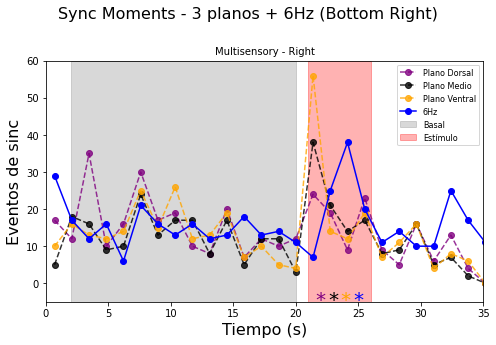

In [372]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# --- Definición de niveles y parámetros ---
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # 3 planos para sinc_mom_dic

# Intervalos de análisis
inicio_basal, fin_basal = 2, 20      # Intervalo basal: 2 a 20 s
inicio_estimulo, fin_estimulo = 21, 26 # Intervalo de estímulo: 21 a 26 s

# Etiquetas para condiciones (según (aud, vis))
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

# Mapeo de colores para cada plano (sinc_mom_dic)
colores = {'0': 'purple', '1': 'black', '2': 'orange'}
plano_name = {'0': 'Dorsal', '1': 'Medio', '2': 'Ventral'}

# --- Funciones de análisis ---
def eventos_en_intervalo(eventos, inicio, fin):
    return np.sum((eventos >= inicio) & (eventos <= fin))

def test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo):
    n_basal = eventos_en_intervalo(eventos, inicio_basal, fin_basal)
    duracion_basal = fin_basal - inicio_basal
    lambda_est = n_basal / duracion_basal  # Tasa basal (eventos/s)
    
    n_real = eventos_en_intervalo(eventos, inicio_estimulo, fin_estimulo)
    duracion_estimulo = fin_estimulo - inicio_estimulo
    n_esperado = lambda_est * duracion_estimulo
    p_valor = 1 - stats.poisson.cdf(n_real - 1, n_esperado)
    
    return p_valor, n_esperado, n_real, lambda_est

# --- SUPOSICIÓN ---
# Se asume que los diccionarios 'sinc_mom_dic' y 'sinc_mom_dic_6Hz' ya están definidos
# y contienen las claves con el siguiente formato:
# 'A{aud}-V{vis}-L{leftie}-P{planos}' para sinc_mom_dic y
# 'A{aud}-V{vis}-L{leftie}-P1' para sinc_mom_dic_6Hz

# --- Seleccionar la condición correspondiente al "bottom right" ---
# Según el orden original, la última combinación es:
aud = aud_con_values[-1]   # 1
vis = vis_con_values[-1]     # 1
leftie = leftie_values[0]   # False  -> Según el código: leftie False se etiqueta como "Left"

# Crear figura y eje único
fig, ax = plt.subplots(figsize=(7, 5))
fig.suptitle("Sync Moments - 3 planos + 6Hz (Bottom Right)", fontsize=16)

# Lista para acumular marcadores de significación
sig_markers = []  # Cada elemento: (símbolo, color)

# --- Trazar los 3 planos (sinc_mom_dic) ---
# Se definen los bins (30 bins) para todos los perfiles
bins = np.linspace(0, 40, 30)
dt = bins[1] - bins[0]
centers = 0.5 * (bins[:-1] + bins[1:])

for planos in planos_values:
    key = f'A{aud}-V{vis}-L{leftie}-P{planos}'
    # Se asume que el diccionario ya tiene los datos para esa clave
    eventos = np.array(sinc_mom_dic[key])
    
    # Calcular histograma
    counts, _ = np.histogram(eventos, bins=bins)
    
    # Trazar línea con puntos (estilo dashed) en el color asignado
    ax.plot(centers, counts, linestyle='--', marker='o', color=colores[planos],
            alpha=0.8, label=f"Plano {plano_name[planos]}")
    
    # Test de Poisson para estos eventos
    p_val, n_esp, n_real, lambda_est = test_poisson(
        eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
    
    # Si significativo, acumular el marcador en el color correspondiente
    if p_val < 0.05:
        sig_markers.append( ("*", colores[planos]) )

# --- Trazar el 4to perfil: 6Hz (sinc_mom_dic_6Hz) para el plano '1' ---
key_6Hz = f'A{aud}-V{vis}-L{leftie}-P1'
eventos_6Hz = np.array(sinc_mom_dic_6Hz[key_6Hz])
counts_6Hz, _ = np.histogram(eventos_6Hz, bins=bins)
# Trazar línea sólida con puntos en color azul
ax.plot(centers, counts_6Hz, linestyle='-', marker='o', color='blue', label="6Hz")

# Test de Poisson para 6Hz
p_6Hz, n_esp_6Hz, n_real_6Hz, lambda_6Hz = test_poisson(
    eventos_6Hz, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
expected_6Hz = lambda_6Hz * dt
x_expected = np.linspace(inicio_estimulo, fin_estimulo, 100)
y_expected_6Hz = np.full_like(x_expected, expected_6Hz)
# ax.plot(x_expected, y_expected_6Hz, linestyle=':', color='blue', linewidth=2)

# Si 6Hz es significativo, agregar marcador en azul
if p_6Hz < 0.05:
    sig_markers.append( ("*", "blue") )

# --- Colocar los símbolos de significación en el intervalo de estímulo ---
if sig_markers:
    width_est = fin_estimulo - inicio_estimulo
    spacing = width_est / (len(sig_markers) + 1)
    y_sig = -2  # posición vertical fija (debajo del eje x)
    for idx, (sym, col_sym) in enumerate(sig_markers):
        x_sig = inicio_estimulo + spacing * (idx + 1)
        ax.text(x_sig, y_sig, sym, color=col_sym, fontsize=20, ha='center', va='top')

# --- Resaltar los intervalos basal y estímulo ---
ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
ax.set_xlim(0, 35)
ax.set_ylim(-5, 60)

# Título del subplot con la condición y el lado
condition_label = trial_labels.get((aud, vis), "")
side_label = "Right" if leftie else "Left"
ax.set_title(f"{condition_label} - {side_label}", fontsize=10)
ax.legend(fontsize=8)
ax.set_ylabel("Eventos de sinc", fontsize=16)
ax.set_xlabel("Tiempo (s)", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig('Sinc-full_4traces_bottomRight.png')
plt.show()


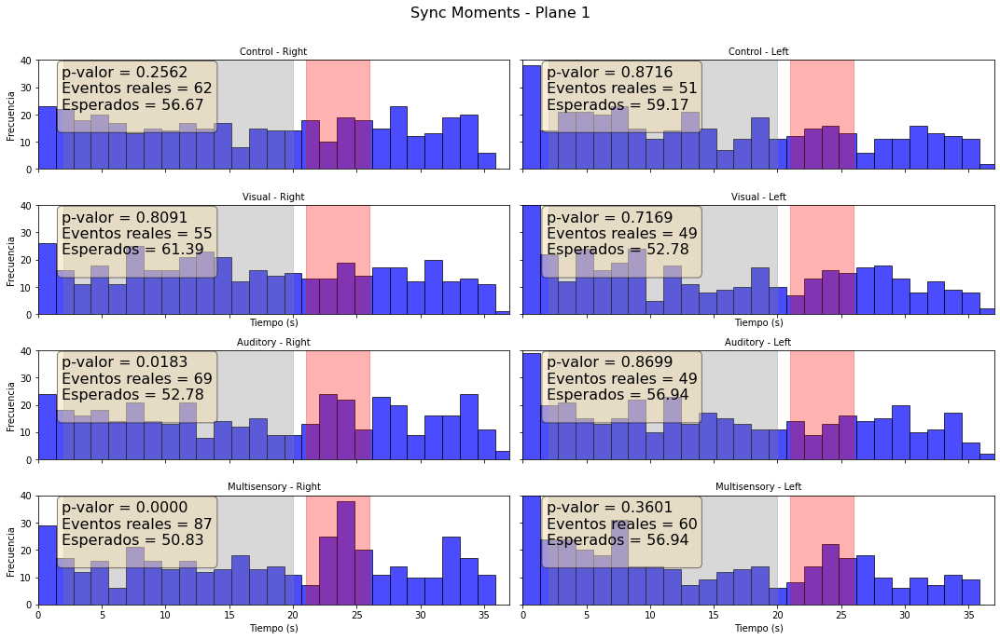

In [169]:
planos_values = ['1']  # Solo un plano

# Generar gráficos por cada plano
for planos in planos_values:
    fig, axes = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                             figsize=(15, 10), sharex=True, sharey=True)

    fig.suptitle(f"Sync Moments - Plane {planos}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                eventos = np.array(sinc_mom_dic_6Hz[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'])
                p_poisson, n_esperado, n_real, lambda_est = test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)

                # Seleccionar el subplot correcto
                ax = axes[i * len(vis_con_values) + j, k] if len(leftie_values) > 1 else axes[i * len(vis_con_values) + j]

                # Graficar histograma de eventos
                bins = np.linspace(0, 40, 30)
                ax.hist(eventos, bins=bins, color='blue', edgecolor='black', alpha=0.7)

                # Resaltar intervalos de análisis
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
                ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
                ax.set_ylim(0, 40)
                ax.set_xlim(0, 37)
                # Texto con resultados del test de Poisson
                texto = (f"p-valor = {p_poisson:.4f}\n"
                         f"Eventos reales = {n_real}\n"
                         f"Esperados = {n_esperado:.2f}\n"
                         )
                props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
                ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=16,
                        verticalalignment='top', horizontalalignment='left',bbox=props)

                # Etiquetas y títulos
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax.set_title(f"{condition_label} - {side_label}", fontsize=10)

                if j == len(vis_con_values) - 1:
                    ax.set_xlabel("Tiempo (s)", fontsize=10)
                if k == 0:
                    ax.set_ylabel("Frecuencia", fontsize=10)

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()

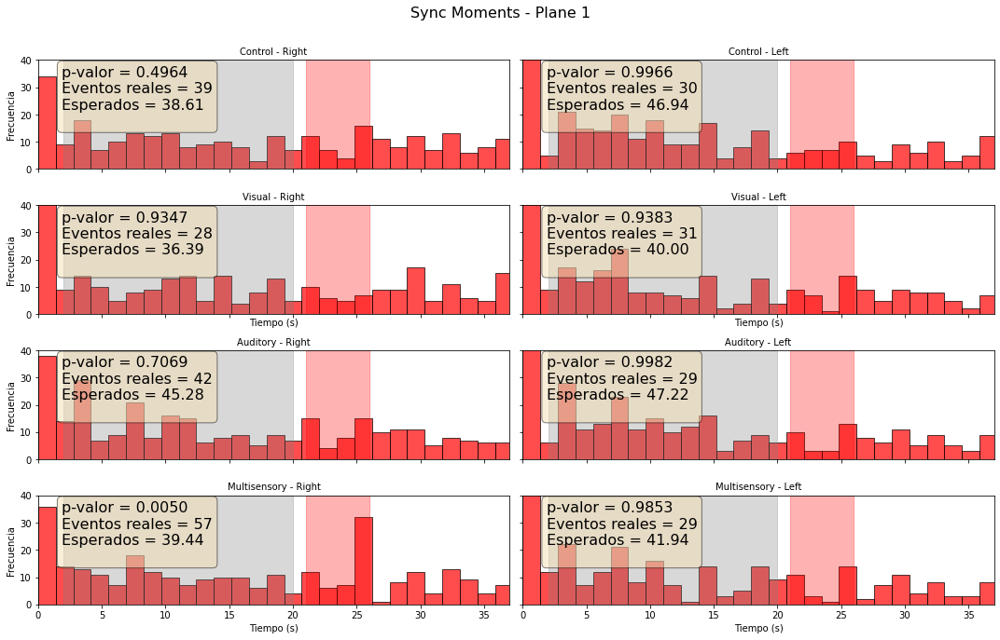

In [168]:
planos_values = ['1']  # Solo un plano

# Generar gráficos por cada plano
for planos in planos_values:
    fig, axes = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                             figsize=(15, 10), sharex=True, sharey=True)

    fig.suptitle(f"Sync Moments - Plane {planos}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                eventos = np.array(sinc_mom_dic_6Hz_subsam[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'])
                p_poisson, n_esperado, n_real, lambda_est = test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)

                # Seleccionar el subplot correcto
                ax = axes[i * len(vis_con_values) + j, k] if len(leftie_values) > 1 else axes[i * len(vis_con_values) + j]

                # Graficar histograma de eventos
                bins = np.linspace(0, 40, 30)
                ax.hist(eventos, bins=bins, color='red', edgecolor='black', alpha=0.7)

                # Resaltar intervalos de análisis
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
                ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
                ax.set_ylim(0, 40)
                ax.set_xlim(0, 37)
                # Texto con resultados del test de Poisson
                texto = (f"p-valor = {p_poisson:.4f}\n"
                         f"Eventos reales = {n_real}\n"
                         f"Esperados = {n_esperado:.2f}\n"
                         )
                props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
                ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=16,
                        verticalalignment='top', horizontalalignment='left',bbox=props)

                # Etiquetas y títulos
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax.set_title(f"{condition_label} - {side_label}", fontsize=10)

                if j == len(vis_con_values) - 1:
                    ax.set_xlabel("Tiempo (s)", fontsize=10)
                if k == 0:
                    ax.set_ylabel("Frecuencia", fontsize=10)

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()

Vamos con las punteadas:

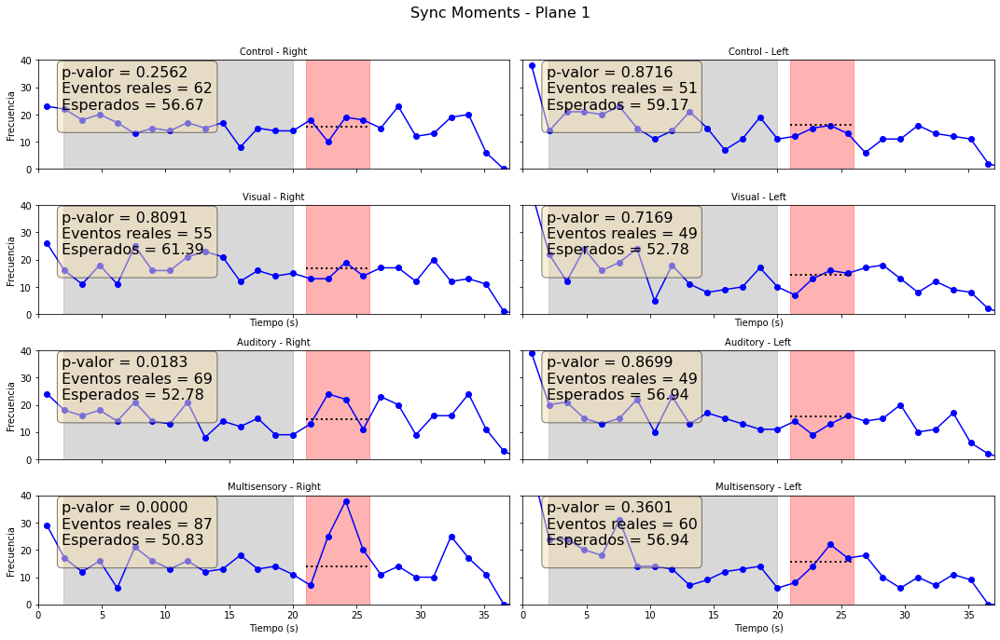

In [307]:
planos_values = ['1']  # Solo un plano

# Generar gráficos por cada plano
for planos in planos_values:
    fig, axes = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                             figsize=(15, 10), sharex=True, sharey=True)

    fig.suptitle(f"Sync Moments - Plane {planos}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                # Extraer eventos del diccionario
                eventos = np.array(sinc_mom_dic_6Hz[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'])
                p_poisson, n_esperado, n_real, lambda_est = test_poisson(eventos,
                                                                           inicio_basal, fin_basal,
                                                                           inicio_estimulo, fin_estimulo)

                # Seleccionar el subplot correcto
                ax = axes[i * len(vis_con_values) + j, k] if len(leftie_values) > 1 else axes[i * len(vis_con_values) + j]

                # Definir bins y calcular el histograma
                bins = np.linspace(0, 40, 30)
                counts, bin_edges = np.histogram(eventos, bins=bins)
                bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

                # Graficar línea con marcadores: línea sólida con puntos, color azul
                ax.plot(bin_centers, counts, linestyle='-', marker='o', color='blue')

                # Resaltar intervalos de análisis
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
                ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")

                # Agregar línea punteada en la zona roja con el valor esperado de eventos por bin.
                # Calculamos el ancho de cada bin (dt)
                dt = bins[1] - bins[0]
                # Se asume que la tasa basal (lambda_est) es constante, por lo que el valor esperado por bin es:
                expected_bin_value = lambda_est * dt
                # Se genera la línea punteada únicamente en el intervalo del estímulo
                x_expected = np.linspace(inicio_estimulo, fin_estimulo, 100)
                y_expected = np.full_like(x_expected, expected_bin_value)
                ax.plot(x_expected, y_expected, linestyle=':', color='black', linewidth=2)

                ax.set_ylim(0, 40)
                ax.set_xlim(0, 37)

                # Texto con resultados del test de Poisson
                texto = (f"p-valor = {p_poisson:.4f}\n"
                         f"Eventos reales = {n_real}\n"
                         f"Esperados = {n_esperado:.2f}\n")
                props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
                ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=16,
                        verticalalignment='top', horizontalalignment='left', bbox=props)

                # Etiquetas y títulos
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax.set_title(f"{condition_label} - {side_label}", fontsize=10)

                if j == len(vis_con_values) - 1:
                    ax.set_xlabel("Tiempo (s)", fontsize=10)
                if k == 0:
                    ax.set_ylabel("Frecuencia", fontsize=10)

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


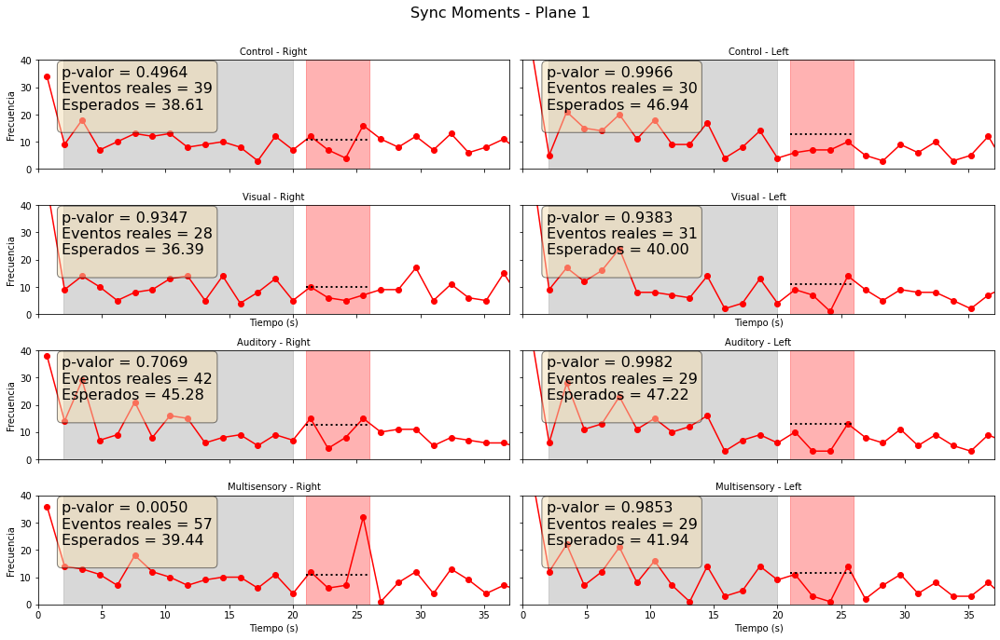

In [220]:
planos_values = ['1']  # Solo un plano

# Generar gráficos por cada plano
for planos in planos_values:
    fig, axes = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                             figsize=(15, 10), sharex=True, sharey=True)

    fig.suptitle(f"Sync Moments - Plane {planos}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                # Extraer datos de eventos
                eventos = np.array(sinc_mom_dic_6Hz_subsam[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'])
                p_poisson, n_esperado, n_real, lambda_est = test_poisson(eventos,
                                                                           inicio_basal, fin_basal,
                                                                           inicio_estimulo, fin_estimulo)

                # Seleccionar el subplot correcto
                ax = axes[i * len(vis_con_values) + j, k] if len(leftie_values) > 1 else axes[i * len(vis_con_values) + j]

                # Definir bins y calcular el histograma
                bins = np.linspace(0, 40, 30)
                counts, bin_edges = np.histogram(eventos, bins=bins)
                bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

                # Graficar línea con marcadores (línea sólida con puntos) en color rojo
                ax.plot(bin_centers, counts, linestyle='-', marker='o', color='red')

                # Resaltar intervalos de análisis
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
                ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
                ax.set_ylim(0, 40)
                ax.set_xlim(0, 37)

                # Agregar línea punteada en la zona de estímulo con el valor esperado por bin
                dt = bins[1] - bins[0]  # ancho de cada bin
                expected_bin_value = lambda_est * dt  # valor esperado en cada bin
                x_expected = np.linspace(inicio_estimulo, fin_estimulo, 100)
                y_expected = np.full_like(x_expected, expected_bin_value)
                ax.plot(x_expected, y_expected, linestyle=':', color='black', linewidth=2)

                # Texto con resultados del test de Poisson
                texto = (f"p-valor = {p_poisson:.4f}\n"
                         f"Eventos reales = {n_real}\n"
                         f"Esperados = {n_esperado:.2f}\n")
                props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
                ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=16,
                        verticalalignment='top', horizontalalignment='left', bbox=props)

                # Etiquetas y títulos
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax.set_title(f"{condition_label} - {side_label}", fontsize=10)

                if j == len(vis_con_values) - 1:
                    ax.set_xlabel("Tiempo (s)", fontsize=10)
                if k == 0:
                    ax.set_ylabel("Frecuencia", fontsize=10)

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


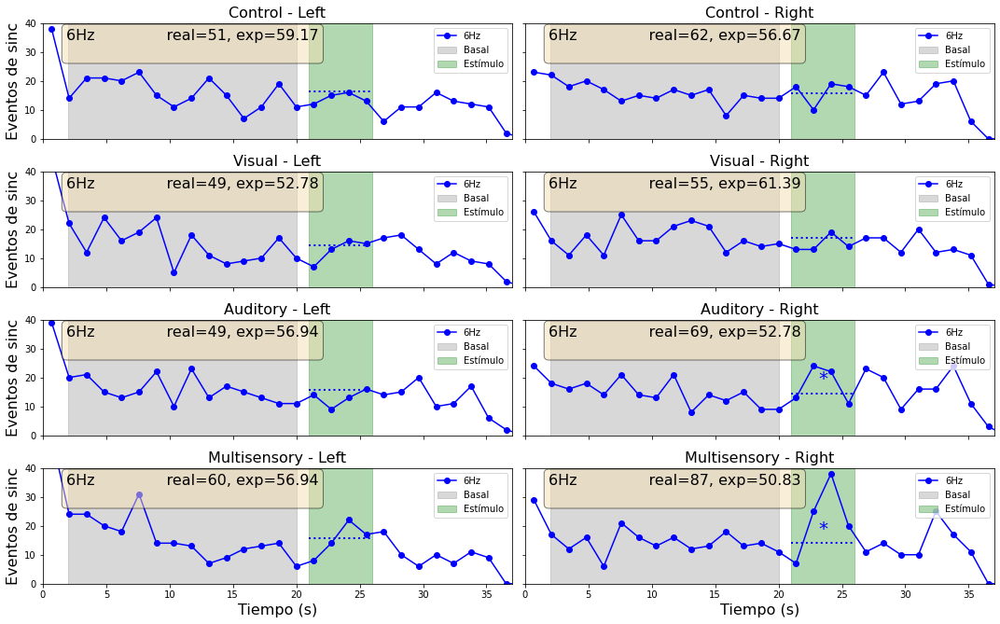

In [249]:
# Suponiendo que las siguientes variables ya están definidas:
# aud_con_values, vis_con_values, leftie_values, trial_labels
# inicio_basal, fin_basal, inicio_estimulo, fin_estimulo
# sinc_mom_dic_6Hz_subsam, sinc_mom_dic_6Hz
# test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
# Y que 'planos_values' es una lista (en este caso, solo '1').

# --- Definir cuál valor de leftie_values corresponde a cada lado:
# Se asume que leftie_values contiene dos valores, donde:
# - El segundo valor corresponde a "Left"
# - El primero corresponde a "Right"
left_val  = leftie_values[1]   # para Left
right_val = leftie_values[0]   # para Right

planos_values = ['1']  # Solo un plano

for planos in planos_values:
    # Se organiza la grilla: cada combinación (aud_con, vis_con) ocupará una fila,
    # y se mostrarán dos subplots por fila (columna 0: Left, columna 1: Right)
    num_rows = len(aud_con_values) * len(vis_con_values)
    num_cols = 2  # Left y Right
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10), sharex=True, sharey=True)
    # fig.suptitle(f"Sync Moments - Plane {planos}", fontsize=16)
    
    row = 0  # índice de fila en la grilla de subplots
    for aud_con in aud_con_values:
        for vis_con in vis_con_values:
            # Para cada combinación (aud_con, vis_con), se dibujan dos subplots:
            # uno para "Left" y otro para "Right"
            for col, (side_val, side_label) in enumerate([(left_val, "Left"), (right_val, "Right")]):
                # Seleccionar el subplot correspondiente
                ax = axes[row, col] if num_rows > 1 else axes[col]
                
                # Definir los bins comunes
                bins = np.linspace(0, 40, 30)
                dt = bins[1] - bins[0]
                bin_edges = bins
                bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
                
                # --- Datos de sinc_mom_dic_6Hz (se dibujan en azul)
                key_6Hz = f'A{aud_con}-V{vis_con}-L{side_val}-P{planos}'
                eventos_6Hz = np.array(sinc_mom_dic_6Hz[key_6Hz])
                p_6Hz, n_esperado_6Hz, n_real_6Hz, lambda_6Hz = test_poisson(
                    eventos_6Hz, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
                counts_6Hz, _ = np.histogram(eventos_6Hz, bins=bins)
                
                # Línea sólida con marcadores (en azul)
                ax.plot(bin_centers, counts_6Hz, linestyle='-', marker='o', color='blue', label="6Hz")
                # Línea punteada con el valor esperado por bin
                expected_6Hz = lambda_6Hz * dt
                x_expected = np.linspace(inicio_estimulo, fin_estimulo, 100)
                y_expected_6Hz = np.full_like(x_expected, expected_6Hz)
                ax.plot(x_expected, y_expected_6Hz, linestyle=':', color='blue', linewidth=2)
                # Agregar asterisco si el p-valor es significativo (p < 0.05)
                if p_6Hz < 0.05:
                    x_ast = (inicio_estimulo + fin_estimulo) / 2
                    y_ast = expected_6Hz + 2  # offset vertical
                    ax.text(x_ast, y_ast, '*', color='blue', fontsize=20, ha='center', va='bottom')
                
                # --- Sombreado de zonas: basal (gris) y estímulo (verde)
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
                ax.axvspan(inicio_estimulo, fin_estimulo, color='green', alpha=0.3, label="Estímulo")
                
                ax.set_ylim(0, 40)
                ax.set_xlim(0, 37)
                ax.legend()
                # Texto con resultados del test (solo datos azules)
                texto = (f"6Hz               real={n_real_6Hz}, exp={n_esperado_6Hz:.2f}\n")
                props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
                ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=16,
                        verticalalignment='top', horizontalalignment='left', bbox=props)
                
                # Título del subplot: condición y lado
                condition_label = trial_labels[(aud_con, vis_con)]
                ax.set_title(f"{condition_label} - {side_label}", fontsize=16)
                
                # Etiquetas de ejes: se colocan en la primera columna y en la última fila
                if col == 0:
                    ax.set_ylabel("Eventos de sinc", fontsize=16)
                if row == num_rows - 1:
                    ax.set_xlabel("Tiempo (s)", fontsize=16)
            row += 1  # pasar a la siguiente fila
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    # plt.savefig('Sinc-6Hz.pdf')
    plt.show()


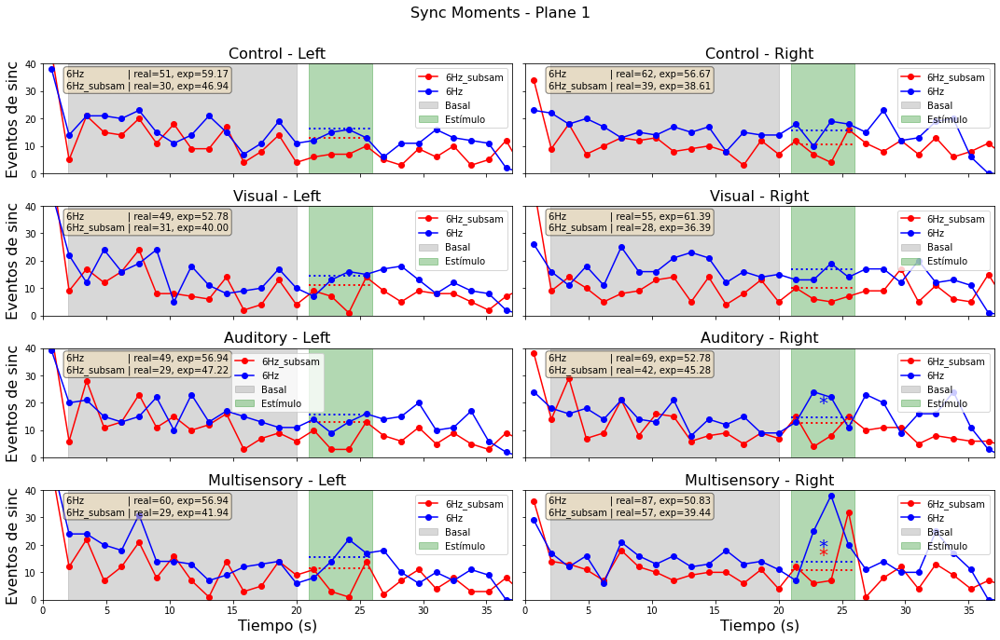

In [250]:
# Suponiendo que las siguientes variables ya están definidas:
# aud_con_values, vis_con_values, leftie_values, trial_labels
# inicio_basal, fin_basal, inicio_estimulo, fin_estimulo
# sinc_mom_dic_6Hz_subsam, sinc_mom_dic_6Hz
# test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
# Y que 'planos_values' es una lista (en este caso, solo '1').

# --- Definir cuál valor de leftie_values corresponde a cada lado:
# Por ejemplo, si leftie_values = ['R', 'L'] pero queremos que la columna 0 sea Left
# entonces definimos:
right_val = leftie_values[0]   # valor que originalmente es "Right"
left_val  = leftie_values[1]   # valor que originalmente es "Left"

planos_values = ['1']  # Solo un plano

for planos in planos_values:
    # Calcular número de filas: una por cada combinación de (aud_con, vis_con)
    num_rows = len(aud_con_values) * len(vis_con_values)
    num_cols = 2  # Columna 0: Left, Columna 1: Right

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10), sharex=True, sharey=True)
    fig.suptitle(f"Sync Moments - Plane {planos}", fontsize=16)

    row = 0  # índice de fila en la grilla de subplots
    for aud_con in aud_con_values:
        for vis_con in vis_con_values:
            # Para cada combinación (aud_con, vis_con) se dibujan dos gráficos:
            for col, (side_val, side_label) in enumerate([(left_val, "Left"), (right_val, "Right")]):
                # Seleccionar el subplot correspondiente (si hay una sola fila, axes es 1D)
                ax = axes[row, col] if num_rows > 1 else axes[col]

                # Definir bins comunes
                bins = np.linspace(0, 40, 30)
                dt = bins[1] - bins[0]
                bin_edges = bins
                bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

                # --- Datos de sinc_mom_dic_6Hz_subsam (se dibujan en rojo)
                key_subsam = f'A{aud_con}-V{vis_con}-L{side_val}-P{planos}'
                eventos_subsam = np.array(sinc_mom_dic_6Hz_subsam[key_subsam])
                p_subsam, n_esperado_subsam, n_real_subsam, lambda_subsam = test_poisson(
                    eventos_subsam, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
                counts_subsam, _ = np.histogram(eventos_subsam, bins=bins)
                ax.plot(bin_centers, counts_subsam, linestyle='-', marker='o', color='red', label="6Hz_subsam")
                expected_subsam = lambda_subsam * dt
                x_expected = np.linspace(inicio_estimulo, fin_estimulo, 100)
                y_expected_subsam = np.full_like(x_expected, expected_subsam)
                ax.plot(x_expected, y_expected_subsam, linestyle=':', color='red', linewidth=2)
                if p_subsam < 0.05:
                    x_ast = (inicio_estimulo + fin_estimulo) / 2
                    y_ast = expected_subsam + 2
                    ax.text(x_ast, y_ast, '*', color='red', fontsize=20, ha='center', va='bottom')

                # --- Datos de sinc_mom_dic_6Hz (se dibujan en azul)
                key_6Hz = f'A{aud_con}-V{vis_con}-L{side_val}-P{planos}'
                eventos_6Hz = np.array(sinc_mom_dic_6Hz[key_6Hz])
                p_6Hz, n_esperado_6Hz, n_real_6Hz, lambda_6Hz = test_poisson(
                    eventos_6Hz, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
                counts_6Hz, _ = np.histogram(eventos_6Hz, bins=bins)
                ax.plot(bin_centers, counts_6Hz, linestyle='-', marker='o', color='blue', label="6Hz")
                expected_6Hz = lambda_6Hz * dt
                y_expected_6Hz = np.full_like(x_expected, expected_6Hz)
                ax.plot(x_expected, y_expected_6Hz, linestyle=':', color='blue', linewidth=2)
                if p_6Hz < 0.05:
                    x_ast = (inicio_estimulo + fin_estimulo) / 2
                    y_ast = expected_6Hz + 2
                    ax.text(x_ast, y_ast, '*', color='blue', fontsize=20, ha='center', va='bottom')

                # --- Sombreado de zonas: basal y estímulo (la zona de estímulo se pinta en verde)
                ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
                ax.axvspan(inicio_estimulo, fin_estimulo, color='green', alpha=0.3, label="Estímulo")
                ax.legend()
                ax.set_ylim(0, 40)
                ax.set_xlim(0, 37)

                # Texto con resultados del test (combinando ambos)
                texto = (f"6Hz               | real={n_real_6Hz}, exp={n_esperado_6Hz:.2f}\n"
                         f"6Hz_subsam | real={n_real_subsam}, exp={n_esperado_subsam:.2f}")
                props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
                ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=10,
                        verticalalignment='top', horizontalalignment='left', bbox=props)

                # Título del subplot: se incluye la condición y el lado
                condition_label = trial_labels[(aud_con, vis_con)]
                ax.set_title(f"{condition_label} - {side_label}", fontsize=16)

                # Etiquetas de eje (se colocan solo en la columna izquierda y en la última fila)
                if col == 0:
                    ax.set_ylabel("Eventos de sinc", fontsize=16)
                if row == num_rows - 1:
                    ax.set_xlabel("Tiempo (s)", fontsize=16)

            row += 1  # pasar a la siguiente fila

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.savefig('Sinc-6Hz-vs-seusam.pdf')
    plt.show()


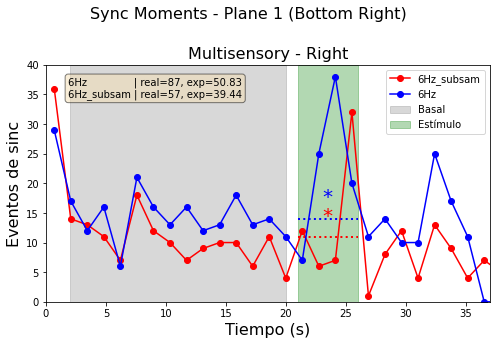

In [359]:
# --- Suponiendo que las siguientes variables ya están definidas:
# aud_con_values, vis_con_values, leftie_values, trial_labels
# inicio_basal, fin_basal, inicio_estimulo, fin_estimulo
# sinc_mom_dic_6Hz_subsam, sinc_mom_dic_6Hz
# test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)

# Definir cuál valor de leftie_values corresponde a cada lado:
# Por ejemplo, si leftie_values = ['R', 'L'] pero queremos que la columna 0 sea Left
right_val = leftie_values[0]   # originalmente "Right"
left_val  = leftie_values[1]   # originalmente "Left"

planos = '1'  # Solo un plano

# Seleccionar la última combinación para aud_con y vis_con (la de abajo a la derecha)
aud_con = aud_con_values[-1]
vis_con = vis_con_values[-1]
side_val = right_val    # Para el lado "Right"
side_label = "Right"

# Crear figura y eje único
fig, ax = plt.subplots(figsize=(7, 5))
fig.suptitle(f"Sync Moments - Plane {planos} (Bottom Right)", fontsize=16)

# Definir bins comunes
bins = np.linspace(0, 40, 30)
dt = bins[1] - bins[0]
bin_edges = bins
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
x_expected = np.linspace(inicio_estimulo, fin_estimulo, 100)

# # --- Datos de sinc_mom_dic_6Hz_subsam (se dibujan en rojo)
key_subsam = f'A{aud_con}-V{vis_con}-L{side_val}-P{planos}'
eventos_subsam = np.array(sinc_mom_dic_6Hz_subsam[key_subsam])
p_subsam, n_esperado_subsam, n_real_subsam, lambda_subsam = test_poisson(
    eventos_subsam, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
counts_subsam, _ = np.histogram(eventos_subsam, bins=bins)
ax.plot(bin_centers, counts_subsam, linestyle='-', marker='o', color='red', label="6Hz_subsam")
expected_subsam = lambda_subsam * dt
y_expected_subsam = np.full_like(x_expected, expected_subsam)
ax.plot(x_expected, y_expected_subsam, linestyle=':', color='red', linewidth=2)
if p_subsam < 0.05:
    x_ast = (inicio_estimulo + fin_estimulo) / 2
    y_ast = expected_subsam + 2
    ax.text(x_ast, y_ast, '*', color='red', fontsize=20, ha='center', va='bottom')

# --- Datos de sinc_mom_dic_6Hz (se dibujan en azul)
key_6Hz = f'A{aud_con}-V{vis_con}-L{side_val}-P{planos}'
eventos_6Hz = np.array(sinc_mom_dic_6Hz[key_6Hz])
p_6Hz, n_esperado_6Hz, n_real_6Hz, lambda_6Hz = test_poisson(
    eventos_6Hz, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
counts_6Hz, _ = np.histogram(eventos_6Hz, bins=bins)
ax.plot(bin_centers, counts_6Hz, linestyle='-', marker='o', color='blue', label="6Hz")
expected_6Hz = lambda_6Hz * dt
y_expected_6Hz = np.full_like(x_expected, expected_6Hz)
ax.plot(x_expected, y_expected_6Hz, linestyle=':', color='blue', linewidth=2)
if p_6Hz < 0.05:
    x_ast = (inicio_estimulo + fin_estimulo) / 2
    y_ast = expected_6Hz + 2
    ax.text(x_ast, y_ast, '*', color='blue', fontsize=20, ha='center', va='bottom')

# --- Sombreado de zonas: basal y estímulo
ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
ax.axvspan(inicio_estimulo, fin_estimulo, color='green', alpha=0.3, label="Estímulo")
ax.legend()

# Límites de los ejes
ax.set_ylim(0, 40)
ax.set_xlim(0, 37)

# Texto con resultados del test
texto = (f"6Hz               | real={n_real_6Hz}, exp={n_esperado_6Hz:.2f}\n"
         f"6Hz_subsam | real={n_real_subsam}, exp={n_esperado_subsam:.2f}")
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', horizontalalignment='left', bbox=props)

# Título del subplot: se incluye la condición y el lado
condition_label = trial_labels[(aud_con, vis_con)]
ax.set_title(f"{condition_label} - {side_label}", fontsize=16)

# Etiquetas de ejes
ax.set_ylabel("Eventos de sinc", fontsize=16)
ax.set_xlabel("Tiempo (s)", fontsize=16)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig('Sinc-6Hz-vs-seusam_bottomRight.png')
plt.show()


Contemos eventos por condición

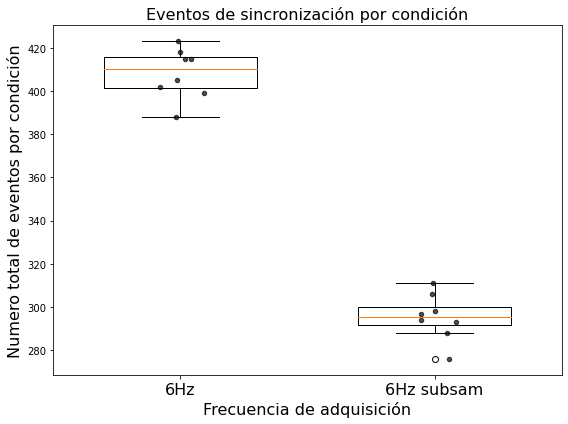

In [259]:

# Supongamos que ya tienes definidos los siguientes diccionarios:
# sinc_mom_dic, sinc_mom_dic_6Hz, sinc_mom_dic_6Hz_subsam

# Calculamos la longitud de cada lista en cada diccionario peri estimulo 
# data_sinc_mom         = [len(np.array(val)[(np.array(val)>inicio_estimulo) & (np.array(val)<fin_estimulo)]) for val in sinc_mom_dic.values()]
# data_sinc_mom_6Hz     = [len(np.array(val)[(np.array(val)>inicio_estimulo) & (np.array(val)<fin_estimulo)]) for val in sinc_mom_dic_6Hz.values()]
# data_sinc_mom_6Hz_subsam = [len(np.array(val)[(np.array(val)>inicio_estimulo) & (np.array(val)<fin_estimulo)]) for val in sinc_mom_dic_6Hz_subsam.values()]



# Calculamos la longitud de cada lista en cada diccionario full
# data_sinc_mom         = [len(val) for val in sinc_mom_dic.values()]
data_sinc_mom_6Hz     = [len(val) for val in sinc_mom_dic_6Hz.values()]
data_sinc_mom_6Hz_subsam = [len(val) for val in sinc_mom_dic_6Hz_subsam.values()]

# Agrupamos los datos para el boxplot
# data = [data_sinc_mom_6Hz, data_sinc_mom_6Hz_subsam, data_sinc_mom]
data = [data_sinc_mom_6Hz, data_sinc_mom_6Hz_subsam]

# Creamos la figura
plt.figure(figsize=(8, 6))

# Posiciones para cada boxplot
# positions = [1, 2, 3]
positions = [1, 2]

# Dibujamos los boxplots
plt.boxplot(data, positions=positions, widths=0.6)

# Añadimos los puntos individuales con un pequeño jitter en x
for i, d in enumerate(data, start=1):
    x_jitter = np.random.normal(loc=i, scale=0.05, size=len(d))
    plt.scatter(x_jitter, d, color='black', alpha=0.7, s=20)

# Configuramos el eje x
# plt.xticks(positions, [ "6Hz", "6Hz subsam", "1Hz"])
plt.xticks(positions, [ "6Hz", "6Hz subsam"],fontsize=16)
plt.xlabel("Frecuencia de adquisición", fontsize=16)
plt.ylabel("Numero total de eventos por condición", fontsize=16)
# plt.title("Eventos de sincronización por experimento peri estímulo")
plt.title("Eventos de sincronización por condición", fontsize=16)

plt.tight_layout()
plt.savefig('conteo_eventos.png')
plt.show()


Vamos a pullear todos los planos juntos

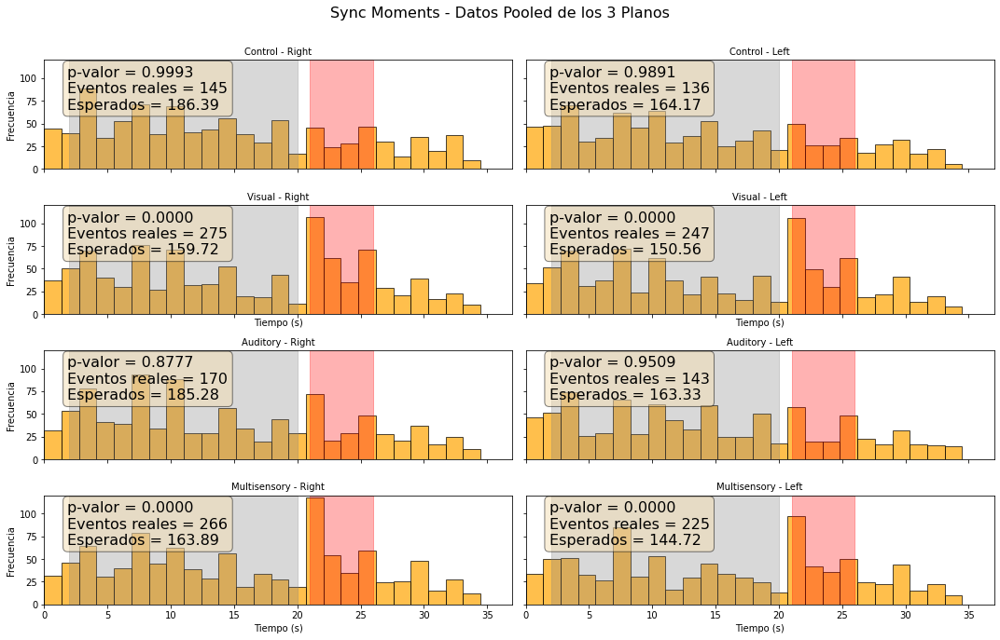

In [406]:

aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # Tres planos

# Definir intervalos
inicio_basal, fin_basal = 2, 20      # Intervalo basal (2 a 20 s)
inicio_estimulo, fin_estimulo = 21, 26 # Intervalo de estímulo (21 a 26 s)

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}


# Función para contar eventos en un intervalo
def eventos_en_intervalo(eventos, inicio, fin):
    return np.sum((eventos >= inicio) & (eventos <= fin))

# Función para el test de Poisson
def test_poisson(eventos, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo):
    n_basal = eventos_en_intervalo(eventos, inicio_basal, fin_basal)
    duracion_basal = fin_basal - inicio_basal

    lambda_est = n_basal / duracion_basal  # Tasa basal (eventos/s)

    n_real = eventos_en_intervalo(eventos, inicio_estimulo, fin_estimulo)
    duracion_estimulo = fin_estimulo - inicio_estimulo

    n_esperado = lambda_est * duracion_estimulo
    p_valor = 1 - stats.poisson.cdf(n_real - 1, n_esperado)

    return p_valor, n_esperado, n_real, lambda_est

# Crear una única figura con subplots
# Se organiza la figura con filas = len(aud_con_values)*len(vis_con_values) y columnas = len(leftie_values)
fig, axes = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                         figsize=(15, 10), sharex=True, sharey=True)
fig.suptitle("Sync Moments - Datos Pooled de los 3 Planos", fontsize=16)

# Loop anidado sobre condiciones: auditiva, visual y lateralidad
for i, aud_con in enumerate(aud_con_values):
    for j, vis_con in enumerate(vis_con_values):
        for k, leftie in enumerate(leftie_values):
            # Pullear (combinar) los datos de los 3 planos para la condición actual
            combined_events = np.concatenate([
                sinc_mom_dic[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}']
                for planos in planos_values
            ])

            # Realizar el test de Poisson sobre los datos combinados
            p_poisson, n_esperado, n_real, lambda_est = test_poisson(
                combined_events, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo
            )

            # Seleccionar el subplot correspondiente
            idx = i * len(vis_con_values) + j
            ax = axes[idx, k] if len(leftie_values) > 1 else axes[idx]

            # Graficar histograma de eventos combinados
            bins = np.linspace(0, 40, 30)
            ax.hist(combined_events, bins=bins, color='orange', edgecolor='black', alpha=0.7)

            # Resaltar los intervalos de análisis (basal y estímulo)
            ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
            ax.axvspan(inicio_estimulo, fin_estimulo, color='red', alpha=0.3, label="Estímulo")
            ax.set_ylim(0, 120)
            ax.set_xlim(0, 37)

            # Añadir texto con los resultados del test de Poisson
            texto = (f"p-valor = {p_poisson:.4f}\n"
                     f"Eventos reales = {n_real}\n"
                     f"Esperados = {n_esperado:.2f}")
            props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
            ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=16,
                    verticalalignment='top', horizontalalignment='left', bbox=props)

            # Etiquetado del subplot según condición
            condition_label = trial_labels[(aud_con, vis_con)]
            side_label = "Right" if leftie else "Left"
            ax.set_title(f"{condition_label} - {side_label}", fontsize=10)

            # Etiquetas en los ejes
            if j == len(vis_con_values) - 1:
                ax.set_xlabel("Tiempo (s)", fontsize=10)
            if k == 0:
                ax.set_ylabel("Frecuencia", fontsize=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


In [395]:
# areas_1hz['29-0'].__dict__.keys()
areas_1hz['31-2'].z

117.0

In [379]:
key_purgada = []
for key in areas_1hz:
    if key[:-2] not in key_purgada:
        key_purgada.append(key[:-2] )
        print(key[:-2] )

29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
52
53
54
55
56
57
58


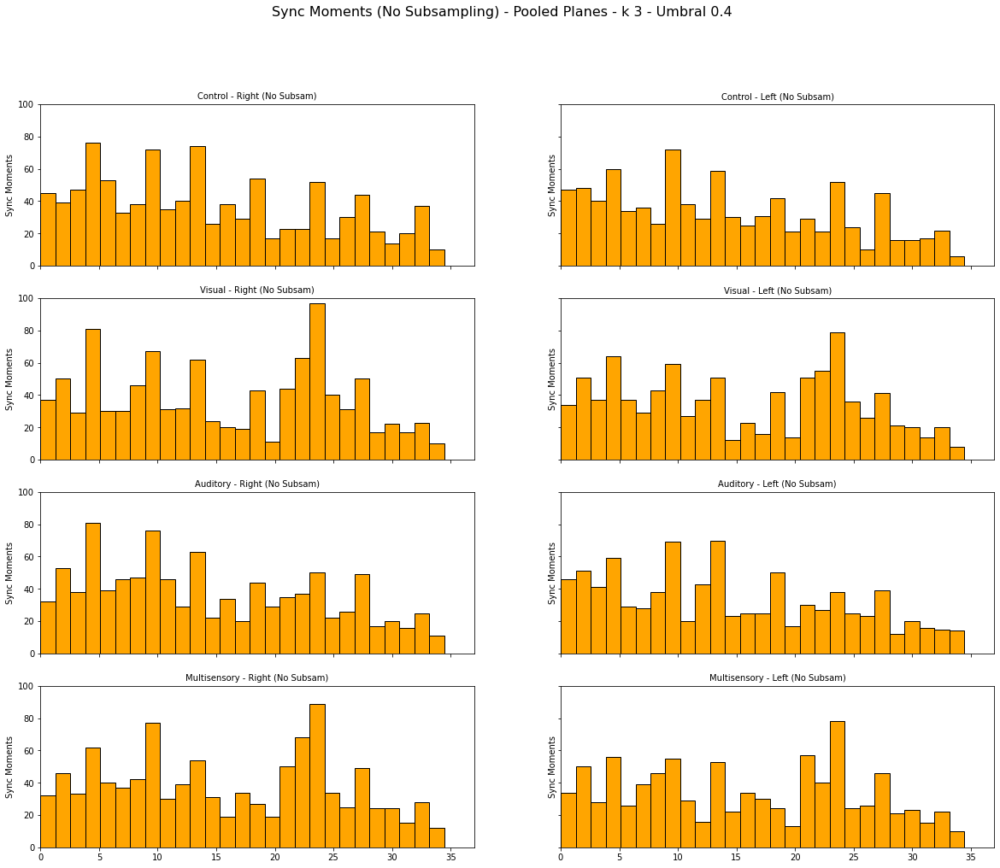

In [409]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # Tres planos

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

sinc_mom_dic = {}
match_order = True  # True para que los datos subsam sigan el orden del sin subsam

# Parámetros y configuración
umbral = 0.4
umbral_subsam = 0.35
kernel_no_subsam = np.array([1, 2, 1]) / 4  # Kernel original
# kernel = np.array([1, 2, 4, 2, 1]) / 10

# Crear una única figura para datos sin subsampling (pooling de los 3 planos)
fig_no_subsam, axes_no_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                             figsize=(20, 16), sharex=True, sharey=True)
fig_no_subsam.suptitle(f"Sync Moments (No Subsampling) - Pooled Planes - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)

# Loop anidado sobre condiciones: auditiva, visual y lateralidad
for i, aud_con in enumerate(aud_con_values):
    for j, vis_con in enumerate(vis_con_values):
        for k, leftie in enumerate(leftie_values):
            momentos_sincronia = []
            # Iterar sobre todas las áreas (pooling de los 3 planos)
            for key in areas_1hz:
                # Asegurarse de trabajar solo con áreas que pertenezcan a uno de los planos deseados
                if '52' not in key and key[-1] in planos_values:
                    for trial in areas_1hz[key].trials:
                        if trial.vis == vis_con and trial.aud == aud_con:
                            # Datos sin subsampling
                            data_array = trial.roi_dffs["Hb"][areas_1hz[key].roi_lefties['Hb'] == leftie]
                            first_event_indices = np.argmax(data_array, axis=1)
                            sorted_indices = np.argsort(first_event_indices)
                            sorted_data_array = data_array[sorted_indices]

                            # Normalización Z-score
                            data_z = sorted_data_array - np.expand_dims(np.mean(sorted_data_array, axis=1), axis=1)
                            data_z = data_z / np.expand_dims(np.std(sorted_data_array, axis=1), axis=1)

                            # Filtrado con kernel ajustado
                            promedio_data_z = data_z.mean(axis=0)
                            promedio_data_z_filtrada = np.convolve(promedio_data_z, kernel_no_subsam, mode='same')

                            # Detección de momentos de sincronización
                            mascara_th = promedio_data_z > umbral
                            start_indices = np.where((mascara_th[:-1] == False) & (mascara_th[1:] == True))[0] + 1
                            if mascara_th[0]:
                                start_indices = np.insert(start_indices, 0, 0)

                            momentos_sincronia.extend(start_indices)
            
            # Guardar los datos pooled en el diccionario (clave indica pooling)
            sinc_mom_dic[f'A{aud_con}-V{vis_con}-L{leftie}-Pooled'] = momentos_sincronia

            # Seleccionar el subplot correspondiente
            ax_no_subsam = axes_no_subsam[i * len(vis_con_values) + j, k]
            # Graficar histograma (si hay datos) en la escala correcta
            if momentos_sincronia:
                bins = np.linspace(0, 37, 30)
                ax_no_subsam.hist(momentos_sincronia, bins=bins, color='orange', edgecolor='black')
                ax_no_subsam.set_ylim(0, 100)
                ax_no_subsam.set_xlim(0, 37)

            ax_no_subsam.set_ylabel("Sync Moments", fontsize=10)
            # Título de cada subplot según condición
            condition_label = trial_labels[(aud_con, vis_con)]
            side_label = "Right" if leftie else "Left"
            ax_no_subsam.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)

plt.show()


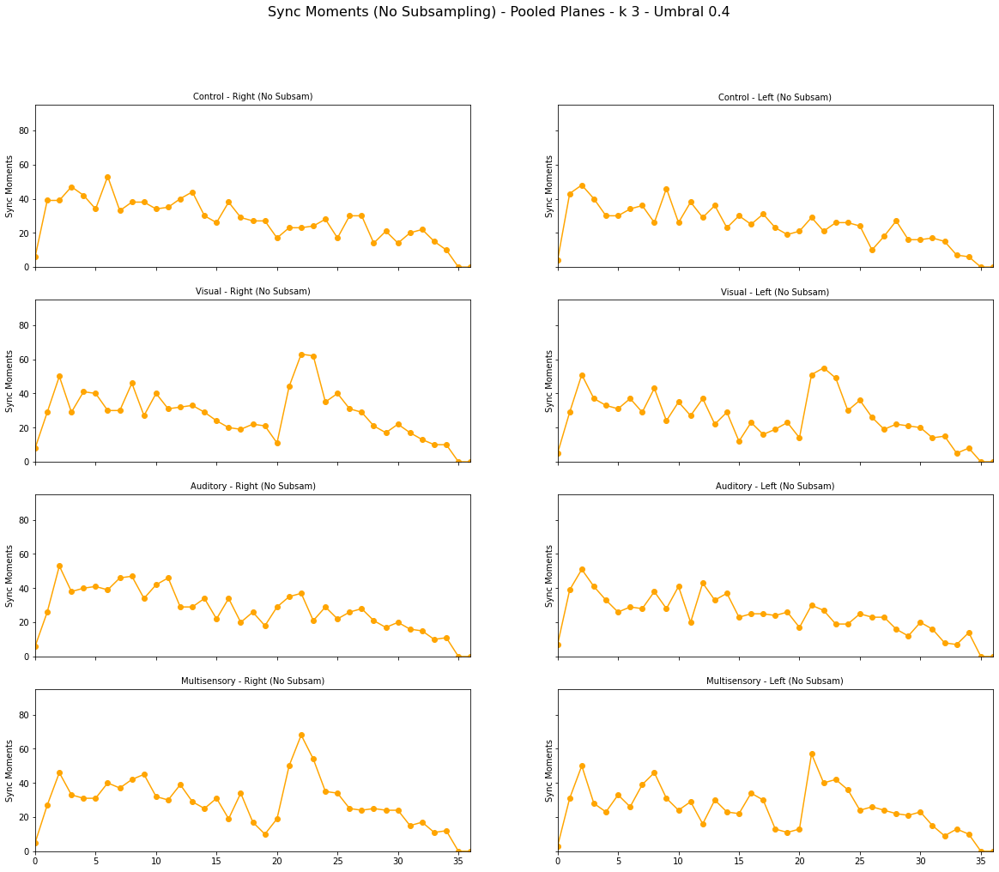

In [411]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # Tres planos

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

sinc_mom_dic = {}
match_order = True  # True para que los datos subsam sigan el orden del sin subsam

# Parámetros y configuración
umbral = 0.4
umbral_subsam = 0.35
kernel_no_subsam = np.array([1, 2, 1]) / 4  # Kernel original

# Crear una única figura para datos sin subsampling (pooling de los 3 planos)
fig_no_subsam, axes_no_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                             figsize=(20, 16), sharex=True, sharey=True)
fig_no_subsam.suptitle(f"Sync Moments (No Subsampling) - Pooled Planes - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)

# Loop anidado sobre condiciones: auditiva, visual y lateralidad
for i, aud_con in enumerate(aud_con_values):
    for j, vis_con in enumerate(vis_con_values):
        for k, leftie in enumerate(leftie_values):
            momentos_sincronia = []
            # Iterar sobre todas las áreas (pooling de los 3 planos)
            for key in areas_1hz:
                # Procesamos solo las áreas correspondientes a los 3 planos
                if '52' not in key and key[-1] in planos_values:
                    for trial in areas_1hz[key].trials:
                        if trial.vis == vis_con and trial.aud == aud_con:
                            # Datos sin subsampling
                            data_array = trial.roi_dffs["Hb"][areas_1hz[key].roi_lefties['Hb'] == leftie]
                            first_event_indices = np.argmax(data_array, axis=1)
                            sorted_indices = np.argsort(first_event_indices)
                            sorted_data_array = data_array[sorted_indices]

                            # Normalización Z-score
                            data_z = sorted_data_array - np.expand_dims(np.mean(sorted_data_array, axis=1), axis=1)
                            data_z = data_z / np.expand_dims(np.std(sorted_data_array, axis=1), axis=1)

                            # Filtrado con kernel
                            promedio_data_z = data_z.mean(axis=0)
                            promedio_data_z_filtrada = np.convolve(promedio_data_z, kernel_no_subsam, mode='same')

                            # Detección de momentos de sincronización
                            mascara_th = promedio_data_z > umbral
                            start_indices = np.where((mascara_th[:-1] == False) & (mascara_th[1:] == True))[0] + 1
                            if mascara_th[0]:
                                start_indices = np.insert(start_indices, 0, 0)

                            momentos_sincronia.extend(start_indices)
            
            # Guardar los datos pooled en el diccionario (clave indica pooling)
            sinc_mom_dic[f'A{aud_con}-V{vis_con}-L{leftie}-Pooled'] = momentos_sincronia

            # Seleccionar el subplot correspondiente
            ax_no_subsam = axes_no_subsam[i * len(vis_con_values) + j, k]
            
            # Si existen momentos de sincronización, se genera el gráfico de líneas con puntos
            if momentos_sincronia:
                # Definir el rango temporal (por ejemplo, 0 a 37 frames)
                max_frame = 37
                # Crear un vector de tiempos para cada frame (0, 1, 2, ..., max_frame-1)
                tiempos = np.arange(0, max_frame)
                # Contar la cantidad de eventos en cada frame sin agrupar
                conteos = np.bincount(momentos_sincronia, minlength=max_frame)
                
                # Graficar la línea con puntos: cada punto corresponde a un frame
                ax_no_subsam.plot(tiempos, conteos, marker='o', linestyle='-', color='orange')
                
                ax_no_subsam.set_ylim(0, 95)
                ax_no_subsam.set_xlim(0, max_frame-1)
            else:
                # Si no hay datos, se limpia el subplot
                ax_no_subsam.text(0.5, 0.5, "Sin datos", ha='center', va='center')

            ax_no_subsam.set_ylabel("Sync Moments", fontsize=10)
            
            # Títulos de cada subplot según condición
            condition_label = trial_labels[(aud_con, vis_con)]
            side_label = "Right" if leftie else "Left"
            ax_no_subsam.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)

plt.show()


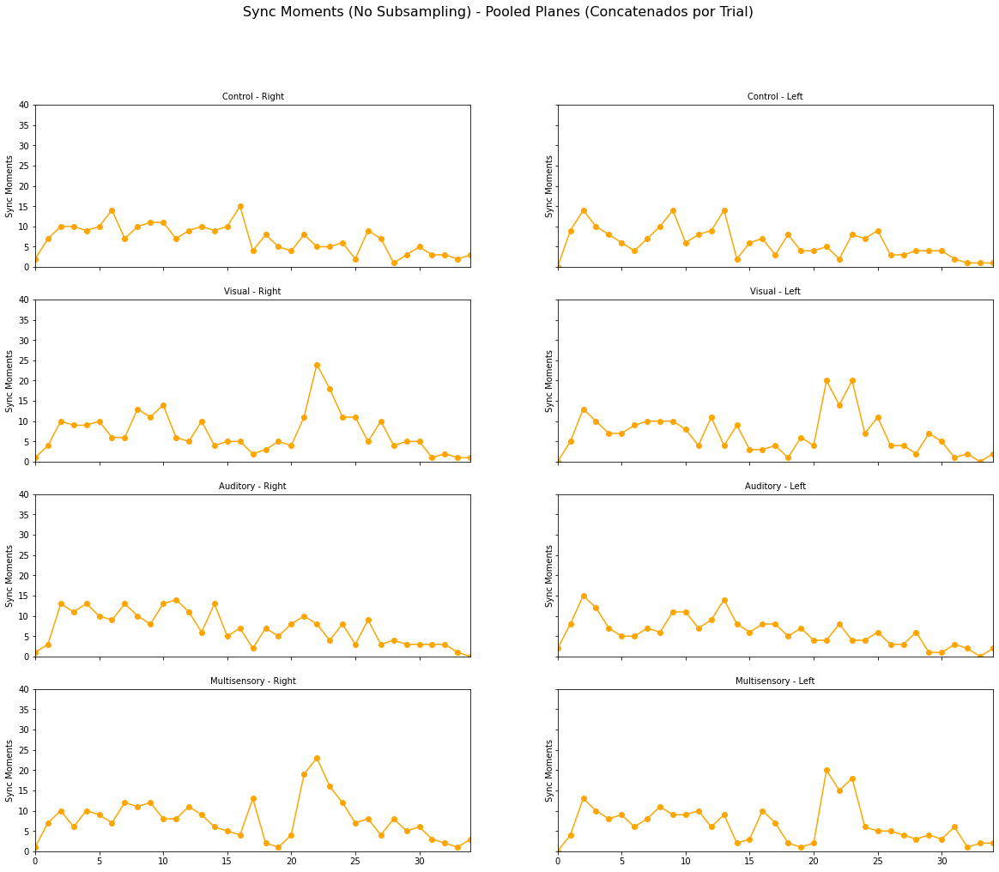

In [422]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['0', '1', '2']  # Los planos se indican en la clave, ej. "30-0", "30-1", "30-2"

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

# Parámetros de análisis
umbral = 0.4
kernel_no_subsam = np.array([1, 2, 1]) / 4  # Kernel (si se requiere filtrado)
sinc_mom_dic = {}  # Aquí se guardarán los sync moments poolados

# Obtener la lista de individuos a partir de las claves de areas_1hz (ejemplo: "30-0" => individuo "30")
individuals = sorted(set(key.split('-')[0] for key in areas_1hz if '52' not in key))

# Crear una única figura para los gráficos de línea (no subsampling)
n_rows = len(aud_con_values) * len(vis_con_values)
n_cols = len(leftie_values)
fig_no_subsam, axes_no_subsam = plt.subplots(n_rows, n_cols, figsize=(20, 16), sharex=True, sharey=True)
fig_no_subsam.suptitle("Sync Moments (No Subsampling) - Pooled Planes (Concatenados por Trial)", fontsize=16)

# Loop sobre condiciones: auditiva, visual y lateralidad
for i, aud_con in enumerate(aud_con_values):
    for j, vis_con in enumerate(vis_con_values):
        for k, leftie in enumerate(leftie_values):
            # Esta lista acumulará los índices (frames) donde se detectó un evento de sincronización,
            # a partir de todos los individuos y trials que cumplan la condición.
            momentos_sincronia = []
            n_frames = None  # Para determinar la longitud de la serie temporal (se espera que sea igual para todos los trials)

            # Iterar sobre cada individuo
            for indiv in individuals:
                # Para cada individuo, construir las claves correspondientes a los 3 planos.
                keys_for_indiv = [f"{indiv}-{p}" for p in planos_values if f"{indiv}-{p}" in areas_1hz]
                if not keys_for_indiv:
                    continue  # Si no hay datos para este individuo, se salta

                # Suponemos que todos los keys de un mismo individuo tienen el mismo número de trials.
                n_trials = len(areas_1hz[keys_for_indiv[0]].trials)
                # Iterar sobre cada trial (por índice) de este individuo
                for trial_idx in range(n_trials):
                    # Usamos el trial del primer plano para chequear la condición de audio y visual.
                    trial0 = areas_1hz[keys_for_indiv[0]].trials[trial_idx]
                    if trial0.aud != aud_con or trial0.vis != vis_con:
                        continue  # Si no cumple la condición, se salta este trial

                    # Ahora, para este trial, se extrae la data de los 3 planos
                    data_arrays = []
                    for key in keys_for_indiv:
                        # Extraer el data_array de Hb filtrando según la lateralidad
                        trial_current = areas_1hz[key].trials[trial_idx]
                        da = trial_current.roi_dffs["Hb"][areas_1hz[key].roi_lefties["Hb"] == leftie]
                        data_arrays.append(da)
                    if not data_arrays:
                        continue

                    # Poolear la data: se apilan verticalmente los data_arrays.
                    # Esto aumenta el número de "canales" (o filas) pero conserva la misma cantidad de frames.
                    pooled_data = np.vstack(data_arrays)
                    if n_frames is None:
                        n_frames = pooled_data.shape[1]

                    # Procesamiento similar al código original:
                    # 1. Se obtiene el índice del primer evento para cada fila.
                    first_event_indices = np.argmax(pooled_data, axis=1)
                    # 2. Se ordenan las filas según ese índice.
                    sorted_indices = np.argsort(first_event_indices)
                    sorted_data_array = pooled_data[sorted_indices]
                    # 3. Se aplica la normalización Z-score a cada fila.
                    mean_vals = np.mean(sorted_data_array, axis=1, keepdims=True)
                    std_vals = np.std(sorted_data_array, axis=1, keepdims=True)
                    data_z = (sorted_data_array - mean_vals) / (std_vals + 1e-8)
                    # 4. Se promedia a lo largo de las filas para obtener una serie temporal.
                    promedio_data_z = data_z.mean(axis=0)
                    # (Opcionalmente se podría filtrar con el kernel, pero aquí usamos directamente el promedio)
                    
                    # 5. Detección de cruce de umbral: se busca el primer frame donde la señal cruza de debajo a sobre el umbral.
                    mascara_th = promedio_data_z > .35
                    # Se detectan los cambios de False a True (rising edge)
                    start_indices = np.where((~mascara_th[:-1]) & (mascara_th[1:]))[0] + 1
                    if mascara_th[0]:
                        start_indices = np.insert(start_indices, 0, 0)
                    
                    # Acumular los índices detectados para este trial.
                    momentos_sincronia.extend(start_indices.tolist())

            # Guardar en el diccionario usando una clave que indique que se poolearon los 3 planos.
            sinc_mom_dic[f'A{aud_con}-V{vis_con}-L{leftie}-Pooled'] = momentos_sincronia

            # Si no se obtuvo información, se define n_frames por defecto.
            if n_frames is None:
                n_frames = 37  # o el valor que corresponda
            # Construir el eje temporal: cada frame es un punto (sin agrupar frames contiguos)
            tiempos = np.arange(n_frames)
            # Contar, frame a frame, cuántos eventos se detectaron (acumulados de todos los trials)
            counts = np.bincount(momentos_sincronia, minlength=n_frames)

            # Seleccionar el subplot correspondiente
            ax_no_subsam = axes_no_subsam[i * len(vis_con_values) + j, k] if n_cols > 1 else axes_no_subsam[i * len(vis_con_values) + j]

            # Graficar la línea con puntos
            ax_no_subsam.plot(tiempos, counts, marker='o', linestyle='-', color='orange')
            ax_no_subsam.set_ylim(0, 40)
            ax_no_subsam.set_xlim(0, n_frames - 1)
            ax_no_subsam.set_ylabel("Sync Moments", fontsize=10)
            condition_label = trial_labels[(aud_con, vis_con)]
            side_label = "Right" if leftie else "Left"
            ax_no_subsam.set_title(f"{condition_label} - {side_label}", fontsize=10)

plt.show()


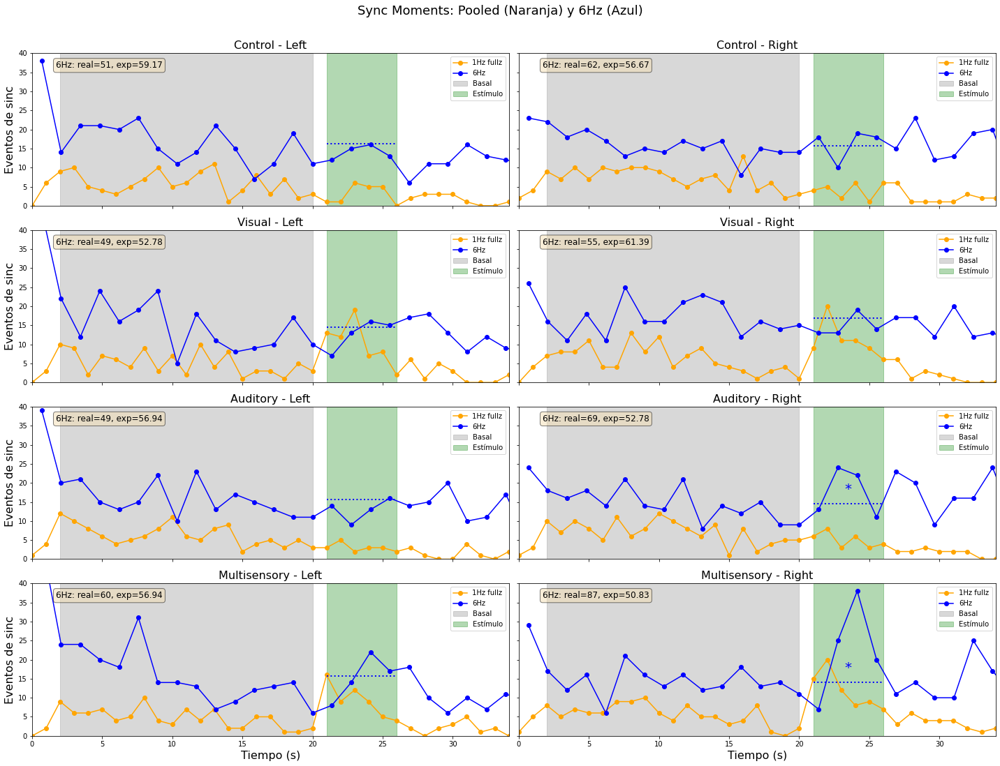

In [424]:
# --- Parámetros y configuraciones iniciales ---
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
# En el pooling se usan los 3 planos; en el análisis 6Hz se usará el plano "1"
planos_pool = ['0', '1', '2']
planos_6Hz = '1'

trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

umbral = 0.4
kernel_no_subsam = np.array([1, 2, 1]) / 4  # Para filtrado (si se requiere)

# Para el gráfico 6Hz se define el mapeo de lateralidad:
# Se asume que en areas_1hz la key guarda directamente el valor de leftie, 
# pero en el análisis 6Hz se quiere distinguir: 
#    left_val = leftie_values[1] (se etiquetará "Left")
#    right_val = leftie_values[0] (se etiquetará "Right")
left_val  = leftie_values[1]   # para Left
right_val = leftie_values[0]   # para Right

# Obtener la lista de individuos a partir de las claves de areas_1hz (ej: "30-0" -> individuo "30")
individuals = sorted(set(key.split('-')[0] for key in areas_1hz if '52' not in key))

# Definir la grilla de subplots:
num_rows = len(aud_con_values) * len(vis_con_values)  # Cada combinación (aud, vis) ocupa una fila
num_cols = 2  # Una columna para cada lateralidad: Left y Right
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 16), sharex=True, sharey=True)
fig.suptitle("Sync Moments: Pooled (Naranja) y 6Hz (Azul)", fontsize=18)

# Contador para el índice de fila en la grilla
row = 0

# Loop sobre las condiciones de audio y visual
for aud_con in aud_con_values:
    for vis_con in vis_con_values:
        # Para cada fila se crearán dos subplots: columna 0 = Left, columna 1 = Right
        for col, (side_val, side_label) in enumerate([(left_val, "Left"), (right_val, "Right")]):
            # Seleccionar el subplot correspondiente
            ax = axes[row, col] if num_rows > 1 else axes[col]
            
            # --- 1. Análisis Pooling (los 3 planos) ---
            # Se acumulan los sync moments (índices de frame) de todos los individuos y trials
            momentos_sincronia = []
            n_frames = None  # Para definir la longitud de la serie temporal
            
            for indiv in individuals:
                # Para cada individuo se toman las claves de los 3 planos (pooling)
                keys_for_indiv = [f"{indiv}-{p}" for p in planos_pool if f"{indiv}-{p}" in areas_1hz]
                if not keys_for_indiv:
                    continue
                # Se asume que todos los keys de un mismo individuo tienen el mismo número de trials
                n_trials = len(areas_1hz[keys_for_indiv[0]].trials)
                for trial_idx in range(n_trials):
                    # Se utiliza el trial del primer plano para verificar la condición
                    trial0 = areas_1hz[keys_for_indiv[0]].trials[trial_idx]
                    if trial0.aud != aud_con or trial0.vis != vis_con:
                        continue
                    # Para este trial, extraer la data de los 3 planos filtrando según la lateralidad
                    data_arrays = []
                    for key in keys_for_indiv:
                        trial_current = areas_1hz[key].trials[trial_idx]
                        # Se extrae la data de Hb para la lateralidad indicada por side_val
                        da = trial_current.roi_dffs["Hb"][areas_1hz[key].roi_lefties["Hb"] == side_val]
                        data_arrays.append(da)
                    if not data_arrays:
                        continue
                    # Concatenar (apilar) las matrices: se conservan los frames
                    pooled_data = np.vstack(data_arrays)
                    if n_frames is None:
                        n_frames = pooled_data.shape[1]
                    # Procesamiento similar al original:
                    first_event_indices = np.argmax(pooled_data, axis=1)
                    sorted_indices = np.argsort(first_event_indices)
                    sorted_data_array = pooled_data[sorted_indices]
                    mean_vals = np.mean(sorted_data_array, axis=1, keepdims=True)
                    std_vals = np.std(sorted_data_array, axis=1, keepdims=True)
                    data_z = (sorted_data_array - mean_vals) / (std_vals + 1e-8)
                    # Promediar para obtener una serie temporal
                    promedio_data_z = data_z.mean(axis=0)
                    # Detección del cruce del umbral (rising edge)
                    mascara_th = promedio_data_z > umbral
                    start_indices = np.where((~mascara_th[:-1]) & (mascara_th[1:]))[0] + 1
                    if mascara_th[0]:
                        start_indices = np.insert(start_indices, 0, 0)
                    # Acumular los índices (frames) donde ocurre el evento
                    momentos_sincronia.extend(start_indices.tolist())
            
            if n_frames is None:
                n_frames = 37  # Valor por defecto si no se obtuvo información
            
            tiempos = np.arange(n_frames)
            counts_pooled = np.bincount(momentos_sincronia, minlength=n_frames)
            # Graficar la serie pooled en naranja
            ax.plot(tiempos, counts_pooled, marker='o', linestyle='-', color='orange', label="1Hz fullz")
            
            # --- 2. Análisis 6Hz (solo del plano "1") ---
            # Se obtiene la data ya procesada (suponemos que previamente se llenó sinc_mom_dic_6Hz)
            key_6Hz = f'A{aud_con}-V{vis_con}-L{side_val}-P{planos_6Hz}'
            # Se asume que sinc_mom_dic_6Hz contiene una lista de eventos (frames) para esa condición
            eventos_6Hz = np.array(sinc_mom_dic_6Hz[key_6Hz])
            
            # Obtener el test de Poisson para 6Hz (usando los parámetros de tiempo)
            p_6Hz, n_esperado_6Hz, n_real_6Hz, lambda_6Hz = test_poisson(
                eventos_6Hz, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
            
            # Para graficar, se define un histograma con bins; en este caso usaremos 30 bins entre 0 y 40
            bins = np.linspace(0, 40, 30)
            dt = bins[1] - bins[0]
            bin_edges = bins
            bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
            counts_6Hz, _ = np.histogram(eventos_6Hz, bins=bins)
            # Graficar la serie 6Hz en azul
            ax.plot(bin_centers, counts_6Hz, marker='o', linestyle='-', color='blue', label="6Hz")
            # Línea punteada con el valor esperado por bin
            expected_6Hz = lambda_6Hz * dt
            x_expected = np.linspace(inicio_estimulo, fin_estimulo, 100)
            y_expected_6Hz = np.full_like(x_expected, expected_6Hz)
            ax.plot(x_expected, y_expected_6Hz, linestyle=':', color='blue', linewidth=2)
            # Si el p-valor es significativo, agregar un asterisco
            if p_6Hz < 0.05:
                x_ast = (inicio_estimulo + fin_estimulo) / 2
                y_ast = expected_6Hz + 2  # offset vertical
                ax.text(x_ast, y_ast, '*', color='blue', fontsize=20, ha='center', va='bottom')
            
            # --- Sombreado de zonas: basal y estímulo ---
            ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
            ax.axvspan(inicio_estimulo, fin_estimulo, color='green', alpha=0.3, label="Estímulo")
            
            # Configuración de ejes y leyenda
            ax.set_ylim(0, 40)
            ax.set_xlim(0, n_frames - 1)
            ax.legend(fontsize=10)
            # Texto con resultados del test para 6Hz (en azul)
            texto = f"6Hz: real={n_real_6Hz}, exp={n_esperado_6Hz:.2f}"
            props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
            ax.text(0.05, 0.95, texto, transform=ax.transAxes, fontsize=12,
                    verticalalignment='top', horizontalalignment='left', bbox=props)
            
            # Título del subplot: condición y lateralidad
            ax.set_title(f"{trial_labels[(aud_con, vis_con)]} - {side_label}", fontsize=16)
            if col == 0:
                ax.set_ylabel("Eventos de sinc", fontsize=16)
            # Se colocará etiqueta en eje x en la última fila (más adelante)
        row += 1

# Etiquetar eje x en la última fila
for col in range(num_cols):
    axes[-1, col].set_xlabel("Tiempo (s)", fontsize=16)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


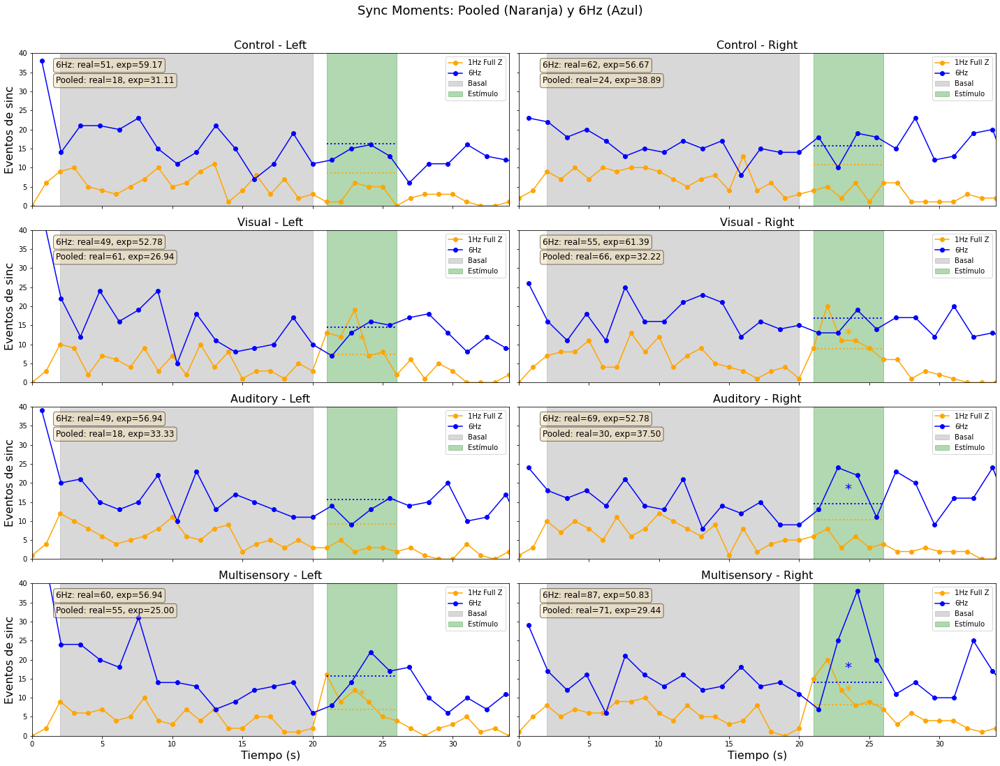

In [428]:
def eventos_en_intervalo(eventos, inicio, fin):
    eventos = np.array(eventos)  # Convertir a array de NumPy
    return np.sum((eventos >= inicio) & (eventos <= fin))

# --- Parámetros y configuraciones iniciales ---
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
# En el pooling se usan los 3 planos; en el análisis 6Hz se usará el plano "1"
planos_pool = ['0', '1', '2']
planos_6Hz = '1'

trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

umbral = 0.4
kernel_no_subsam = np.array([1, 2, 1]) / 4  # Para filtrado (si se requiere)

# Para el gráfico 6Hz se define el mapeo de lateralidad:
# Se asume que en areas_1hz la key guarda directamente el valor de leftie, 
# pero en el análisis 6Hz se quiere distinguir: 
#    left_val = leftie_values[1] (se etiquetará "Left")
#    right_val = leftie_values[0] (se etiquetará "Right")
left_val  = leftie_values[1]   # para Left
right_val = leftie_values[0]   # para Right

# Obtener la lista de individuos a partir de las claves de areas_1hz (ej: "30-0" -> individuo "30")
individuals = sorted(set(key.split('-')[0] for key in areas_1hz if '52' not in key))

# Definir la grilla de subplots:
num_rows = len(aud_con_values) * len(vis_con_values)  # Cada combinación (aud, vis) ocupa una fila
num_cols = 2  # Una columna para cada lateralidad: Left y Right
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 16), sharex=True, sharey=True)
fig.suptitle("Sync Moments: Pooled (Naranja) y 6Hz (Azul)", fontsize=18)

# Propiedades para el recuadro de texto
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

# Contador para el índice de fila en la grilla
row = 0

# Loop sobre las condiciones de audio y visual
for aud_con in aud_con_values:
    for vis_con in vis_con_values:
        # Para cada fila se crearán dos subplots: columna 0 = Left, columna 1 = Right
        for col, (side_val, side_label) in enumerate([(left_val, "Left"), (right_val, "Right")]):
            # Seleccionar el subplot correspondiente
            ax = axes[row, col] if num_rows > 1 else axes[col]
            
            # --- 1. Análisis Pooling (los 3 planos) ---
            # Se acumulan los sync moments (índices de frame) de todos los individuos y trials
            momentos_sincronia = []
            n_frames = None  # Para definir la longitud de la serie temporal
            
            for indiv in individuals:
                # Para cada individuo se toman las claves de los 3 planos (pooling)
                keys_for_indiv = [f"{indiv}-{p}" for p in planos_pool if f"{indiv}-{p}" in areas_1hz]
                if not keys_for_indiv:
                    continue
                # Se asume que todos los keys de un mismo individuo tienen el mismo número de trials
                n_trials = len(areas_1hz[keys_for_indiv[0]].trials)
                for trial_idx in range(n_trials):
                    # Se utiliza el trial del primer plano para verificar la condición
                    trial0 = areas_1hz[keys_for_indiv[0]].trials[trial_idx]
                    if trial0.aud != aud_con or trial0.vis != vis_con:
                        continue
                    # Para este trial, extraer la data de los 3 planos filtrando según la lateralidad
                    data_arrays = []
                    for key in keys_for_indiv:
                        trial_current = areas_1hz[key].trials[trial_idx]
                        # Extraer la data de Hb para la lateralidad indicada por side_val
                        da = trial_current.roi_dffs["Hb"][areas_1hz[key].roi_lefties["Hb"] == side_val]
                        data_arrays.append(da)
                    if not data_arrays:
                        continue
                    # Concatenar (apilar) las matrices: se conservan los frames
                    pooled_data = np.vstack(data_arrays)
                    if n_frames is None:
                        n_frames = pooled_data.shape[1]
                    # Procesamiento similar al original:
                    first_event_indices = np.argmax(pooled_data, axis=1)
                    sorted_indices = np.argsort(first_event_indices)
                    sorted_data_array = pooled_data[sorted_indices]
                    mean_vals = np.mean(sorted_data_array, axis=1, keepdims=True)
                    std_vals = np.std(sorted_data_array, axis=1, keepdims=True)
                    data_z = (sorted_data_array - mean_vals) / (std_vals + 1e-8)
                    # Promediar para obtener una serie temporal
                    promedio_data_z = data_z.mean(axis=0)
                    # Detección del cruce del umbral (rising edge)
                    mascara_th = promedio_data_z > umbral
                    start_indices = np.where((~mascara_th[:-1]) & (mascara_th[1:]))[0] + 1
                    if mascara_th[0]:
                        start_indices = np.insert(start_indices, 0, 0)
                    # Acumular los índices (frames) donde ocurre el evento
                    momentos_sincronia.extend(start_indices.tolist())
            
            if n_frames is None:
                n_frames = 37  # Valor por defecto si no se obtuvo información
            
            tiempos = np.arange(n_frames)
            counts_pooled = np.bincount(momentos_sincronia, minlength=n_frames)
            # Graficar la serie pooled en naranja
            ax.plot(tiempos, counts_pooled, marker='o', linestyle='-', color='orange', label="1Hz Full Z")
            
            # --- Tratamiento estadístico para los datos Pooling ---
            p_pooled, n_esperado_pooled, n_real_pooled, lambda_pooled = test_poisson(
                momentos_sincronia, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
            bins_pool = np.linspace(0, 40, 30)
            dt_pool = bins_pool[1] - bins_pool[0]
            bin_edges_pool = bins_pool
            bin_centers_pool = (bin_edges_pool[:-1] + bin_edges_pool[1:]) / 2
            expected_pooled = lambda_pooled * dt_pool
            x_expected_pool = np.linspace(inicio_estimulo, fin_estimulo, 100)
            y_expected_pool = np.full_like(x_expected_pool, expected_pooled)
            ax.plot(x_expected_pool, y_expected_pool, linestyle=':', color='orange', linewidth=2)
            if p_pooled < 0.05:
                x_ast_pool = (inicio_estimulo + fin_estimulo) / 2
                y_ast_pool = expected_pooled + 2  # offset vertical
                ax.text(x_ast_pool, y_ast_pool, '*', color='orange', fontsize=20, ha='center', va='bottom')
            texto_pooled = f"Pooled: real={n_real_pooled}, exp={n_esperado_pooled:.2f}"
            ax.text(0.05, 0.85, texto_pooled, transform=ax.transAxes, fontsize=12,
                    verticalalignment='top', horizontalalignment='left', bbox=props)
            
            # --- 2. Análisis 6Hz (solo del plano "1") ---
            key_6Hz = f'A{aud_con}-V{vis_con}-L{side_val}-P{planos_6Hz}'
            # Se asume que sinc_mom_dic_6Hz contiene la lista de eventos (frames) para esa condición
            eventos_6Hz = np.array(sinc_mom_dic_6Hz[key_6Hz])
            
            p_6Hz, n_esperado_6Hz, n_real_6Hz, lambda_6Hz = test_poisson(
                eventos_6Hz, inicio_basal, fin_basal, inicio_estimulo, fin_estimulo)
            
            bins_6Hz = np.linspace(0, 40, 30)
            dt_6Hz = bins_6Hz[1] - bins_6Hz[0]
            bin_edges_6Hz = bins_6Hz
            bin_centers_6Hz = (bin_edges_6Hz[:-1] + bin_edges_6Hz[1:]) / 2
            counts_6Hz, _ = np.histogram(eventos_6Hz, bins=bins_6Hz)
            # Graficar la serie 6Hz en azul
            ax.plot(bin_centers_6Hz, counts_6Hz, marker='o', linestyle='-', color='blue', label="6Hz")
            expected_6Hz = lambda_6Hz * dt_6Hz
            x_expected_6Hz = np.linspace(inicio_estimulo, fin_estimulo, 100)
            y_expected_6Hz = np.full_like(x_expected_6Hz, expected_6Hz)
            ax.plot(x_expected_6Hz, y_expected_6Hz, linestyle=':', color='blue', linewidth=2)
            if p_6Hz < 0.05:
                x_ast_6Hz = (inicio_estimulo + fin_estimulo) / 2
                y_ast_6Hz = expected_6Hz + 2
                ax.text(x_ast_6Hz, y_ast_6Hz, '*', color='blue', fontsize=20, ha='center', va='bottom')
            texto_6Hz = f"6Hz: real={n_real_6Hz}, exp={n_esperado_6Hz:.2f}"
            ax.text(0.05, 0.95, texto_6Hz, transform=ax.transAxes, fontsize=12,
                    verticalalignment='top', horizontalalignment='left', bbox=props)
            
            # --- Sombreado de zonas: basal y estímulo ---
            ax.axvspan(inicio_basal, fin_basal, color='gray', alpha=0.3, label="Basal")
            ax.axvspan(inicio_estimulo, fin_estimulo, color='green', alpha=0.3, label="Estímulo")
            
            # Configuración de ejes y leyenda
            ax.set_ylim(0, 40)
            ax.set_xlim(0, n_frames - 1)
            ax.legend(fontsize=10)
            
            # Título del subplot: condición y lateralidad
            ax.set_title(f"{trial_labels[(aud_con, vis_con)]} - {side_label}", fontsize=16)
            if col == 0:
                ax.set_ylabel("Eventos de sinc", fontsize=16)
        row += 1

# Etiquetar eje x en la última fila
for col in range(num_cols):
    axes[-1, col].set_xlabel("Tiempo (s)", fontsize=16)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


In [435]:
areas_1hz[key].__dict__.keys()

dict_keys(['pez', 'n', 'trials', 'template', 'polygons_per_area', 'subtemplates', 'fecha', 'x', 'y', 'z', 'regions', 'template_small', 'factor', 'polygons_per_area_small', 'midline_points', 'grids', 'contours', 'centers', 'contours_small', 'centers_small', 'grid_lefties', 'roi_lefties', 'stack', 'm_rig'])

Z plano por edades


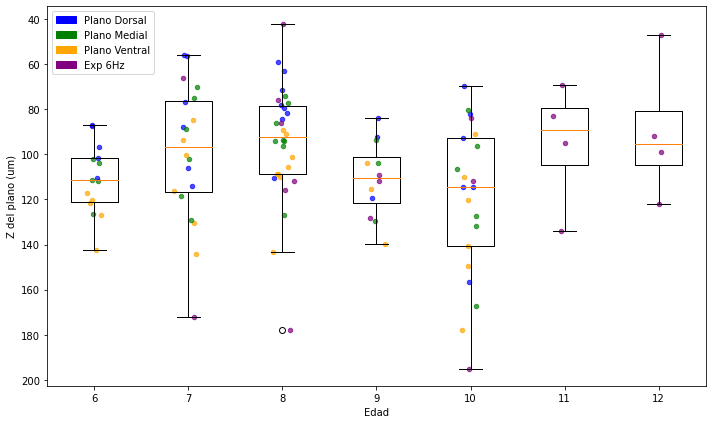

In [454]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# Supongamos que ya tienes definidos los diccionarios 'areas_1hz' y 'areas'
# donde en cada objeto se puede acceder a:
#   - areas[...] .trials[0].roi_activities['Hb']   --> para obtener el número de ROIs
#   - areas[...] .trials[0].data['Edad']              --> para obtener la edad (float, con valores de 6 a 12)

# Creamos un diccionario para agrupar por edad.
# Cada entrada tendrá como clave la edad y como valor una lista de tuplas (valor, trial_type).
data_by_age = {}

# Procesamos los datos de areas_1hz (se colorean según key[-1])
for key in areas_1hz:
    if '52' not in key:
        # Convertimos la edad a float (aunque sean enteros en valor)
        edad = float(areas_1hz[key].trials[0].data['Edad'])
        trial_type = key[-1]  # Se espera que sea '0', '1' o '2'
        # valor = len(areas_1hz[key].trials[0].roi_activities['Hb'])
        valor = areas_1hz[key].z
        data_by_age.setdefault(edad, []).append((valor, trial_type))

# Procesamos los datos de areas (a los que asignaremos un color fijo, por ejemplo 'special')
for key in areas:
    if '25' not in key:
        edad = float(areas[key].trials[0].data['Edad'])
        trial_type = 'special'
        valor = len(areas[key].trials[0].roi_activities['Hb'])
        data_by_age.setdefault(edad, []).append((valor, trial_type))

# Obtenemos las edades únicas ordenadas (serán las posiciones del eje x)
edades_unicas = sorted(data_by_age.keys())

# Preparamos los datos para el boxplot: para cada edad, extraemos la lista de valores (número de ROIs)
boxplot_data = []
for edad in edades_unicas:
    valores = [item[0] for item in data_by_age[edad]]
    boxplot_data.append(valores)

# Creamos la figura
plt.figure(figsize=(10, 6))

# Dibujamos los boxplots en las posiciones correspondientes (usamos las edades como posiciones)
plt.boxplot(boxplot_data, positions=edades_unicas, widths=0.5)

# Definimos el mapeo de colores:
# Para areas_1hz se colorea según trial_type ('0','1','2') y para areas se asigna un color fijo ('special')
color_mapping = {
    '0': 'blue',
    '1': 'green',
    '2': 'orange',
    'special': 'purple'
}

# Dibujamos los puntos con scatter (con un pequeño jitter en x para evitar solapamientos)
for edad in edades_unicas:
    for valor, trial_type in data_by_age[edad]:
        jitter = np.random.normal(loc=0, scale=0.05)
        x_val = edad + jitter
        plt.scatter(x_val, valor, color=color_mapping[trial_type], alpha=0.7, s=20)

plt.xlabel("Edad")
plt.ylabel("Z del plano (um)")
# plt.title("Boxplot por Edad con puntos coloreados según trial type")

# Opcional: mostrar las edades como enteros en el eje x
plt.xticks(edades_unicas, [str(int(e)) for e in edades_unicas])


# positions, ['Plano Dorsal', 'Plano Medial', 'Plano Ventral', 'Exp 6Hz'])

# Creamos una leyenda personalizada
legend_handles = [
    mpatches.Patch(color=color_mapping['0'], label='Plano Dorsal'),
    mpatches.Patch(color=color_mapping['1'], label='Plano Medial'),
    mpatches.Patch(color=color_mapping['2'], label='Plano Ventral'),
    mpatches.Patch(color=color_mapping['special'], label='Exp 6Hz')
]
plt.legend(handles=legend_handles)

plt.tight_layout()
# plt.savefig('rois-alreves-png')
plt.gca().invert_yaxis()

plt.show()

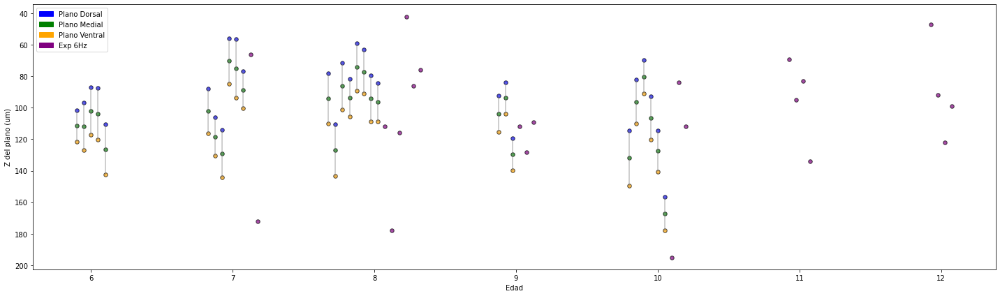

In [527]:
# Diccionario para agrupar datos por edad y animal
data_by_age = {}

# Procesamos los datos de areas_1hz
for key in areas_1hz:
    if '52' not in key:
        edad = float(areas_1hz[key].trials[0].data['Edad'])
        trial_type = key[-1]  # '0', '1' o '2'
        valor = areas_1hz[key].z
        animal_id = key[:-1]  # Identificador del animal

        data_by_age.setdefault(edad, {}).setdefault(animal_id, []).append((valor, trial_type))

# Procesamos los datos de areas (se asigna color 'special')
for key in areas:
    if '25' not in key:
        edad = float(areas[key].trials[0].data['Edad'])
        trial_type = 'special'
        valor = len(areas[key].trials[0].roi_activities['Hb'])
        animal_id = key  # Identificador del animal

        data_by_age.setdefault(edad, {}).setdefault(animal_id, []).append((valor, trial_type))

# Obtener edades únicas ordenadas
edades_unicas = sorted(data_by_age.keys())

# Preparar los datos para el boxplot
boxplot_data = []
for edad in edades_unicas:
    valores = [valor for animal_data in data_by_age[edad].values() for valor, _ in animal_data]
    boxplot_data.append(valores)

# Crear la figura
plt.figure(figsize=(20, 6))

# (Opcional) Dibujar boxplots, si se desea, descomentando la siguiente línea:
# plt.boxplot(boxplot_data, positions=edades_unicas, widths=0.5)

# Definir mapeo de colores
color_mapping = {
    '0': 'blue',      # Plano Dorsal
    '1': 'green',     # Plano Medial
    '2': 'orange',    # Plano Ventral
    'special': 'purple'  # Exp 6Hz
}

# Dibujar los puntos y conectar los 3 planos con una línea gris
for edad in edades_unicas:
    animales = list(data_by_age[edad].keys())  # Lista de identificadores de animales en esta edad
    n_animales = len(animales)

    for i, animal_id in enumerate(animales):
        # Espaciado entre animales dentro de la misma edad
        x_val = edad + (i - (n_animales - 1) / 2) * 0.05  # Centra y separa los animales

        # Extraer los valores y tipos de trial del animal
        datos = sorted(data_by_age[edad][animal_id], key=lambda x: x[1])  # Ordenar por tipo de trial

        # Extraer coordenadas X e Y para la línea gris
        y_vals = [valor for valor, _ in datos]
        if len(y_vals) == 3:  # Solo conectar si hay los 3 planos
            plt.plot([x_val] * 3, y_vals, color='gray', linestyle='-', alpha=0.5)

        # Dibujar los puntos sin superposición
        for j, (valor, trial_type) in enumerate(datos):
            plt.scatter(x_val, valor, color=color_mapping[trial_type], alpha=0.7, s=30, edgecolors="black")

plt.xlabel("Edad")
plt.ylabel("Z del plano (um)")

# Opcional: mostrar edades como enteros en el eje x
plt.xticks(edades_unicas, [str(int(e)) for e in edades_unicas])

# Crear leyenda personalizada
legend_handles = [
    mpatches.Patch(color=color_mapping['0'], label='Plano Dorsal'),
    mpatches.Patch(color=color_mapping['1'], label='Plano Medial'),
    mpatches.Patch(color=color_mapping['2'], label='Plano Ventral'),
    mpatches.Patch(color=color_mapping['special'], label='Exp 6Hz')
]
plt.legend(handles=legend_handles)

# Invertir el eje Y para que empiece arriba y crezca hacia abajo
plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()


Binaricemosa y hagamos cuentas

In [475]:
print(original_time.shape,
prop_act_bin.shape)

(229,) (229,)


c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide


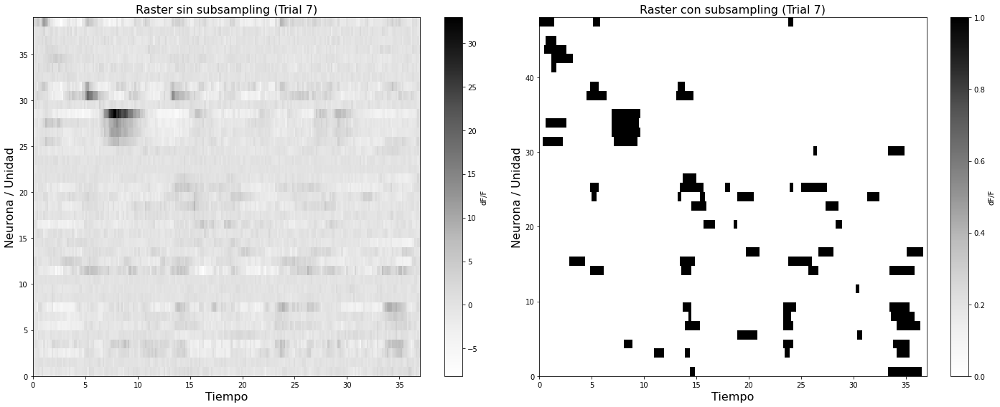

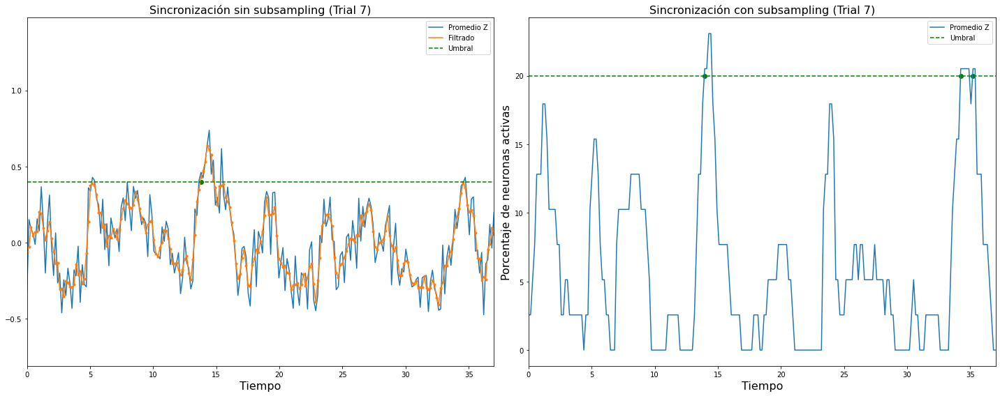

c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide


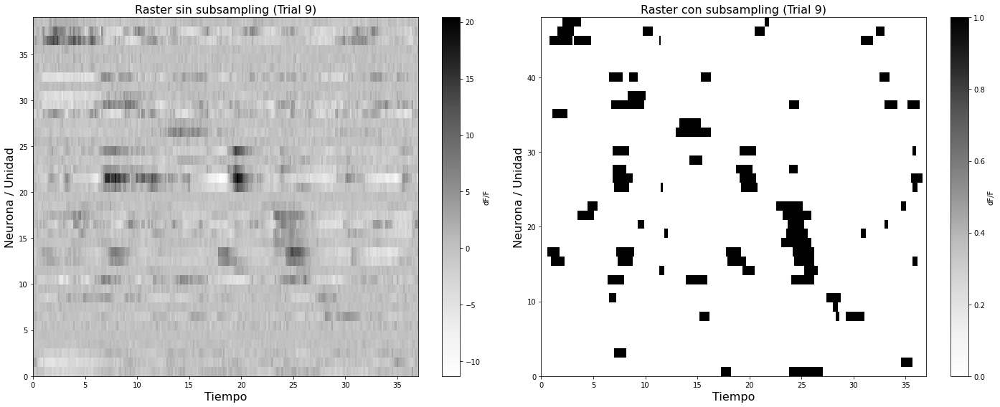

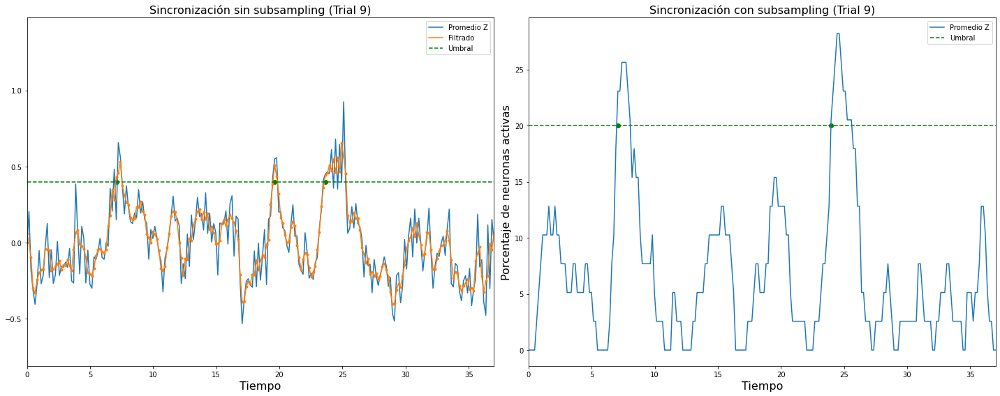

c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide


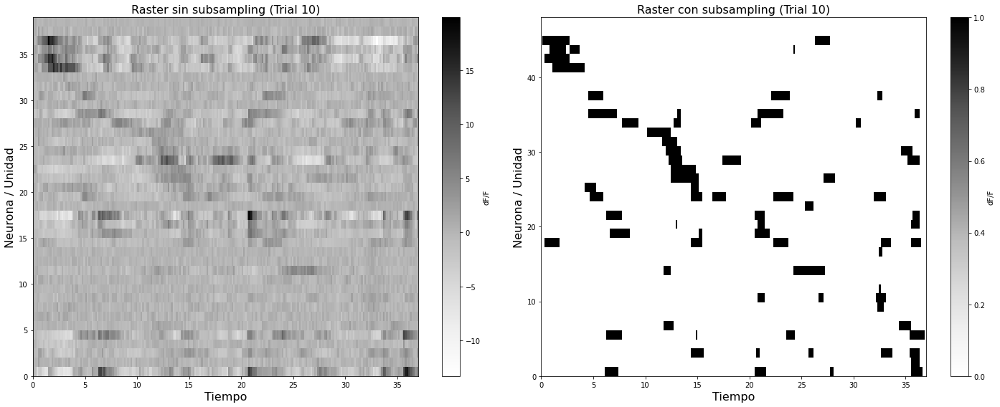

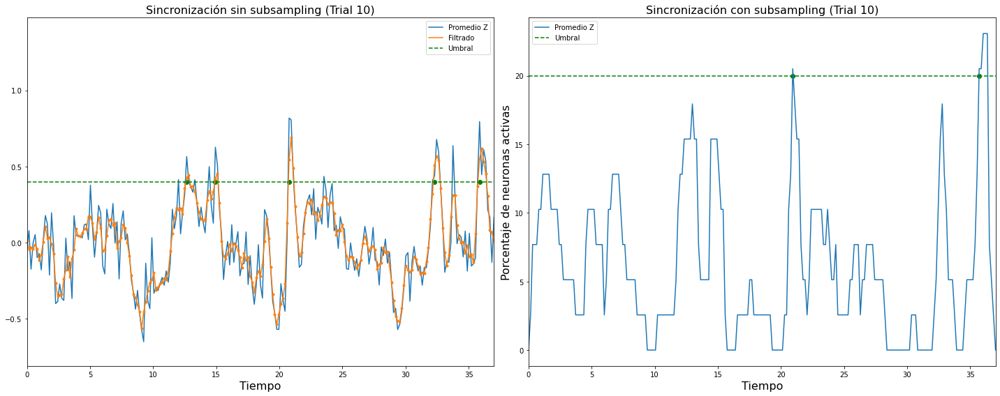

c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide


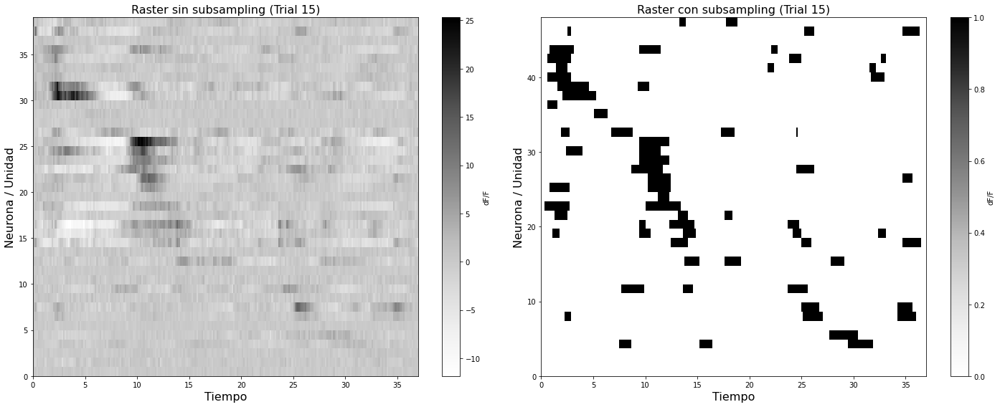

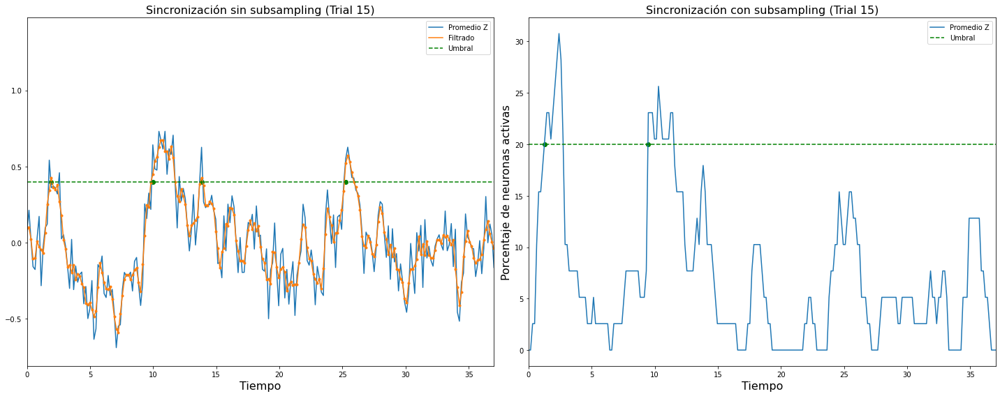

c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in true_divide


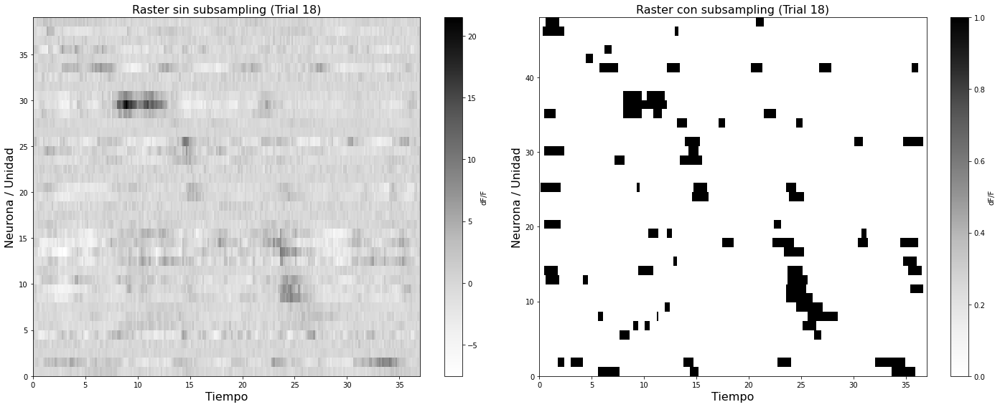

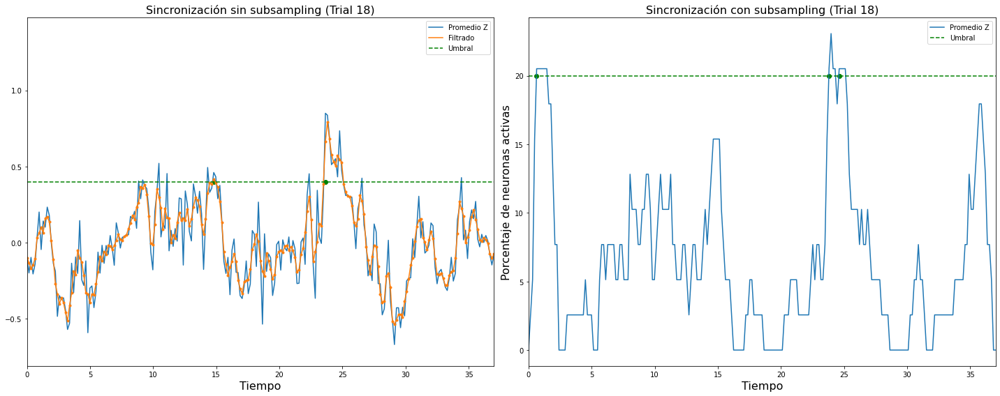

In [ ]:
planos = '1'
vis_con = 1
aud_con = 1
leftie = True
key = '1-1'
match_order = True  # True para que ambos usen el mismo orden de columnas
i = 0
umbral_bin = 20
for trial in areas[key].trials:
    i += 1
    if trial.vis == vis_con and trial.aud == aud_con and key[-1] == planos:
        # Datos sin subsampling
        data_array = trial.roi_dffs["Hb"][areas[key].roi_lefties['Hb'] == leftie]
        first_event_indices = np.argmax(data_array, axis=1)
        sorted_indices = np.argsort(first_event_indices)
        sorted_data_array = data_array[sorted_indices]


        # Data binarisada
        data_array_bin = trial.roi_binaries["Hb"][areas[key].roi_lefties['Hb'] == leftie]
        # Datos con subsampling
        # data_array_subsam = trial.roi_dffs_subsam["Hb"][areas[key].roi_lefties['Hb'] == leftie]
        # first_event_indices_subsam = np.argmax(data_array_subsam, axis=1)
        # sorted_indices_subsam = np.argsort(first_event_indices_subsam)

        # Si `match_order` es True, el orden del subsampling sigue al sin subsampling
        # if match_order:
        #     sorted_data_array_subsam = data_array_subsam[sorted_indices]
        # else:
        #     sorted_data_array_subsam = data_array_subsam[sorted_indices_subsam]


 

        if match_order:
            sorted_data_array_bin = data_array_bin[sorted_indices]
        # else:
        #     sorted_data_array_subsam = data_array_subsam[sorted_indices_subsam]

        # Normalización Z-score
        data_z = sorted_data_array - np.expand_dims(np.mean(sorted_data_array, axis=1), axis=1)
        data_z = data_z / np.expand_dims(np.std(sorted_data_array, axis=1), axis=1)

        # data_z_subsam = sorted_data_array_subsam - np.expand_dims(np.mean(sorted_data_array_subsam, axis=1), axis=1)
        # data_z_subsam = data_z_subsam / np.expand_dims(np.std(sorted_data_array_subsam, axis=1), axis=1)

        data_z_bin = sorted_data_array_bin - np.expand_dims(np.mean(sorted_data_array_bin, axis=1), axis=1)
        data_z_bin = data_z_bin / np.expand_dims(np.std(sorted_data_array_bin, axis=1), axis=1)

        # Mapeo del eje X de 0 a 37
        original_time = np.linspace(0, 37, data_z.shape[1])
        subsam_time = np.linspace(0, 37, data_z_subsam.shape[1])

        # # Ajustar el tamaño del kernel en tiempo
        # frames_ratio = data_z.shape[1] / data_z_subsam.shape[1]
        # kernel_size_no_subsam = 3  # Tamaño original del kernel en frames
        # kernel_size_subsam = max(1, round(kernel_size_no_subsam / frames_ratio))  # Ajustado para subsampling
        kernel_no_subsam = np.ones(kernel_size_no_subsam) / kernel_size_no_subsam
        # kernel_subsam = np.ones(kernel_size_subsam) / kernel_size_subsam

        # # Filtrado con kernel ajustado
        promedio_data_z = data_z.mean(axis=0)
        # promedio_data_z_subsam = data_z_subsam.mean(axis=0)

        promedio_data_z_filtrada = np.convolve(promedio_data_z, kernel_no_subsam, mode='same')
        # promedio_data_z_filtrada_subsam = np.convolve(promedio_data_z_subsam, kernel_subsam, mode='same')
        prop_act_bin = np.sum(sorted_data_array_bin, axis=0)*100/len(sorted_data_array_bin[:,0])
        umbral = .4
        mascara_th = promedio_data_z_filtrada > umbral
        # mascara_th_subsam = promedio_data_z_filtrada_subsam > umbral_subsam
        mascara_th_bin= prop_act_bin > umbral_bin

        start_indices = np.where((mascara_th[:-1] == False) & (mascara_th[1:] == True))[0] + 1
        # start_indices_subsam = np.where((mascara_th_subsam[:-1] == False) & (mascara_th_subsam[1:] == True))[0] + 1
        start_indices_bin = np.where((mascara_th_bin[:-1] == False) & (mascara_th_bin[1:] == True))[0] + 1

        # if mascara_th[0]:
        #     start_indices = np.insert(start_indices, 0, 0)
        # if mascara_th_subsam[0]:
        #     start_indices_subsam = np.insert(start_indices_subsam, 0, 0)

        # Crear gráficos en columnas (con subsampling a la izquierda, sin subsampling a la derecha)
        fig, axes = plt.subplots(1, 2, figsize=(20, 8))

        # Raster plot con subsampling
        ax1 = axes[1]
        im = ax1.imshow(sorted_data_array_bin, aspect='auto', cmap='Greys', interpolation='nearest', extent=[0, 37, 0, sorted_data_array_subsam.shape[0]])
        fig.colorbar(im, ax=ax1, label='dF/F')
        ax1.set_xlabel('Tiempo', fontsize=16)
        ax1.set_ylabel('Neurona / Unidad', fontsize=16)
        ax1.set_title(f'Raster con subsampling (Trial {i})', fontsize=16)
        ax1.set_xlim(0, 37)

        # Raster plot sin subsampling
        ax2 = axes[0]
        im = ax2.imshow(sorted_data_array, aspect='auto', cmap='Greys', interpolation='nearest', extent=[0, 37, 0, sorted_data_array.shape[0]])
        fig.colorbar(im, ax=ax2, label='dF/F')
        ax2.set_xlabel('Tiempo', fontsize=16)
        ax2.set_ylabel('Neurona / Unidad', fontsize=16)
        ax2.set_title(f'Raster sin subsampling (Trial {i})', fontsize=16)
        ax2.set_xlim(0, 37)

        plt.tight_layout()
        plt.show()


              # Gráficos de sincronización
        fig, axes = plt.subplots(1, 2, figsize=(20, 8))

        # Sincronización con subsampling
        ax1 = axes[1]
        ax1.set_title(f'Sincronización con subsampling (Trial {i})', fontsize=16)
        ax1.plot(original_time, prop_act_bin, color='#1f77b4', label='Promedio Z')
        # ax1.plot(subsam_time, promedio_data_z_filtrada_subsam, '.', color='#ff7f0e')
        # ax1.plot(subsam_time, promedio_data_z_filtrada_subsam, color='#ff7f0e', label='Filtrado')
        # ax1.axhline(umbral_subsam, color='green', linestyle='--', label='Umbral')
        ax1.axhline(umbral_bin, color='green', linestyle='--', label='Umbral')
        ax1.scatter(original_time[start_indices_bin], np.ones_like(start_indices_bin) * umbral_bin, color='green')
        ax1.legend()
        ax1.set_ylabel('Porcentaje de neuronas activas', fontsize=16)

        ax1.set_xlim(0, 37)
        # ax1.set_ylim(min(min(promedio_data_z_subsam), min(promedio_data_z)), max(max(promedio_data_z_subsam), max(promedio_data_z)))
        ax1.set_xlabel('Tiempo', fontsize=16)


        # Sincronización sin subsampling
        ax2 = axes[0]
        ax2.set_title(f'Sincronización sin subsampling (Trial {i})', fontsize=16)
        ax2.plot(original_time, promedio_data_z, color='#1f77b4', label='Promedio Z')
        ax2.plot(original_time, promedio_data_z_filtrada, '.', color='#ff7f0e')
        ax2.plot(original_time, promedio_data_z_filtrada, color='#ff7f0e', label='Filtrado')
        ax2.axhline(umbral, color='green', linestyle='--', label='Umbral')
        ax2.scatter(original_time[start_indices], np.ones_like(start_indices) * umbral, color='green')
        ax2.legend()
        ax2.set_xlim(0, 37)
        ax2.set_ylim(min(min(promedio_data_z_subsam), min(promedio_data_z)), max(max(promedio_data_z_subsam), max(promedio_data_z)))
        ax2.set_xlabel('Tiempo', fontsize=16)



        plt.tight_layout()
        plt.show()

c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\ipykernel_launcher.py:103: RuntimeWarning: invalid value encountered in true_divide


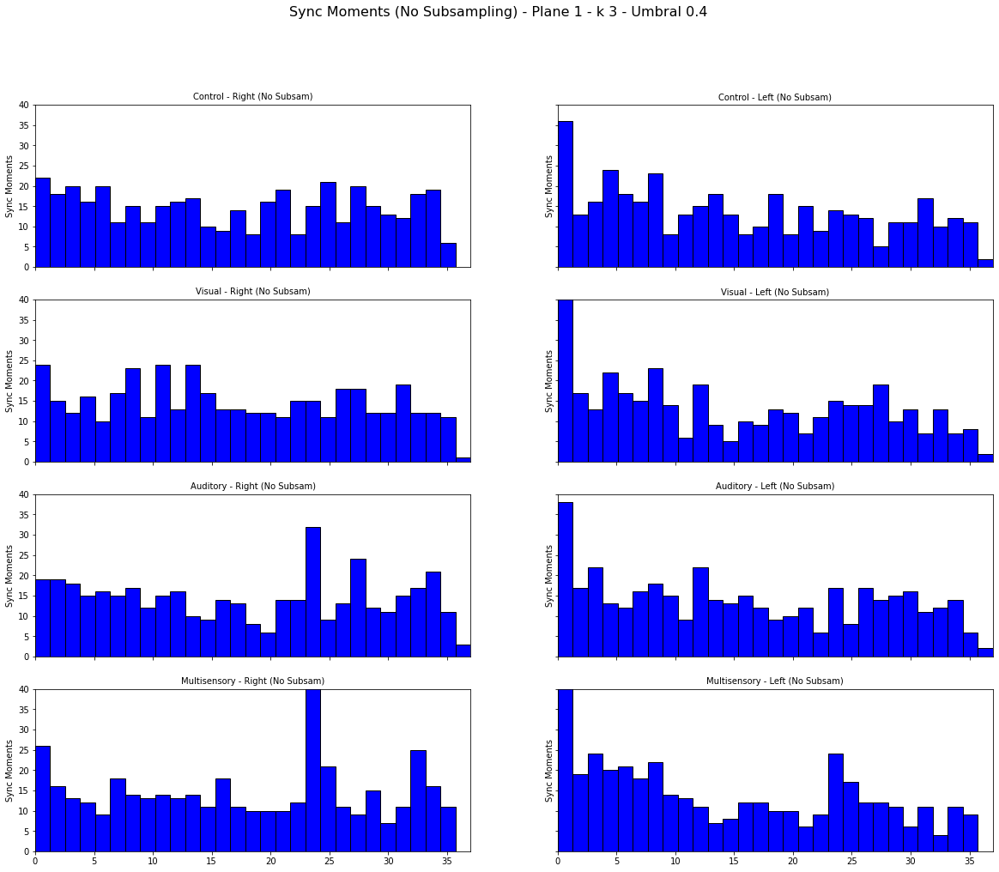

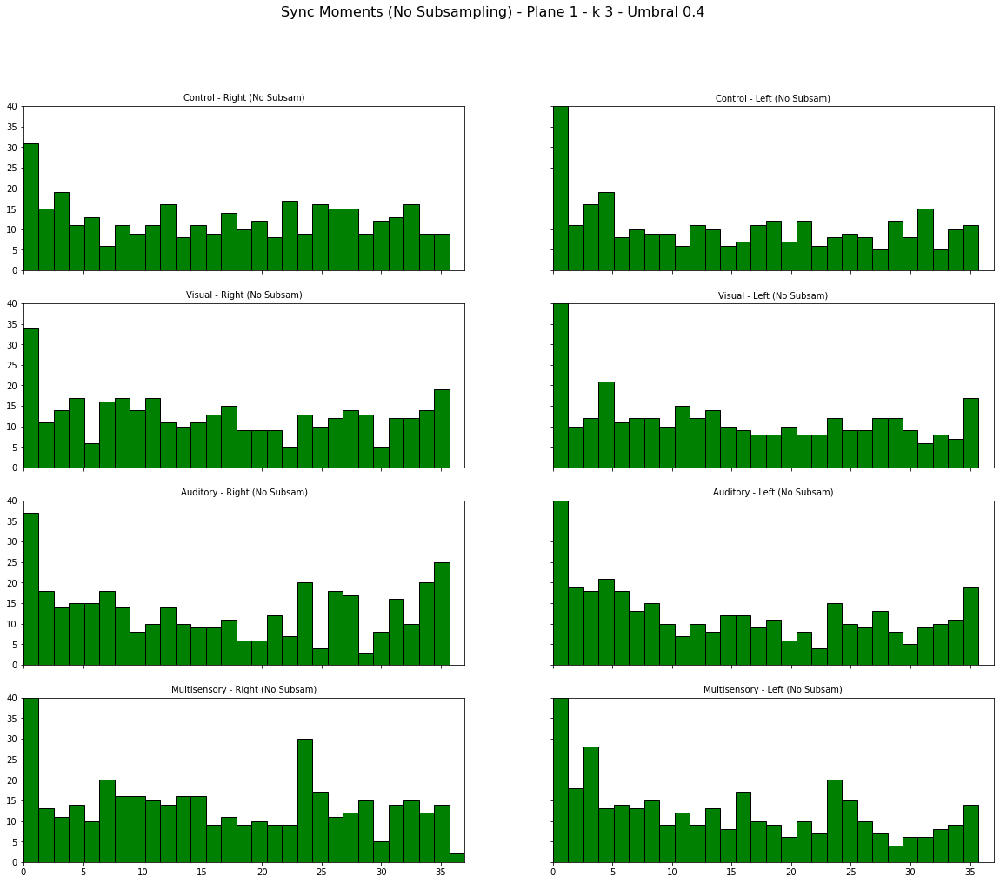

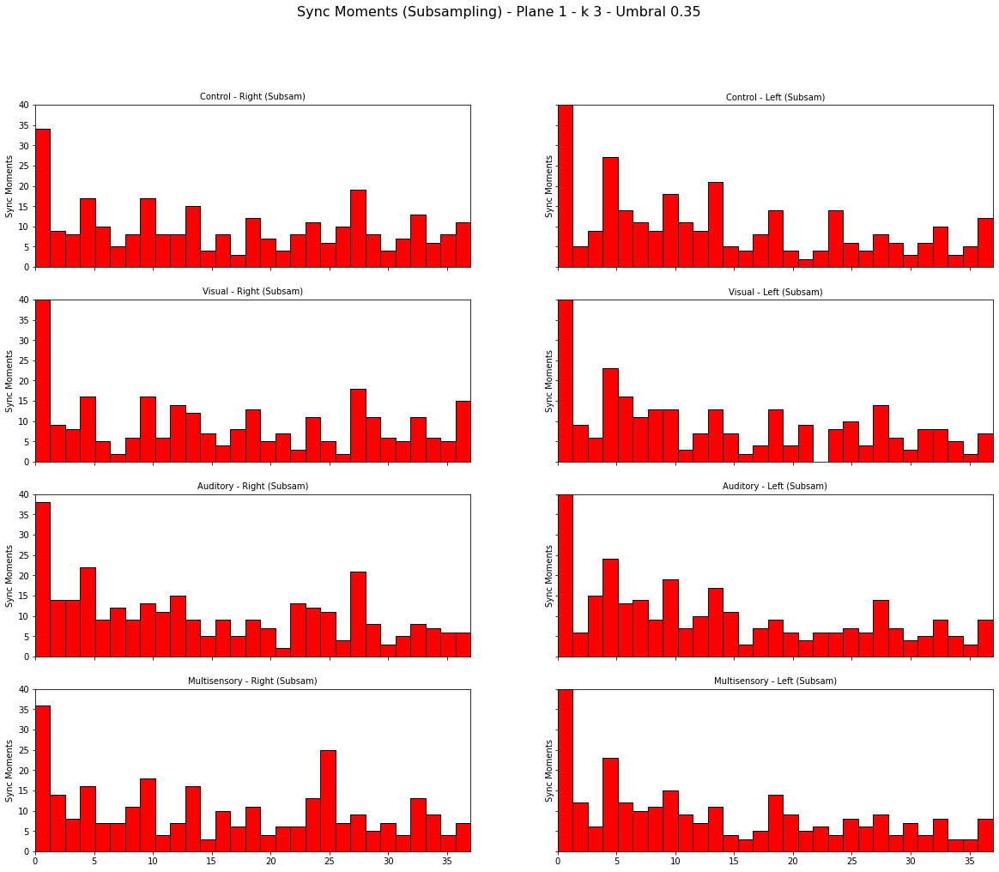

In [526]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['1']  # Solo un plano

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

sinc_mom_dic_6Hz = {}
sinc_mom_dic_6Hz_bin = {}
sinc_mom_dic_6Hz_subsam = {}

match_order = True  # True para que los datos subsam sigan el orden del sin subsam

for planos in planos_values:
    # Crear dos figuras, una para datos sin subsampling y otra para datos con subsampling
    fig_no_subsam, axes_no_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                                 figsize=(20, 16), sharex=True, sharey=True)
    
    fig_no_subsam_bin, axes_no_subsam_bin = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                                 figsize=(20, 16), sharex=True, sharey=True)
    
    fig_subsam, axes_subsam = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                           figsize=(20, 16), sharex=True, sharey=True)
    
    umbral = .4
    umbral_subsam = .35
    umbral_bin = 15

    kernel_no_subsam = np.array([1, 2, 1]) / 4  # Kernel original
    # kernel = np.array([1,2, 4,2, 1]) / 10

    fig_no_subsam.suptitle(f"Sync Moments (No Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)
    fig_no_subsam_bin.suptitle(f"Sync Moments (No Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)
    fig_subsam.suptitle(f"Sync Moments (Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral_subsam}", fontsize=16)

    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):
                momentos_sincronia = []
                momentos_sincronia_bin = []
                momentos_sincronia_subsam = []

                # Iterar sobre las áreas
                for key in areas:
                    if '25' not in key:
                        for trial in areas[key].trials:
                            if trial.vis == vis_con and trial.aud == aud_con and key[-1] == planos:
                                # Datos sin subsampling
                                data_array = trial.roi_dffs["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                first_event_indices = np.argmax(data_array, axis=1)
                                sorted_indices = np.argsort(first_event_indices)
                                sorted_data_array = data_array[sorted_indices]

                                # Datos con subsampling
                                data_array_subsam = trial.roi_dffs_subsam["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                first_event_indices_subsam = np.argmax(data_array_subsam, axis=1)
                                sorted_indices_subsam = np.argsort(first_event_indices_subsam)

                                # Si `match_order` es True, se usa el mismo orden para subsampling
                                if match_order:
                                    sorted_data_array_subsam = data_array_subsam[sorted_indices]
                                else:
                                    sorted_data_array_subsam = data_array_subsam[sorted_indices_subsam]

                                # Normalización Z-score
                                data_z = sorted_data_array - np.expand_dims(np.mean(sorted_data_array, axis=1), axis=1)
                                data_z = data_z / np.expand_dims(np.std(sorted_data_array, axis=1), axis=1)

                                data_z_subsam = sorted_data_array_subsam - np.expand_dims(np.mean(sorted_data_array_subsam, axis=1), axis=1)
                                data_z_subsam = data_z_subsam / np.expand_dims(np.std(sorted_data_array_subsam, axis=1), axis=1)

                                # Ajuste del tamaño del kernel en tiempo
                                frames_ratio = data_z.shape[1] / data_z_subsam.shape[1]
                                kernel_size_subsam = max(1, round(len(kernel_no_subsam) / frames_ratio))
                                kernel_subsam = np.ones(kernel_size_subsam) / kernel_size_subsam

                                # Filtrado con kernel ajustado
                                promedio_data_z = data_z.mean(axis=0)
                                promedio_data_z_subsam = data_z_subsam.mean(axis=0)

                                promedio_data_z_filtrada = np.convolve(promedio_data_z, kernel_no_subsam, mode='same')
                                # promedio_data_z_filtrada_subsam = np.convolve(promedio_data_z_subsam, kernel_subsam, mode='same')
                                promedio_data_z_filtrada_subsam = promedio_data_z_subsam

                                # Detección de momentos de sincronización
                                mascara_th = promedio_data_z_filtrada > umbral
                                mascara_th_subsam = promedio_data_z_filtrada_subsam > umbral_subsam

                                start_indices = np.where((mascara_th[:-1] == False) & (mascara_th[1:] == True))[0] + 1
                                start_indices_subsam = np.where((mascara_th_subsam[:-1] == False) & (mascara_th_subsam[1:] == True))[0] + 1
                                
                                data_array_bin = trial.roi_binaries["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                if match_order:
                                    sorted_data_array_bin = data_array_bin[sorted_indices]
                                data_z_bin = sorted_data_array_bin - np.expand_dims(np.mean(sorted_data_array_bin, axis=1), axis=1)
                                data_z_bin = data_z_bin / np.expand_dims(np.std(sorted_data_array_bin, axis=1), axis=1)
                                prop_act_bin = np.sum(sorted_data_array_bin, axis=0)*100/len(sorted_data_array_bin[:,0])
                                mascara_th_bin= prop_act_bin > umbral_bin
                                start_indices_bin = np.where((mascara_th_bin[:-1] == False) & (mascara_th_bin[1:] == True))[0] + 1
                                
                                if mascara_th[0]:
                                    start_indices = np.insert(start_indices, 0, 0)
                                if mascara_th_bin[0]:
                                    start_indices_bin = np.insert(start_indices_bin, 0, 0)
                                if mascara_th_subsam[0]:
                                    start_indices_subsam = np.insert(start_indices_subsam, 0, 0)

                                momentos_sincronia.extend(start_indices)
                                momentos_sincronia_bin.extend(start_indices_bin)
                                momentos_sincronia_subsam.extend(start_indices_subsam)

                # Definir la posición del subplot
                ax_no_subsam = axes_no_subsam[i * len(vis_con_values) + j, k]
                ax_no_subsam_bin = axes_no_subsam_bin[i * len(vis_con_values) + j, k]
                ax_subsam = axes_subsam[i * len(vis_con_values) + j, k]

                                # Graficar histogramas sin subsampling
                if momentos_sincronia:
                    # bins = np.linspace(0, 230, 30)
                    # ax_no_subsam.hist(momentos_sincronia, bins=bins, color='blue', edgecolor='black')
                    # # ax_no_subsam.hist(momentos_sincronia,  bins=20, color='blue', edgecolor='black')
                    # ax_no_subsam.set_ylim(0, 40)
                    momentos_sincronia_rescaled = np.array(momentos_sincronia) / 230 * 37
                    bins = np.linspace(0, 37, 30)  # Definir los bins en la escala correcta
                    ax_no_subsam.hist(momentos_sincronia_rescaled, bins=bins, color='blue', edgecolor='black')
                    ax_no_subsam.set_ylim(0, 40)
                    ax_no_subsam.set_xlim(0, 37)  
                sinc_mom_dic_6Hz[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia_rescaled

                # Graficar histogramas sin subsampling
                if momentos_sincronia_bin:
                    # bins = np.linspace(0, 230, 30)
                    # ax_no_subsam.hist(momentos_sincronia, bins=bins, color='blue', edgecolor='black')
                    # # ax_no_subsam.hist(momentos_sincronia,  bins=20, color='blue', edgecolor='black')
                    # ax_no_subsam.set_ylim(0, 40)
                    momentos_sincronia_rescaled_bin = np.array(momentos_sincronia_bin) / 230 * 37
                    bins = np.linspace(0, 37, 30)  # Definir los bins en la escala correcta
                    ax_no_subsam_bin.hist(momentos_sincronia_rescaled_bin, bins=bins, color='green', edgecolor='black')
                    ax_no_subsam_bin.set_ylim(0, 40)
                    ax_no_subsam_bin.set_xlim(0, 37)  
                sinc_mom_dic_6Hz_bin[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia_rescaled
                
                # Graficar histogramas con subsampling
                if momentos_sincronia_subsam:
                    bins = np.linspace(0, 37, 30)
                    ax_subsam.hist(momentos_sincronia_subsam, bins=bins, color='red', edgecolor='black')
                    # ax_subsam.hist(momentos_sincronia_subsam,  color='red', edgecolor='black')
                    ax_subsam.set_xlim(0, 37)  
                    ax_subsam.set_ylim(0, 40)
                sinc_mom_dic_6Hz_subsam[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia_subsam
                ax_no_subsam.set_ylabel("Sync Moments", fontsize=10)
                ax_subsam.set_ylabel("Sync Moments", fontsize=10)

                # if j == len(vis_con_values) - 1:
                    # ax_no_subsam.set_xlabel("Time (seconds)", fontsize=10)
                    # ax_subsam.set_xlabel("Time (seconds)", fontsize=10)

                # Títulos de cada subplot
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"
                ax_no_subsam.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)
                ax_no_subsam_bin.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)
                ax_subsam.set_title(f"{condition_label} - {side_label} (Subsam)", fontsize=10)

    # Ajustar el diseño y comentar el guardado de las figuras
    # plt.tight_layout(rect=[0, 0.03, 1, 0.97])

    # Guardar las figuras (COMENTADO PARA NO SOBREESCRIBIR)
    # plt.savefig(f"histogram_no_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')
    # plt.savefig(f"histogram_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')

    plt.show()

c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in true_divide


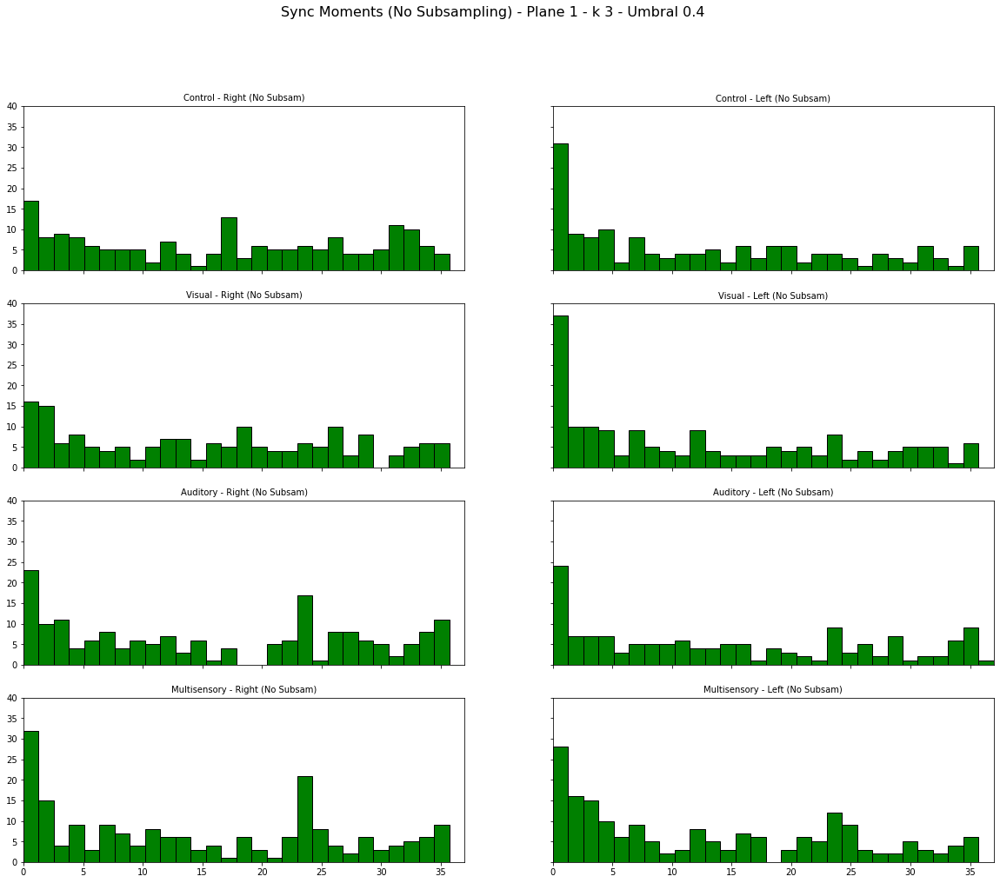

In [519]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['1']  # Solo un plano

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

sinc_mom_dic_6Hz = {}
sinc_mom_dic_6Hz_bin = {}
sinc_mom_dic_6Hz_subsam = {}

match_order = True  # True para que los datos subsam sigan el orden del sin subsam

for planos in planos_values:
    # Crear dos figuras, una para datos sin subsampling y otra para datos con subsampling
    
    fig_no_subsam_bin, axes_no_subsam_bin = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                                 figsize=(20, 16), sharex=True, sharey=True)

    umbral_bin = 20


    fig_no_subsam_bin.suptitle(f"Sync Moments (No Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)


    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):

                momentos_sincronia_bin = []
                # Iterar sobre las áreas
                for key in areas:
                    if '25' not in key:
                        for trial in areas[key].trials:
                            if trial.vis == vis_con and trial.aud == aud_con and key[-1] == planos:
                                # Datos sin subsampling
                                data_array = trial.roi_dffs["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                first_event_indices = np.argmax(data_array, axis=1)
                                sorted_indices = np.argsort(first_event_indices)
                                
                                data_array_bin = trial.roi_binaries["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                if match_order:
                                    sorted_data_array_bin = data_array_bin[sorted_indices]
                                data_z_bin = sorted_data_array_bin - np.expand_dims(np.mean(sorted_data_array_bin, axis=1), axis=1)
                                data_z_bin = data_z_bin / np.expand_dims(np.std(sorted_data_array_bin, axis=1), axis=1)
                                prop_act_bin = np.sum(sorted_data_array_bin, axis=0)*100/len(sorted_data_array_bin[:,0])
                                mascara_th_bin= prop_act_bin > umbral_bin
                                start_indices_bin = np.where((mascara_th_bin[:-1] == False) & (mascara_th_bin[1:] == True))[0] + 1
                                
                                if mascara_th[0]:
                                    start_indices = np.insert(start_indices, 0, 0)
                                if mascara_th_bin[0]:
                                    start_indices_bin = np.insert(start_indices_bin, 0, 0)


                                momentos_sincronia.extend(start_indices)
                                momentos_sincronia_bin.extend(start_indices_bin)


                # Definir la posición del subplot
                ax_no_subsam_bin = axes_no_subsam_bin[i * len(vis_con_values) + j, k]


                # Graficar histogramas sin subsampling
                if momentos_sincronia_bin:
                    momentos_sincronia_rescaled_bin = np.array(momentos_sincronia_bin) / 230 * 37
                    bins = np.linspace(0, 37, 30)  # Definir los bins en la escala correcta
                    ax_no_subsam_bin.hist(momentos_sincronia_rescaled_bin, bins=bins, color='green', edgecolor='black')
                    ax_no_subsam_bin.set_ylim(0, 40)
                    ax_no_subsam_bin.set_xlim(0, 37)  
                sinc_mom_dic_6Hz_bin[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia_rescaled
                
     

                # Títulos de cada subplot
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"

                ax_no_subsam_bin.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)

    # Ajustar el diseño y comentar el guardado de las figuras
    # plt.tight_layout(rect=[0, 0.03, 1, 0.97])

    # Guardar las figuras (COMENTADO PARA NO SOBREESCRIBIR)
    # plt.savefig(f"histogram_no_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')
    # plt.savefig(f"histogram_subsam_plane_{planos}.png", bbox_inches='tight', facecolor='white')

    plt.show()

In [ ]:
if momentos_sincronia_bin:
    # Reescalamos los datos (como ya haces)
    momentos_sincronia_rescaled_bin = np.array(momentos_sincronia_bin) / 230 * 37

    # Definir bins entre 10 y 20, por ejemplo 10 bins
    bins = np.linspace(10, 20, 11)
    
    # Separar los datos:
    # - Los que están en el rango [10,20]
    data_low = momentos_sincronia_rescaled_bin[(momentos_sincronia_rescaled_bin >= 10) & (momentos_sincronia_rescaled_bin <= 20)]
    # - Los que superan el umbral (>20)
    data_high = momentos_sincronia_rescaled_bin[momentos_sincronia_rescaled_bin > 20]
    # Para que los valores >20 se asignen a la última barra, se les fija el valor 20.
    data_high_adjusted = np.full_like(data_high, 20)
    
    # Graficar el histograma apilado:
    ax_no_subsam_bin.hist([data_low, data_high_adjusted], bins=bins, stacked=True,
                          color=['green', 'orange'], edgecolor='black')
    ax_no_subsam_bin.set_ylim(0, 40)
    ax_no_subsam_bin.set_xlim(10, 20)


c:\Users\PC\anaconda3\envs\PKLS\lib\site-packages\ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in true_divide


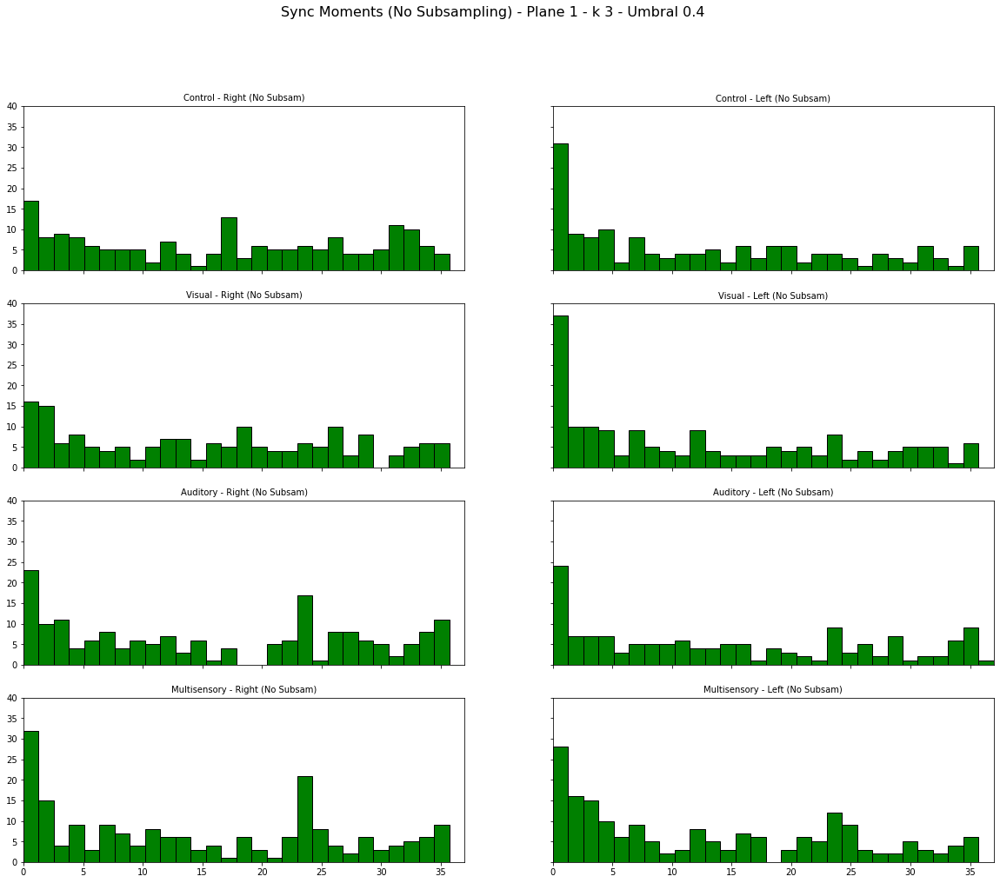

In [ ]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['1']  # Solo un plano

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

sinc_mom_dic_6Hz = {}
sinc_mom_dic_6Hz_bin = {}
sinc_mom_dic_6Hz_subsam = {}

match_order = True  # True para que los datos subsam sigan el orden del sin subsam

for planos in planos_values:
    # Crear dos figuras, una para datos sin subsampling y otra para datos con subsampling
    
    fig_no_subsam_bin, axes_no_subsam_bin = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                                 figsize=(20, 16), sharex=True, sharey=True)

    umbral_bin = 20


    fig_no_subsam_bin.suptitle(f"Sync Moments (No Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)


    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):

                momentos_sincronia_bin = []
                # Iterar sobre las áreas
                for key in areas:
                    if '25' not in key:
                        for trial in areas[key].trials:
                            if trial.vis == vis_con and trial.aud == aud_con and key[-1] == planos:
                                # Datos sin subsampling
                                data_array = trial.roi_dffs["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                first_event_indices = np.argmax(data_array, axis=1)
                                sorted_indices = np.argsort(first_event_indices)
                                
                                data_array_bin = trial.roi_binaries["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                if match_order:
                                    sorted_data_array_bin = data_array_bin[sorted_indices]
                                data_z_bin = sorted_data_array_bin - np.expand_dims(np.mean(sorted_data_array_bin, axis=1), axis=1)
                                data_z_bin = data_z_bin / np.expand_dims(np.std(sorted_data_array_bin, axis=1), axis=1)
                                prop_act_bin = np.sum(sorted_data_array_bin, axis=0)*100/len(sorted_data_array_bin[:,0])
                                mascara_th_bin= prop_act_bin > umbral_bin
                                start_indices_bin = np.where((mascara_th_bin[:-1] == False) & (mascara_th_bin[1:] == True))[0] + 1
                                

                                if mascara_th_bin[0]:
                                    start_indices_bin = np.insert(start_indices_bin, 0, 0)



                                momentos_sincronia_bin.extend(start_indices_bin)


                # Definir la posición del subplot
                ax_no_subsam_bin = axes_no_subsam_bin[i * len(vis_con_values) + j, k]


                # Graficar histogramas sin subsampling
                if momentos_sincronia_bin:
                    momentos_sincronia_rescaled_bin = np.array(momentos_sincronia_bin) / 230 * 37
                    bins = np.linspace(0, 37, 30)  # Definir los bins en la escala correcta
                    ax_no_subsam_bin.hist(momentos_sincronia_rescaled_bin, bins=bins, color='green', edgecolor='black')
                    ax_no_subsam_bin.set_ylim(0, 40)
                    ax_no_subsam_bin.set_xlim(0, 37)  
                
                
                sinc_mom_dic_6Hz_bin[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia_rescaled
                
     

                # Títulos de cada subplot
                
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"

                ax_no_subsam_bin.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)

    plt.show()

Ahora probams con los de 1hz, los 3 planos puleados

KeyError: 'A0-V0-LFalse-P1'

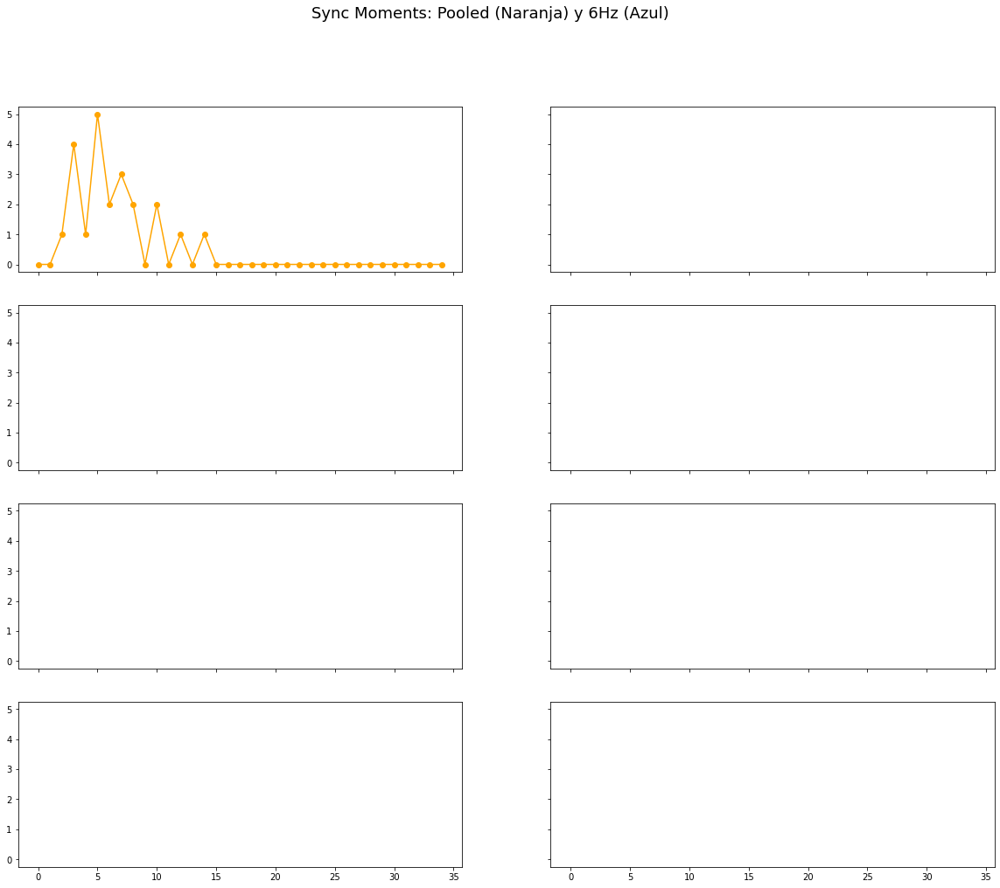

In [ ]:
# --- Parámetros y configuraciones iniciales ---
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
# En el pooling se usan los 3 planos; en el análisis 6Hz se usará el plano "1"
planos_pool = ['0', '1', '2']
planos_6Hz = '1'

trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

umbral = 0.4
kernel_no_subsam = np.array([1, 2, 1]) / 4  # Para filtrado (si se requiere)

# Para el gráfico 6Hz se define el mapeo de lateralidad:
# Se asume que en areas_1hz la key guarda directamente el valor de leftie, 
# pero en el análisis 6Hz se quiere distinguir: 
#    left_val = leftie_values[1] (se etiquetará "Left")
#    right_val = leftie_values[0] (se etiquetará "Right")
left_val  = leftie_values[1]   # para Left
right_val = leftie_values[0]   # para Right

# Obtener la lista de individuos a partir de las claves de areas_1hz (ej: "30-0" -> individuo "30")
individuals = sorted(set(key.split('-')[0] for key in areas_1hz if '52' not in key))

# Definir la grilla de subplots:
num_rows = len(aud_con_values) * len(vis_con_values)  # Cada combinación (aud, vis) ocupa una fila
num_cols = 2  # Una columna para cada lateralidad: Left y Right
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 16), sharex=True, sharey=True)
fig.suptitle("Sync Moments: Pooled (Naranja) y 6Hz (Azul)", fontsize=18)

# Contador para el índice de fila en la grilla
row = 0

# Loop sobre las condiciones de audio y visual
for aud_con in aud_con_values:
    for vis_con in vis_con_values:
        # Para cada fila se crearán dos subplots: columna 0 = Left, columna 1 = Right
        for col, (side_val, side_label) in enumerate([(left_val, "Left"), (right_val, "Right")]):
            # Seleccionar el subplot correspondiente
            ax = axes[row, col] if num_rows > 1 else axes[col]
            
            # --- 1. Análisis Pooling (los 3 planos) ---
            # Se acumulan los sync moments (índices de frame) de todos los individuos y trials
            momentos_sincronia = []
            n_frames = None  # Para definir la longitud de la serie temporal
            
            for indiv in individuals:
                # Para cada individuo se toman las claves de los 3 planos (pooling)
                keys_for_indiv = [f"{indiv}-{p}" for p in planos_pool if f"{indiv}-{p}" in areas_1hz]
                if not keys_for_indiv:
                    continue
                # Se asume que todos los keys de un mismo individuo tienen el mismo número de trials
                n_trials = len(areas_1hz[keys_for_indiv[0]].trials)
                for trial_idx in range(n_trials):
                   


Vamos con algo de locación de la respuesta, la idea es la siguiente:
Asumamos que hay cierta distribución de neuronas que responden a nuestros estímulos, como podemos comparar su ubicación de animal a animal, de plano a plano?
Ides:
* Tomar el punto central del marcaje de la region de la Habenula y calcular el angulo en el que esta la neurona que responde en los eventos relevantes, esta idea se puede llevar así o simplificarla para q no de tan ruidoso, por ej partir en 4 cuadrantes ó en 8 tipo pizza, de esta manera podríamos llegar a tener una idea de como se distribuyen las neuronas que responden.
* Se puede calcular la distancia entre las neuronas que responden para ver si están cerca ó no. Tendríamos que tener un grupo control de distribución de distancias pero no se cual podría ser. 
* 

In [567]:
area.polygons_per_area_small['Hb'][0][:,0]

array([ 66,  68,  76,  91, 105, 120, 121, 119, 115, 111, 101,  94,  85,
        76,  67,  64])

In [695]:
# import math
# import random

def polygon_centroid(vertices):
    """
    Calcula el centroide (centro geométrico) de un polígono definido por sus vértices.
    No modifica la lista original 'vertices'.
    """
    n = len(vertices)
    if n == 0:
        return None

    A = 0  # Área duplicada del polígono
    Cx = 0
    Cy = 0

    for i in range(n):
        x0, y0 = vertices[i]
        x1, y1 = vertices[(i+1) % n]
        cross = x0 * y1 - x1 * y0
        A += cross
        Cx += (x0 + x1) * cross
        Cy += (y0 + y1) * cross

    A *= 0.5
    if abs(A) < 1e-8:
        # Polígono degenerado: retorna el promedio de los puntos
        return (sum(x for x, _ in vertices) / n, sum(y for _, y in vertices) / n)
    
    Cx /= (6 * A)
    Cy /= (6 * A)
    return (Cx, Cy)

def is_in_circle(circle, point, eps=1e-8):
    """
    Verifica si el punto 'point' (x, y) está dentro o sobre el borde del círculo.
    'circle' es una tupla (cx, cy, r).
    """
    cx, cy, r = circle
    return math.hypot(point[0] - cx, point[1] - cy) <= r + eps

def circle_from_two_points(p, q):
    """
    Calcula el círculo cuyo diámetro es el segmento que une los puntos 'p' y 'q'.
    No modifica 'p' ni 'q'.
    """
    cx = (p[0] + q[0]) / 2.0
    cy = (p[1] + q[1]) / 2.0
    r = math.hypot(p[0] - q[0], p[1] - q[1]) / 2.0
    return (cx, cy, r)

def circle_from_three_points(p, q, r):
    """
    Calcula el círculo circunscrito que pasa por los tres puntos: 'p', 'q' y 'r'.
    Si los puntos son colineales, retorna None.
    No modifica ninguno de los puntos de entrada.
    """
    ax, ay = p
    bx, by = q
    cx, cy = r
    d = 2 * (ax*(by-cy) + bx*(cy-ay) + cx*(ay-by))
    if abs(d) < 1e-8:
        return None
    ux = ((ax**2 + ay**2)*(by-cy) + (bx**2 + by**2)*(cy-ay) + (cx**2 + cy**2)*(ay-by)) / d
    uy = ((ax**2 + ay**2)*(cx-bx) + (bx**2 + by**2)*(ax-cx) + (cx**2 + cy**2)*(bx-ax)) / d
    rad = math.hypot(ax-ux, ay-uy)
    return (ux, uy, rad)

def minimum_enclosing_circle(points, num_circle_points=20):
    """
    Calcula el círculo mínimo que encierra todos los puntos usando el algoritmo aleatorizado de Welzl.
    No modifica la lista original 'points'.
    
    Retorna una tupla 'circle' donde:
      - circle[0]: centro x
      - circle[1]: centro y
      - circle[2]: radio
      - circle[3]: lista de puntos (x, y) que representan el contorno del círculo para graficarlo.
    """
    # Crear una copia de la lista de puntos para no modificar el original
    points_copy = list(points)
    random.shuffle(points_copy)
    circle = None

    for i, p in enumerate(points_copy):
        if circle is None or not is_in_circle(circle, p):
            circle = (p[0], p[1], 0)
            for j in range(i):
                q = points_copy[j]
                if not is_in_circle(circle, q):
                    circle = circle_from_two_points(p, q)
                    for k in range(j):
                        r = points_copy[k]
                        if not is_in_circle(circle, r):
                            candidate = circle_from_three_points(p, q, r)
                            if candidate is not None:
                                circle = candidate
    if circle is not None:
        cx, cy, r = circle
        # Generar puntos en el contorno del círculo para graficarlo
        circle_points = [
            (cx + r * math.cos(2 * math.pi * i / num_circle_points),
             cy + r * math.sin(2 * math.pi * i / num_circle_points))
            for i in range(num_circle_points)
        ]
        circle = (cx, cy, r, circle_points)
    return circle


In [696]:
# import math

def point_in_polygon(point, polygon):
    """
    Verifica si un punto está dentro de un polígono utilizando el algoritmo de ray casting.
    """
    x, y = point
    inside = False
    n = len(polygon)
    for i in range(n):
        x1, y1 = polygon[i]
        x2, y2 = polygon[(i + 1) % n]
        # Se verifica si la línea horizontal a la altura de 'y' intersecta el borde formado por (x1,y1)-(x2,y2)
        if ((y1 > y) != (y2 > y)) and (x < (x2 - x1) * (y - y1) / (y2 - y1) + x1):
            inside = not inside
    return inside

def distance_point_to_segment(p, a, b):
    """
    Calcula la distancia mínima desde el punto p hasta el segmento definido por los puntos a y b.
    """
    (px, py) = p
    (ax, ay) = a
    (bx, by) = b
    dx = bx - ax
    dy = by - ay
    if dx == 0 and dy == 0:
        return math.hypot(px - ax, py - ay)
    t = ((px - ax) * dx + (py - ay) * dy) / (dx * dx + dy * dy)
    if t < 0:
        return math.hypot(px - ax, py - ay)
    elif t > 1:
        return math.hypot(px - bx, py - by)
    else:
        proj_x = ax + t * dx
        proj_y = ay + t * dy
        return math.hypot(px - proj_x, py - proj_y)

def distance_to_polygon(point, polygon):
    """
    Calcula la distancia mínima desde un punto al borde del polígono.
    Se recorre cada lado (segmento) y se toma la mínima distancia.
    """
    distances = []
    n = len(polygon)
    for i in range(n):
        a = polygon[i]
        b = polygon[(i + 1) % n]
        distances.append(distance_point_to_segment(point, a, b))
    return min(distances)

def maximum_inscribed_circle(polygon, num_circle_points=20, grid_steps=50, refinement_iterations=5):
    """
    Calcula de forma aproximada el mayor círculo que cabe dentro del polígono mediante
    una búsqueda en rejilla con refinamientos sucesivos.
    
    Parámetros:
      - polygon: lista de vértices que definen el polígono (no se modifica).
      - num_circle_points: cantidad de puntos en el contorno del círculo para graficarlo.
      - grid_steps: número de pasos en cada dimensión para la búsqueda inicial.
      - refinement_iterations: número de refinamientos de la región de búsqueda.
    
    Retorna una tupla (cx, cy, r, circle_points) donde:
      - (cx, cy) es el centro del círculo,
      - r es el radio,
      - circle_points es la lista de puntos (x, y) representando el contorno del círculo.
    """
    # Copiar el polígono para no modificar el input original
    poly = list(polygon)
    
    # Calcular el cuadro delimitador (bounding box) del polígono
    xs = [p[0] for p in poly]
    ys = [p[1] for p in poly]
    min_x, max_x = min(xs), max(xs)
    min_y, max_y = min(ys), max(ys)
    
    # Inicializar la mejor solución encontrada
    best_center = None
    best_radius = 0
    
    # Región de búsqueda inicial: el bounding box completo
    region_min_x, region_max_x = min_x, max_x
    region_min_y, region_max_y = min_y, max_y
    
    for _ in range(refinement_iterations):
        dx = (region_max_x - region_min_x) / grid_steps
        dy = (region_max_y - region_min_y) / grid_steps
        
        for i in range(grid_steps + 1):
            for j in range(grid_steps + 1):
                candidate_x = region_min_x + i * dx
                candidate_y = region_min_y + j * dy
                candidate = (candidate_x, candidate_y)
                # Considerar solo candidatos dentro del polígono
                if point_in_polygon(candidate, poly):
                    d = distance_to_polygon(candidate, poly)
                    if d > best_radius:
                        best_radius = d
                        best_center = candidate
        # Si no se encontró candidato, se finaliza la búsqueda
        if best_center is None:
            break
        
        cx, cy = best_center
        # Refinar la región de búsqueda: reducirla alrededor del mejor candidato encontrado.
        region_width = (region_max_x - region_min_x) / 2
        region_height = (region_max_y - region_min_y) / 2
        region_min_x = cx - region_width / 2
        region_max_x = cx + region_width / 2
        region_min_y = cy - region_height / 2
        region_max_y = cy + region_height / 2
    
    # Generar puntos en el contorno del círculo para graficarlo
    circle_points = [
        (best_center[0] + best_radius * math.cos(2 * math.pi * i / num_circle_points),
         best_center[1] + best_radius * math.sin(2 * math.pi * i / num_circle_points))
        for i in range(num_circle_points)
    ]
    
    return (best_center[0], best_center[1], best_radius, circle_points)


In [729]:
area.roi_lefties['Hb']

array([ True,  True, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False, False,  True,  True,
       False, False,  True, False, False, False, False,  True, False,
       False,  True, False, False,  True, False,  True,  True, False,
       False,  True, False, False, False,  True,  True, False, False,
       False,  True, False, False,  True, False,  True, False,  True,
       False,  True, False,  True, False, False, False,  True,  True,
       False, False,  True, False,  True,  True,  True,  True, False,
       False,  True, False, False, False, False, False, False,  True,
        True,  True, False,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [ ]:
color_area = {'Hb':'Blue', 'palium': 'orange'}
alpha_area = {'Hb':.8, 'palium': .4}
for key in areas:
    if '28' not in key and '51' not in key:  
    # if '2-1' == key :  
        # print(key)
        area = areas[key]
        plt.figure(figsize=(20,20))
        plt.imshow(cv2.resize(areas[key].template , (256, 128)), cmap='gray')
        for j, subarea in enumerate(area.centers_small):
            # centers_small = area.centers_small[subarea][area.roi_lefties[subarea]==True]
            centers_small = area.centers_small[subarea][area.roi_lefties[subarea]==True]
            plt.plot(centers_small[:,0], centers_small[:,1], "o", label = subarea, markersize=5, color=color_area[subarea], alpha=alpha_area[subarea])
        # for j in [0,1]:
            centro_poligono = polygon_centroid(area.polygons_per_area_small['Hb'][j])
            # circ_out= minimum_enclosing_circle(area.polygons_per_area_small['Hb'][j])
            # circ_in= maximum_inscribed_circle(area.polygons_per_area_small['Hb'][j])
            plt.scatter(area.polygons_per_area_small['Hb'][j][:,0],area.polygons_per_area_small['Hb'][j][:,1],color='lime', alpha=.8 )
            plt.plot(area.polygons_per_area_small['Hb'][j][:,0],area.polygons_per_area_small['Hb'][j][:,1],color='lime', alpha=.5 )
            # plt.scatter(np.median(area.polygons_per_area_small['Hb'][0][:,0]), np.median(area.polygons_per_area_small['Hb'][0][:,1]), color='pink', s=50)
            # plt.scatter(np.median(area.centers_small['Hb'][area.roi_lefties['Hb'] == True][:,0]), np.median(area.centers_small['Hb'][area.roi_lefties['Hb'] == True][:,1]), color='lime', s=100)
            plt.scatter(centro_poligono[0], centro_poligono[1], color='lime', s=50)

            # plt.scatter(np.array(circ_out[3])[:,0],np.array(circ_out[3])[:,1], color='r', alpha=.8)
            # plt.plot(np.array(circ_out[3])[:,0],np.array(circ_out[3])[:,1], color='r', alpha=.5)
            # plt.scatter(circ_out[0],circ_out[1], color='r', alpha=.8)
            # plt.scatter(np.array(circ_in[3])[:,0],np.array(circ_in[3])[:,1], color='orange', alpha=.8)
            # plt.plot(np.array(circ_in[3])[:,0],np.array(circ_in[3])[:,1], color='orange', alpha=.5)
            # plt.scatter(circ_in[0],circ_in[1], color='orange', alpha=.8)
        plt.legend()
        plt.show()

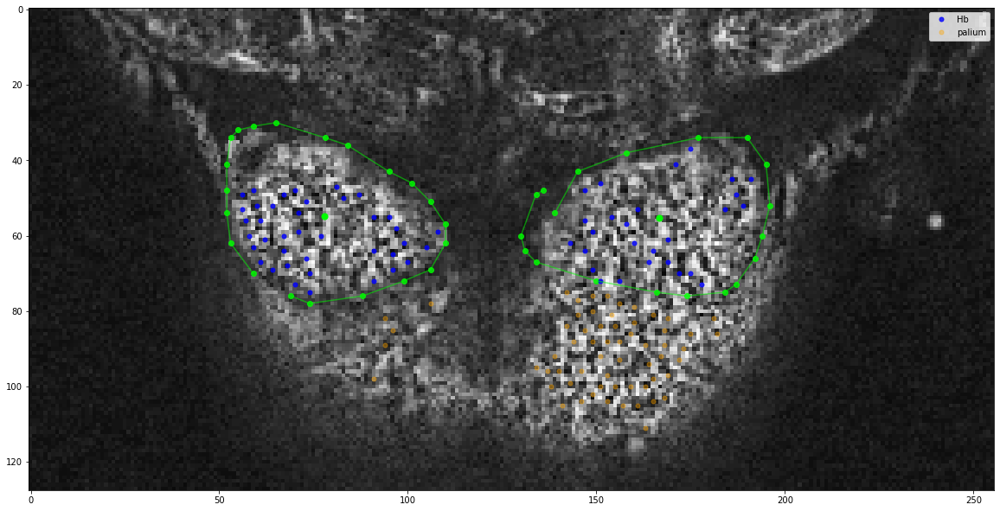

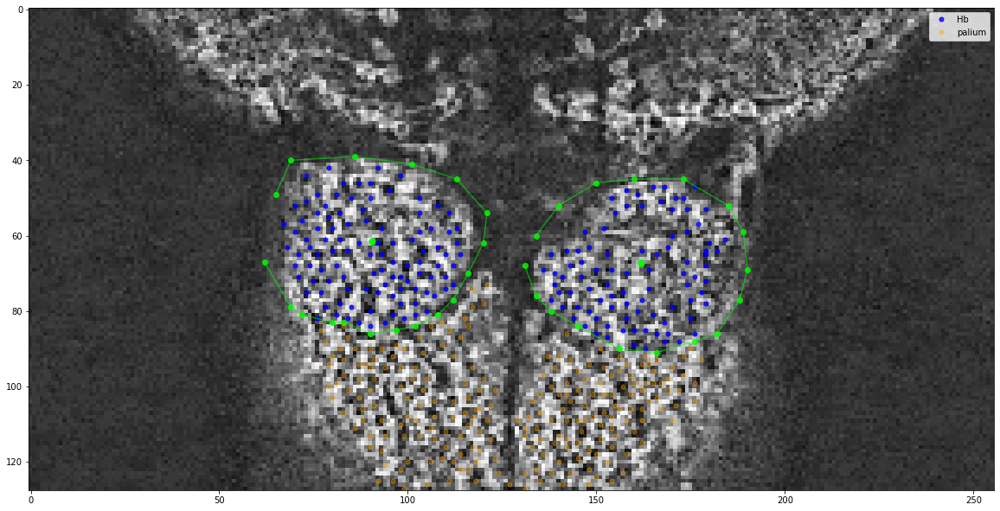

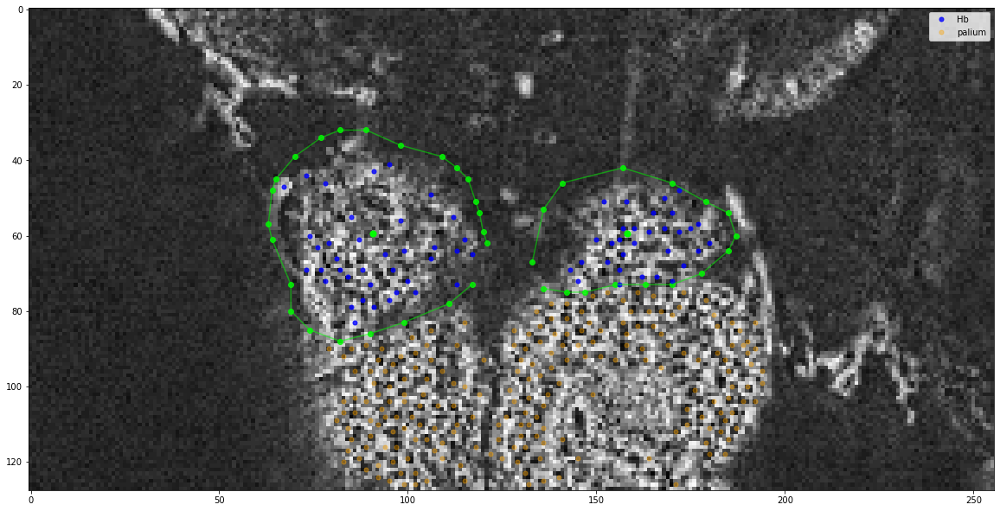

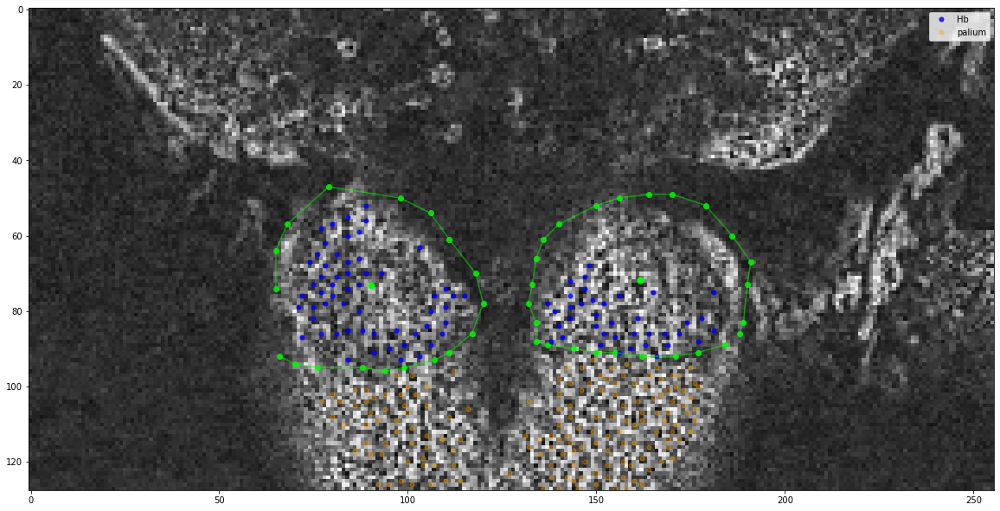

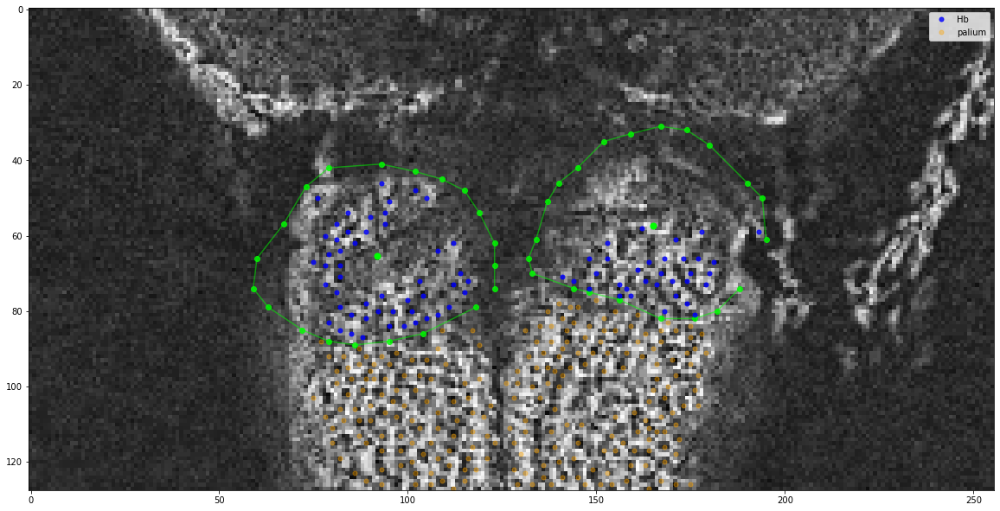

...

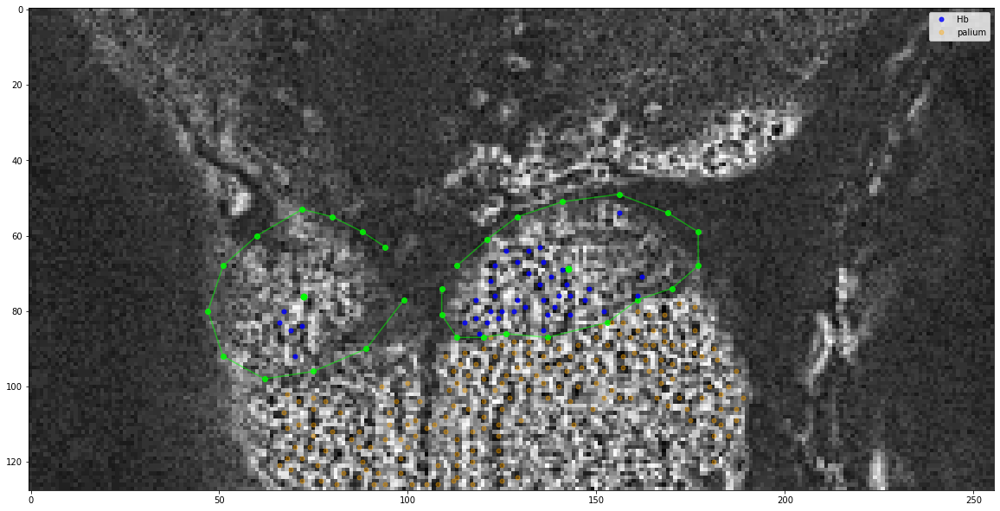

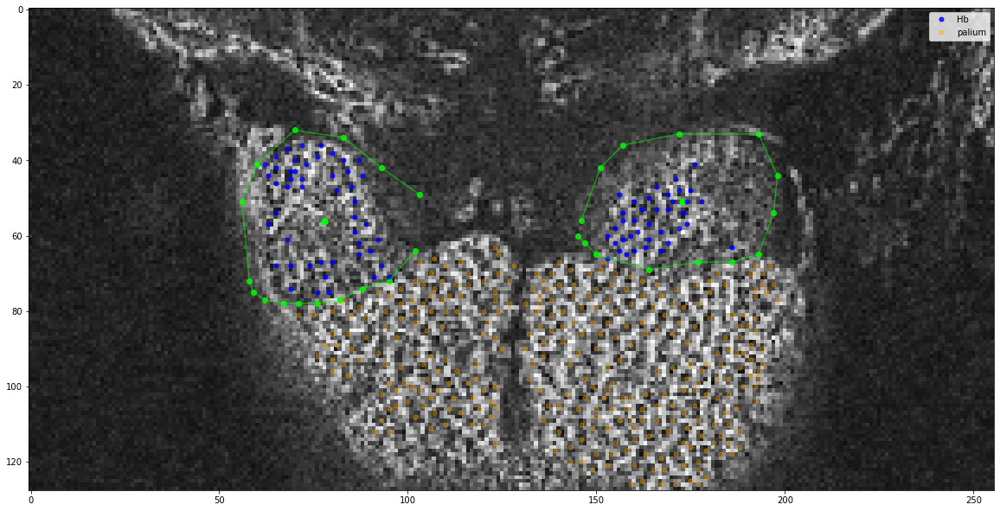

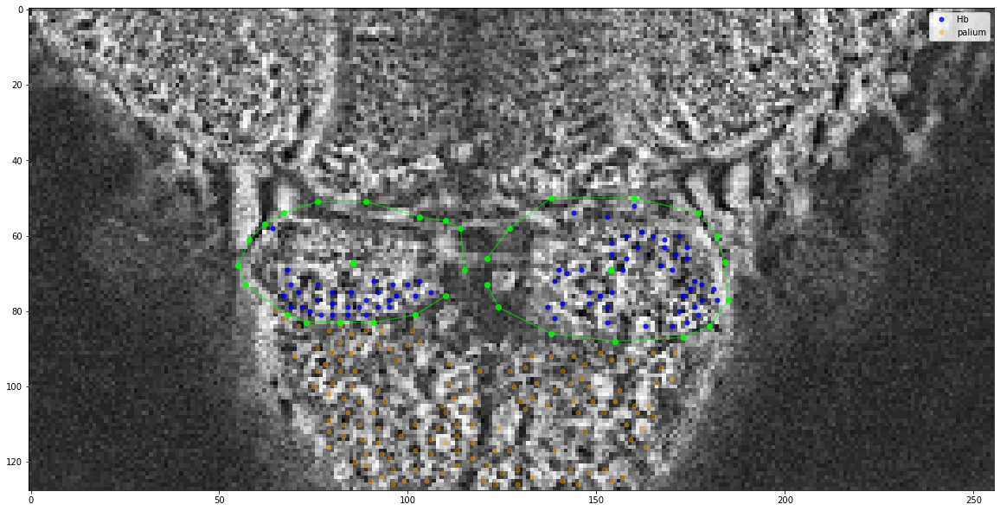

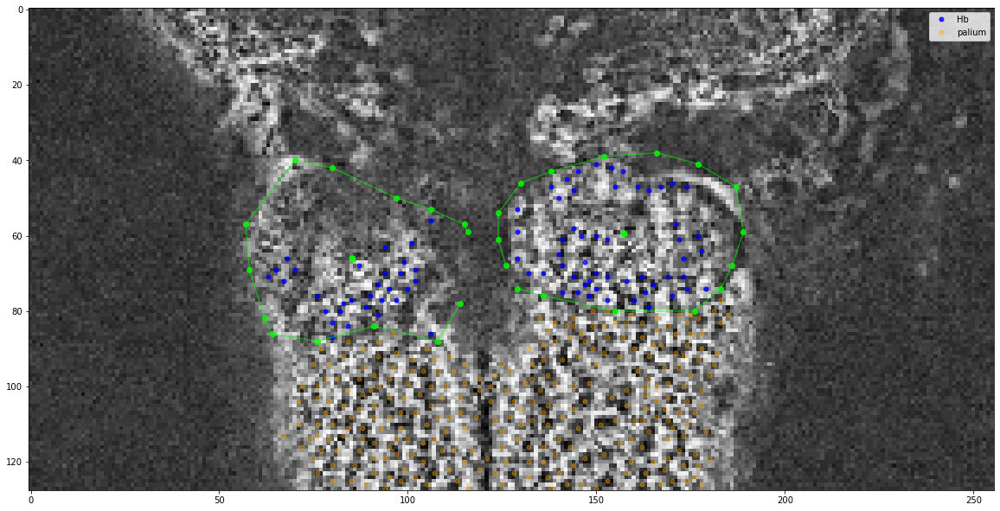

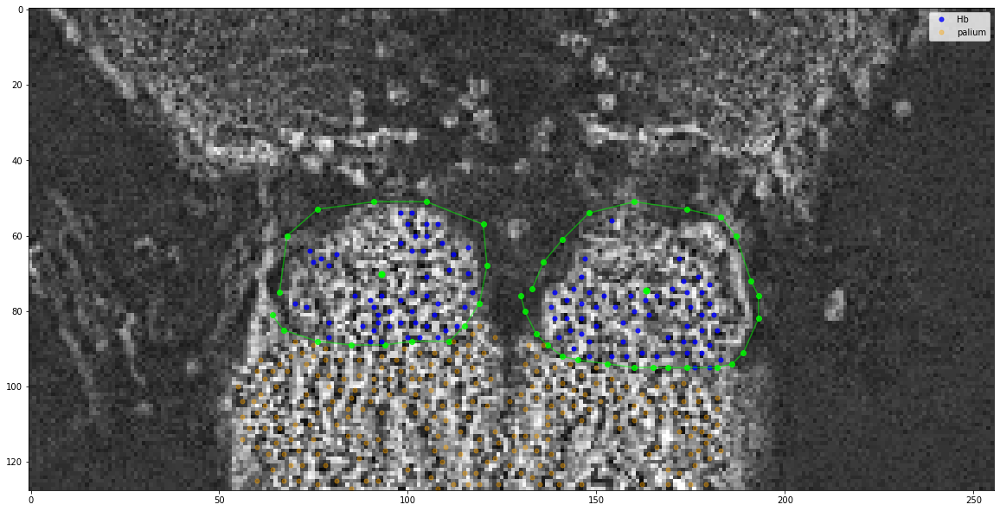

In [746]:
color_area = {'Hb':'Blue', 'palium': 'orange'}
alpha_area = {'Hb':.8, 'palium': .4}
for key in areas:
    if '28' not in key and '51' not in key:  
        area = areas[key]
        plt.figure(figsize=(20,20))
        plt.imshow(cv2.resize(areas[key].template , (256, 128)), cmap='gray')
        for j, subarea in enumerate(area.centers_small):
            # centers_small = area.centers_small[subarea][area.roi_lefties[subarea]==False]
            centers_small = area.centers_small[subarea]
            plt.plot(centers_small[:,0], centers_small[:,1], "o", label = subarea, markersize=5, color=color_area[subarea], alpha=alpha_area[subarea])
            centro_poligono = polygon_centroid(area.polygons_per_area_small['Hb'][j])
            plt.scatter(area.polygons_per_area_small['Hb'][j][:,0],area.polygons_per_area_small['Hb'][j][:,1],color='lime', alpha=.8 )
            plt.plot(area.polygons_per_area_small['Hb'][j][:,0],area.polygons_per_area_small['Hb'][j][:,1],color='lime', alpha=.5 )
            plt.scatter(centro_poligono[0], centro_poligono[1], color='lime', s=50)
        plt.legend()
        plt.show()

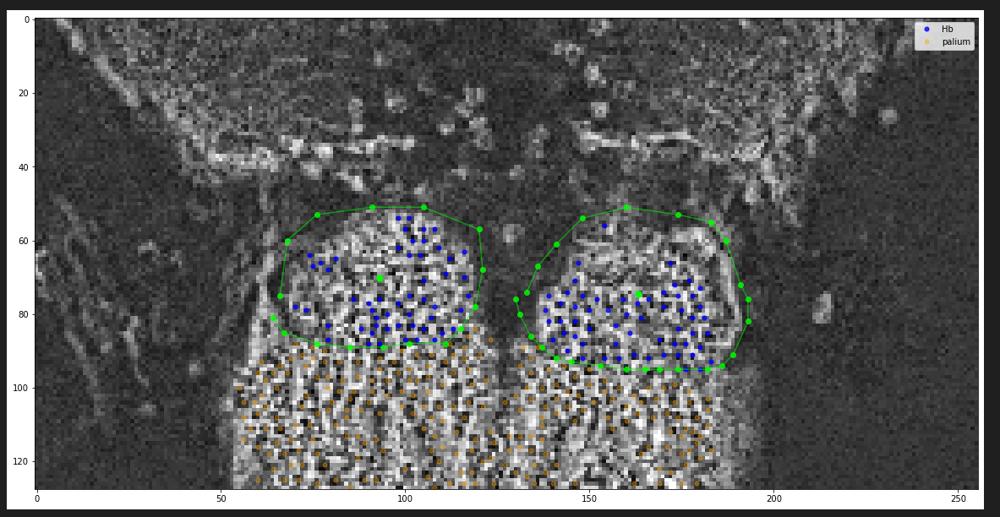

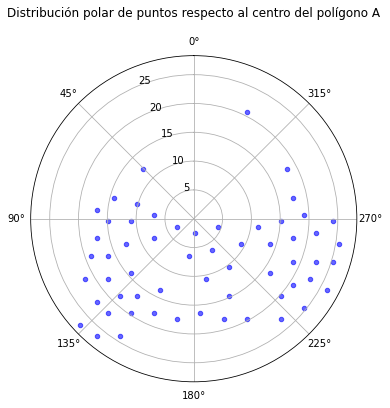

In [747]:
# import numpy as np
# import matplotlib.pyplot as plt
# from matplotlib.path import Path
centers_small = area.centers_small['Hb']

# Supongamos que este polígono es area.polygons_per_area_small['Hb'][j]
polygon_coords = area.polygons_per_area_small['Hb'][j]  # Array Nx2 con vértices (x, y)

# Calcula el centroide del polígono (asumiendo que ya tienes la función polygon_centroid)
centro_poligono = polygon_centroid(polygon_coords)  # -> [cx, cy]

# Convierte el polígono en un objeto Path de matplotlib
polygon_path = Path(polygon_coords)

# Filtra los puntos que estén dentro del polígono
# centers_small es un array Mx2 con todos tus puntos
inside_mask = polygon_path.contains_points(centers_small)
points_in_poly = centers_small[inside_mask]

# Definimos el vector de referencia "hacia arriba"
# En coordenadas de imagen, "arriba" normalmente es disminuir Y (vector [0, -1])
ref_vec = np.array([0, -1])

distances = []
angles = []

for pt in points_in_poly:
    # Vector desde el centro del polígono hasta el punto
    dx = pt[0] - centro_poligono[0]
    dy = pt[1] - centro_poligono[1]
    
    # Distancia al centro
    dist = np.sqrt(dx**2 + dy**2)
    
    # Calculamos el ángulo usando producto cruzado y producto punto
    # cross(ref, v) = ref.x * v.y - ref.y * v.x
    cross_val = ref_vec[0]*dy - ref_vec[1]*dx
    # dot(ref, v) = ref.x * v.x + ref.y * v.y
    dot_val = ref_vec[0]*dx + ref_vec[1]*dy
    
    # El ángulo va de -π a π. Éste es el ángulo entre ref_vec y (dx, dy)
    ang = np.arctan2(cross_val, dot_val)
    
    distances.append(dist)
    angles.append(ang)

distances = np.array(distances)
angles = np.array(angles)

# Graficamos en un diagrama polar
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, polar=True)

# ax.scatter(ángulo, radio)
ax.scatter(angles, distances, s=20, c='b', alpha=0.6)
ax.set_title("Distribución polar de puntos respecto al centro del polígono A", pad=20)
ax.set_theta_zero_location("N")  # “N” de North, ubica 0° en la parte superior


plt.show()


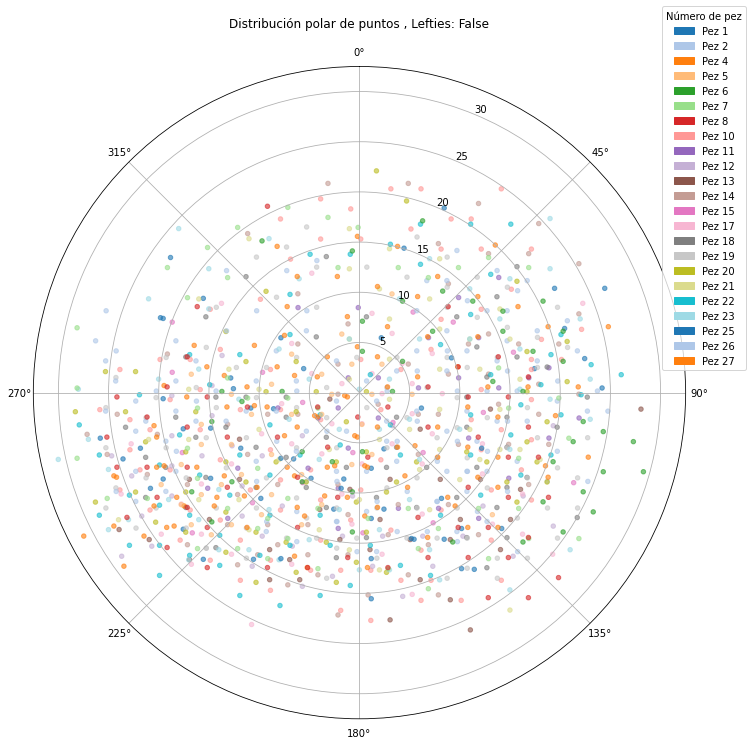

In [768]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as mpatches
lefties=False
# 1. Recolectar todos los números de pez de las áreas que cumplen la condición.
fish_set = set()
for key in areas:
    if '28' not in key and '51' not in key:
        fish_set.add( areas[key].pez )  # Se usa el atributo directamente

fish_list = sorted(list(fish_set))
# Seleccionamos un colormap adecuado según el número de peces
cmap_name = 'tab10' if len(fish_list) <= 10 else 'tab20'
cmap = plt.get_cmap(cmap_name)
# Asignamos un color distinto a cada pez
fish_colors = { fish: cmap(i % cmap.N) for i, fish in enumerate(fish_list) }

# Listas globales para almacenar distancias, ángulos y colores
global_distances = []
global_angles = []
global_colors = []

# 2. Iterar sobre cada área (animal/pez)
for key in areas:
    if '28' not in key and '51' not in key:
        area = areas[key]
        # Obtenemos el número de pez (atributo, sin paréntesis)
        fish_num = area.pez  
        current_color = fish_colors[fish_num]
        
        # Se asume que cada área tiene varios polígonos en la subárea 'Hb'
        num_polygons = len(area.polygons_per_area_small['Hb'])
        for j in range(num_polygons):
            # Polígono A: j-ésimo polígono de 'Hb'
            polygon_coords = area.polygons_per_area_small['Hb'][j]
            # Calculamos su centroide (se asume que tienes definida la función polygon_centroid)
            centro_poligono = polygon_centroid(polygon_coords)
            # Creamos un objeto Path para identificar los puntos dentro del polígono
            polygon_path = Path(polygon_coords)
            
            # Iteramos sobre cada subárea en centers_small
            for subarea_key in area.centers_small:
                # Filtramos los puntos según el criterio de roi_lefties
                points = area.centers_small[subarea_key][area.roi_lefties[subarea_key] == lefties]
                # Verificamos cuáles puntos se encuentran dentro del polígono
                inside_mask = polygon_path.contains_points(points)
                points_in_poly = points[inside_mask]
                
                # Para cada punto dentro del polígono, calculamos la distancia y el ángulo respecto al centroide
                for pt in points_in_poly:
                    dx = pt[0] - centro_poligono[0]
                    dy = pt[1] - centro_poligono[1]
                    dist = np.sqrt(dx**2 + dy**2)
                    
                    # Vector de referencia "arriba": en imágenes es común usar [0, -1]
                    ref_vec = np.array([0, -1])
                    cross_val = ref_vec[0]*dy - ref_vec[1]*dx
                    dot_val = ref_vec[0]*dx + ref_vec[1]*dy
                    angle = np.arctan2(cross_val, dot_val)
                    
                    global_distances.append(dist)
                    global_angles.append(angle)
                    global_colors.append(current_color)

# Convertir las listas a arrays de NumPy para graficar
global_distances = np.array(global_distances)
global_angles = np.array(global_angles)

# 3. Crear el gráfico polar global con los puntos coloreados según el número de pez
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, polar=True)
ax.scatter(global_angles, global_distances, s=20, c=global_colors, alpha=0.6)

# Configuramos para que el 0° esté en la parte superior y los ángulos aumenten en sentido horario
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
ax.set_title(f"Distribución polar de puntos , Lefties: {lefties}", pad=20)

# 4. Crear la leyenda: un parche para cada pez
legend_handles = [mpatches.Patch(color=fish_colors[fish], label=f"Pez {fish}") for fish in fish_list]
ax.legend(handles=legend_handles, title="Número de pez", loc="upper right", bbox_to_anchor=(1.1, 1.1))

plt.show()


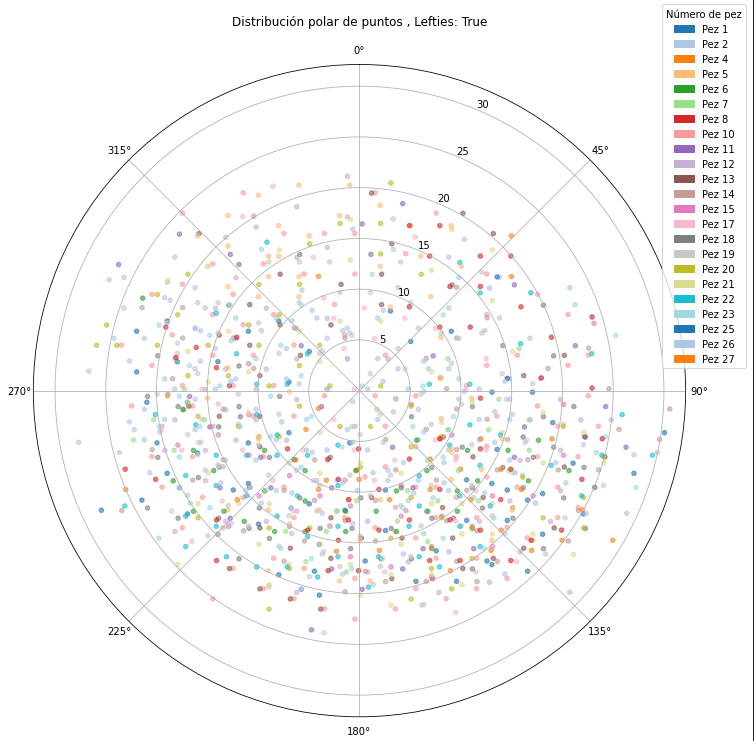 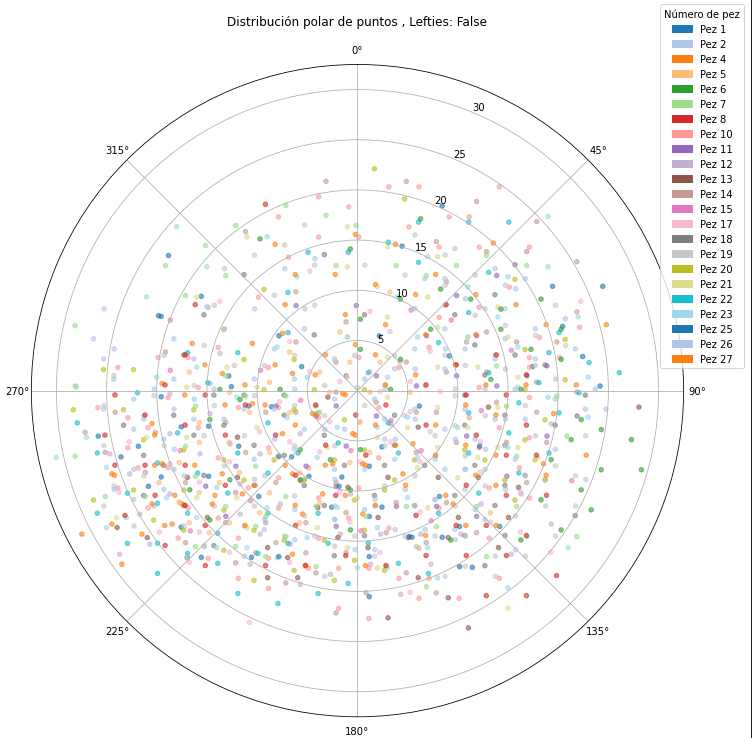

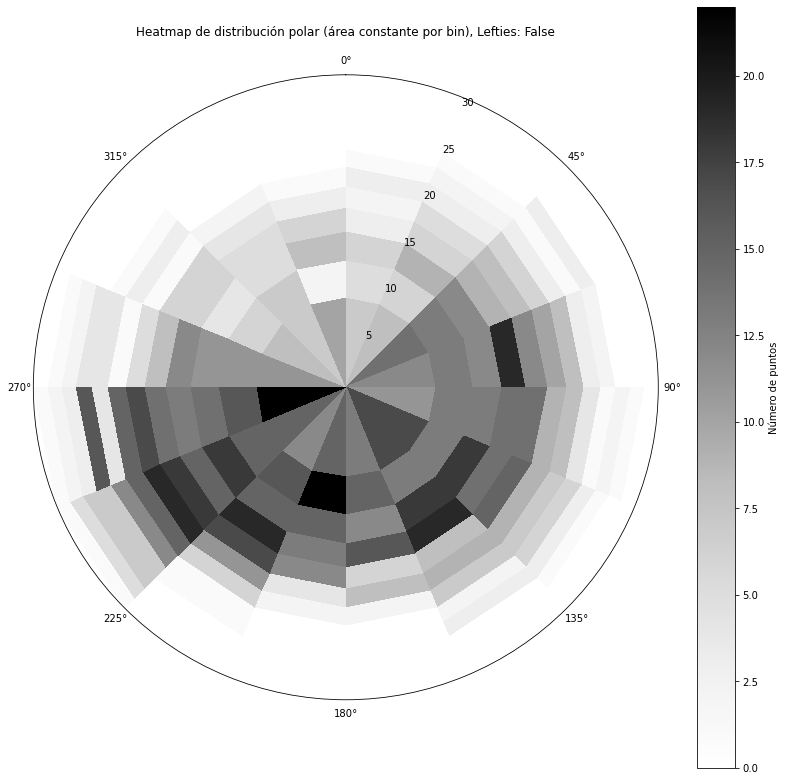

In [783]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path

lefties = False

# Parámetro para ajustar el tamaño de los bines radiales.
# Valor mayor => más bines (cada uno más chico), valor menor => menos bines (cada uno más grande).
bin_scale = 0.25  # Ajusta este valor a tu gusto

# Parámetro para ajustar la cantidad de divisiones angulares en el heatmap.
angular_bins = 16  # Puedes cambiar este valor para tener más o menos divisiones angulares

# Cantidades base de bines para ángulo y radio
n_theta_base = angular_bins   # Usamos angular_bins como base para los bines angulares
n_r_base = 50                 # Bines radiales base

# Ajustamos el número de bines radiales según el factor bin_scale
n_theta = n_theta_base
n_r = int(n_r_base * bin_scale)

# Listas para almacenar distancias y ángulos globales
global_distances = []
global_angles = []

# Recorrer cada área (ignorando aquellas que contienen '28' o '51')
for key in areas:
    if '28' not in key and '51' not in key:
        area = areas[key]
        # Iterar sobre cada polígono de la subárea 'Hb'
        for j in range(len(area.polygons_per_area_small['Hb'])):
            # Polígono A: j-ésimo polígono
            polygon_coords = area.polygons_per_area_small['Hb'][j]
            # Calcular su centroide (se asume que polygon_centroid está definida)
            centro_poligono = polygon_centroid(polygon_coords)
            # Crear objeto Path para el polígono
            polygon_path = Path(polygon_coords)
            
            # Iterar sobre cada subárea en centers_small
            for subarea_key in area.centers_small:
                # Obtener puntos y filtrar según roi_lefties
                points = area.centers_small[subarea_key][area.roi_lefties[subarea_key] == lefties]
                # Determinar qué puntos están dentro del polígono
                inside_mask = polygon_path.contains_points(points)
                points_in_poly = points[inside_mask]
                
                # Calcular distancia y ángulo de cada punto respecto al centroide
                for pt in points_in_poly:
                    dx = pt[0] - centro_poligono[0]
                    dy = pt[1] - centro_poligono[1]
                    dist = np.sqrt(dx**2 + dy**2)
                    # Usar vector "arriba": [0, -1] (convención en imágenes)
                    ref_vec = np.array([0, -1])
                    cross_val = ref_vec[0] * dy - ref_vec[1] * dx
                    dot_val = ref_vec[0] * dx + ref_vec[1] * dy
                    angle = np.arctan2(cross_val, dot_val)
                    
                    global_distances.append(dist)
                    global_angles.append(angle)

# Convertir a arrays NumPy
global_distances = np.array(global_distances)
global_angles = np.array(global_angles)

# Bines angulares uniformes (entre -π y π)
theta_bins = np.linspace(-np.pi, np.pi, n_theta + 1)

# Para que cada bin radial tenga área constante, definimos los bordes radiales de forma no lineal:
r_max = global_distances.max()
r_bins = np.sqrt(np.linspace(0, r_max**2, n_r + 1))

# Crear el histograma 2D (ángulo vs radio)
H, _, _ = np.histogram2d(global_angles, global_distances, bins=[theta_bins, r_bins])

# Crear el gráfico polar y usar pcolormesh para el heatmap
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(14, 14))
pc = ax.pcolormesh(theta_bins, r_bins, H.T, shading='auto', cmap='Greys')

# Configurar que 0° quede arriba y que los ángulos avancen en sentido horario
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
ax.set_title(f"Heatmap de distribución polar (área constante por bin), Lefties: {lefties}", pad=20)

# Barra de color indicando la cuenta de puntos
cbar = fig.colorbar(pc, ax=ax, label='Número de puntos')
plt.show()


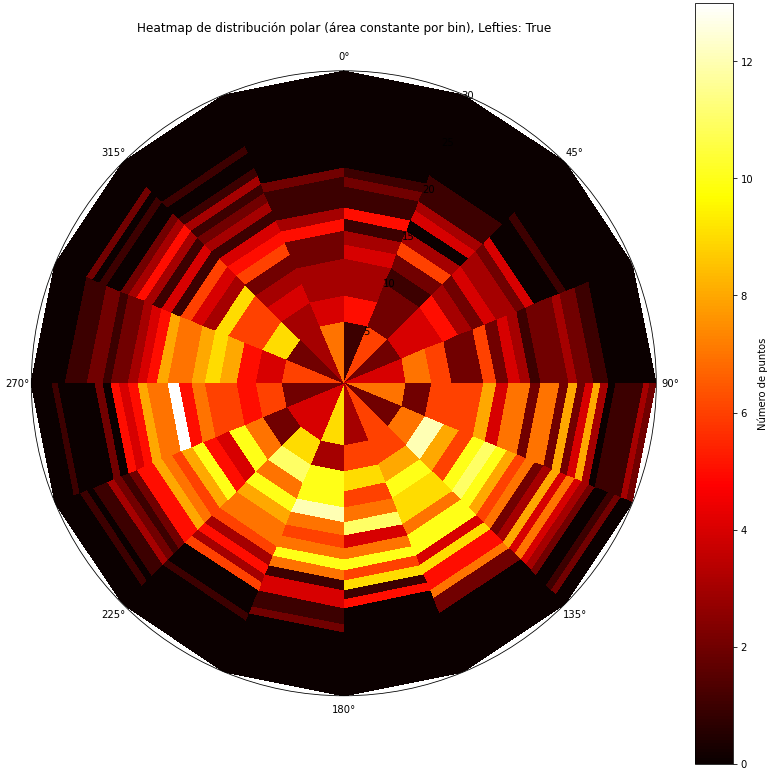 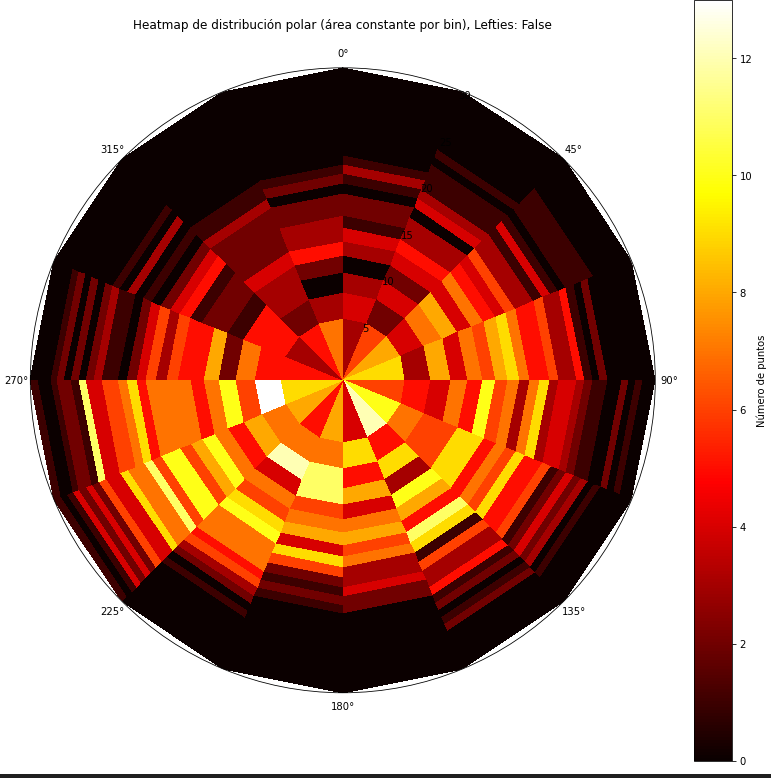

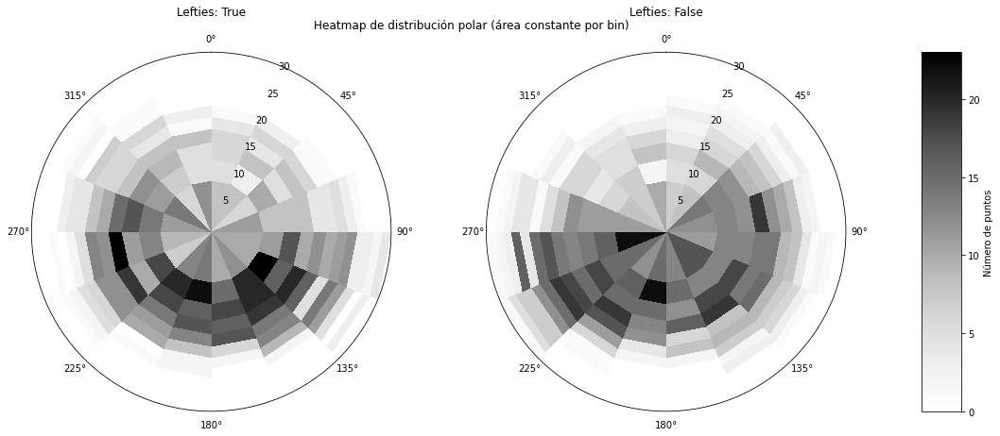

In [786]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.gridspec as gridspec
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Parámetros
bin_scale = 0.25      # Ajusta el tamaño de los bines radiales (mayor valor => más bines pequeños)
angular_bins = 16     # Cantidad de divisiones angulares en el heatmap

n_theta_base = angular_bins  # Bines angulares base
n_r_base = 50                # Bines radiales base

n_theta = n_theta_base
n_r = int(n_r_base * bin_scale)

def compute_heatmap_data(lefties_val):
    """
    Recorre todas las áreas y acumula globalmente los ángulos y distancias
    de los puntos (filtrados por el valor lefties_val) respecto al centroide de cada polígono.
    """
    global_distances = []
    global_angles = []
    
    for key in areas:
        if '28' not in key and '51' not in key:
            area = areas[key]
            # Iterar sobre cada polígono de la subárea 'Hb'
            for j in range(len(area.polygons_per_area_small['Hb'])):
                polygon_coords = area.polygons_per_area_small['Hb'][j]
                centro_poligono = polygon_centroid(polygon_coords)  # Se asume que está definida
                polygon_path = Path(polygon_coords)
                
                # Iterar sobre cada subárea en centers_small
                for subarea_key in area.centers_small:
                    points = area.centers_small[subarea_key][area.roi_lefties[subarea_key] == lefties_val]
                    inside_mask = polygon_path.contains_points(points)
                    points_in_poly = points[inside_mask]
                    
                    for pt in points_in_poly:
                        dx = pt[0] - centro_poligono[0]
                        dy = pt[1] - centro_poligono[1]
                        dist = np.sqrt(dx**2 + dy**2)
                        # Vector "arriba": [0, -1] (convención en imágenes)
                        ref_vec = np.array([0, -1])
                        cross_val = ref_vec[0] * dy - ref_vec[1] * dx
                        dot_val = ref_vec[0] * dx + ref_vec[1] * dy
                        angle = np.arctan2(cross_val, dot_val)
                        
                        global_distances.append(dist)
                        global_angles.append(angle)
                        
    return np.array(global_angles), np.array(global_distances)

# Obtener los datos para lefties=True y lefties=False
angles_true, distances_true = compute_heatmap_data(True)
angles_false, distances_false = compute_heatmap_data(False)

# Para que ambos gráficos compartan la misma escala radial, usamos el máximo global
r_max_global = max(distances_true.max() if distances_true.size > 0 else 0,
                   distances_false.max() if distances_false.size > 0 else 0)

# Definir los bines angulares uniformes (entre -π y π)
theta_bins = np.linspace(-np.pi, np.pi, n_theta + 1)
# Definir los bines radiales de modo que cada uno tenga área constante
r_bins = np.sqrt(np.linspace(0, r_max_global**2, n_r + 1))

# Calcular el histograma 2D para cada conjunto de datos usando los mismos bines
H_true, _, _ = np.histogram2d(angles_true, distances_true, bins=[theta_bins, r_bins])
H_false, _, _ = np.histogram2d(angles_false, distances_false, bins=[theta_bins, r_bins])

# Determinar el máximo común de ambos histogramas para la escala de colores
vmax_common = max(H_true.max(), H_false.max())

# Crear la figura con 3 subplots: dos para los gráficos polares y uno para la barra de color.
fig = plt.figure(figsize=(18, 7))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.1])

# Subplot para lefties=True (primer panel, a la izquierda)
ax_true = fig.add_subplot(gs[0], projection='polar')
pc_true = ax_true.pcolormesh(theta_bins, r_bins, H_true.T, shading='auto',
                             cmap='Greys', vmin=0, vmax=vmax_common)
ax_true.set_theta_zero_location("N")
ax_true.set_theta_direction(-1)
ax_true.set_title("Lefties: True", pad=20)

# Subplot para lefties=False (segundo panel)
ax_false = fig.add_subplot(gs[1], projection='polar')
pc_false = ax_false.pcolormesh(theta_bins, r_bins, H_false.T, shading='auto',
                               cmap='Greys', vmin=0, vmax=vmax_common)
ax_false.set_theta_zero_location("N")
ax_false.set_theta_direction(-1)
ax_false.set_title("Lefties: False", pad=20)

# Subplot para la barra de color (tercer panel)
cax = fig.add_subplot(gs[2])
# Creamos un ScalarMappable para la barra de color usando la misma normalización
sm = ScalarMappable(norm=Normalize(vmin=0, vmax=vmax_common), cmap='Greys')
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax, label='Número de puntos')

fig.suptitle("Heatmap de distribución polar (área constante por bin)", y=0.95)
plt.show()


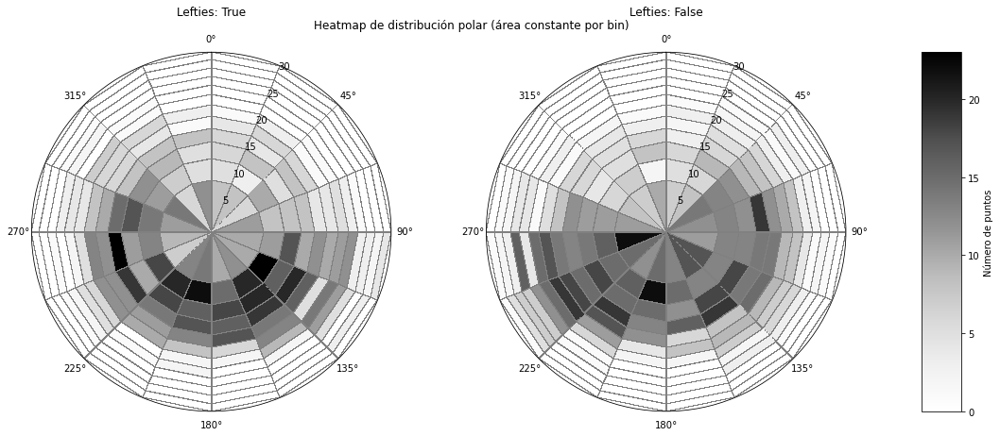

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.gridspec as gridspec
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Parámetros
bin_scale = 0.25      # Ajusta el tamaño de los bines radiales (mayor valor => más bines pequeños)
angular_bins = 16     # Cantidad de divisiones angulares en el heatmap

n_theta_base = angular_bins  # Bines angulares base
n_r_base = 50                # Bines radiales base

n_theta = n_theta_base
n_r = int(n_r_base * bin_scale)

# Parámetros para la grilla en cada bin
grid_color = 'gray'      # Color del borde de cada bin (cámbialo a tu gusto)
grid_linewidth = 0.005    # Ancho del borde

def compute_heatmap_data(lefties_val):
    """
    Recorre todas las áreas y acumula globalmente los ángulos y distancias
    de los puntos (filtrados por el valor lefties_val) respecto al centroide de cada polígono.
    """
    global_distances = []
    global_angles = []
    
    for key in areas:
        if '28' not in key and '51' not in key:
            area = areas[key]
            # Iterar sobre cada polígono de la subárea 'Hb'
            for j in range(len(area.polygons_per_area_small['Hb'])):
                polygon_coords = area.polygons_per_area_small['Hb'][j]
                centro_poligono = polygon_centroid(polygon_coords)  # Se asume que está definida
                polygon_path = Path(polygon_coords)
                
                # Iterar sobre cada subárea en centers_small
                for subarea_key in area.centers_small:
                    points = area.centers_small[subarea_key][area.roi_lefties[subarea_key] == lefties_val]
                    inside_mask = polygon_path.contains_points(points)
                    points_in_poly = points[inside_mask]
                    
                    for pt in points_in_poly:
                        dx = pt[0] - centro_poligono[0]
                        dy = pt[1] - centro_poligono[1]
                        dist = np.sqrt(dx**2 + dy**2)
                        # Vector "arriba": [0, -1] (convención en imágenes)
                        ref_vec = np.array([0, -1])
                        cross_val = ref_vec[0] * dy - ref_vec[1] * dx
                        dot_val = ref_vec[0] * dx + ref_vec[1] * dy
                        angle = np.arctan2(cross_val, dot_val)
                        
                        global_distances.append(dist)
                        global_angles.append(angle)
                        
    return np.array(global_angles), np.array(global_distances)

# Obtener los datos para lefties=True y lefties=False
angles_true, distances_true = compute_heatmap_data(True)
angles_false, distances_false = compute_heatmap_data(False)

# Para que ambos gráficos compartan la misma escala radial, usamos el máximo global
r_max_global = max(distances_true.max() if distances_true.size > 0 else 0,
                   distances_false.max() if distances_false.size > 0 else 0)

# Definir los bines angulares uniformes (entre -π y π)
theta_bins = np.linspace(-np.pi, np.pi, n_theta + 1)
# Definir los bines radiales de modo que cada uno tenga área constante
r_bins = np.sqrt(np.linspace(0, r_max_global**2, n_r + 1))

# Calcular el histograma 2D para cada conjunto de datos usando los mismos bines
H_true, _, _ = np.histogram2d(angles_true, distances_true, bins=[theta_bins, r_bins])
H_false, _, _ = np.histogram2d(angles_false, distances_false, bins=[theta_bins, r_bins])

# Determinar el máximo común de ambos histogramas para la escala de colores
vmax_common = max(H_true.max(), H_false.max())

# Crear la figura con 3 subplots: dos para los gráficos polares y uno para la barra de color.
fig = plt.figure(figsize=(18, 7))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.1])

# Subplot para lefties=True (primer panel, a la izquierda)
ax_true = fig.add_subplot(gs[0], projection='polar')
pc_true = ax_true.pcolormesh(
    theta_bins, r_bins, H_true.T, shading='auto',
    cmap='Greys', vmin=0, vmax=vmax_common,
    edgecolors=grid_color, linewidth=grid_linewidth
)
ax_true.set_theta_zero_location("N")
ax_true.set_theta_direction(-1)
ax_true.set_title("Lefties: True", pad=20)

# Subplot para lefties=False (segundo panel)
ax_false = fig.add_subplot(gs[1], projection='polar')
pc_false = ax_false.pcolormesh(
    theta_bins, r_bins, H_false.T, shading='auto',
    cmap='Greys', vmin=0, vmax=vmax_common,
    edgecolors=grid_color, linewidth=grid_linewidth
)
ax_false.set_theta_zero_location("N")
ax_false.set_theta_direction(-1)
ax_false.set_title("Lefties: False", pad=20)

# Subplot para la barra de color (tercer panel)
cax = fig.add_subplot(gs[2])
sm = ScalarMappable(norm=Normalize(vmin=0, vmax=vmax_common), cmap='Greys')
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax, label='Número de puntos')

fig.suptitle("Heatmap de distribución polar (área constante por bin)", y=0.95)
plt.show()



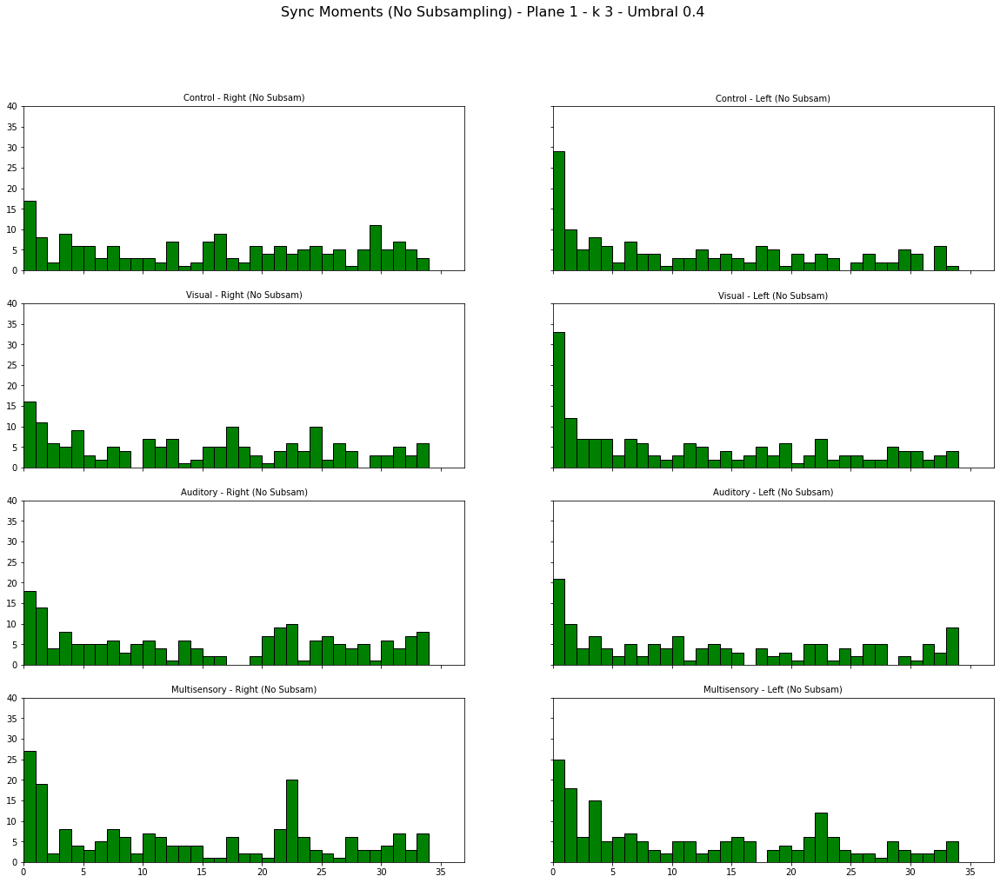

In [814]:
# Definir los niveles de las variables
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]
planos_values = ['1']  # Solo un plano

# Diccionario de etiquetas para los títulos
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

sinc_mom_dic_6Hz = {}
sinc_mom_dic_6Hz_bin = {}
sinc_mom_dic_6Hz_subsam = {}

match_order = True  # True para que los datos subsam sigan el orden del sin subsam

for planos in planos_values:
    # Crear dos figuras, una para datos sin subsampling y otra para datos con subsampling
    
    fig_no_subsam_bin, axes_no_subsam_bin = plt.subplots(len(aud_con_values) * len(vis_con_values), len(leftie_values),
                                                 figsize=(20, 16), sharex=True, sharey=True)

    umbral_bin = 20


    fig_no_subsam_bin.suptitle(f"Sync Moments (No Subsampling) - Plane {planos} - k {len(kernel_no_subsam)} - Umbral {umbral}", fontsize=16)


    for i, aud_con in enumerate(aud_con_values):
        for j, vis_con in enumerate(vis_con_values):
            for k, leftie in enumerate(leftie_values):

                momentos_sincronia_bin = []
                # Iterar sobre las áreas
                for key in areas:
                    if '25' not in key:
                        for trial in areas[key].trials:
                            if trial.vis == vis_con and trial.aud == aud_con and key[-1] == planos:
                                # Datos sin subsampling
                                data_array = trial.roi_dffs["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                first_event_indices = np.argmax(data_array, axis=1)
                                sorted_indices = np.argsort(first_event_indices)
                                
                                data_array_bin = trial.roi_binaries["Hb"][areas[key].roi_lefties['Hb'] == leftie]
                                if match_order:
                                    sorted_data_array_bin = data_array_bin[sorted_indices]
                                prop_act_bin = np.sum(sorted_data_array_bin, axis=0)*100/len(sorted_data_array_bin[:,0])
                                mascara_th_bin= prop_act_bin > umbral_bin
                                start_indices_bin = np.where((mascara_th_bin[:-1] == False) & (mascara_th_bin[1:] == True))[0] + 1
                                

                                if mascara_th_bin[0]:
                                    start_indices_bin = np.insert(start_indices_bin, 0, 0)



                                momentos_sincronia_bin.extend(start_indices_bin)


                # Definir la posición del subplot
                ax_no_subsam_bin = axes_no_subsam_bin[i * len(vis_con_values) + j, k]


                # Graficar histogramas sin subsampling
                if momentos_sincronia_bin:
                    momentos_sincronia_rescaled_bin = np.array(momentos_sincronia_bin) / 230 * 35
                    bins = np.linspace(0, 35, 36, endpoint=True)  # Definir los bins en la escala correcta
                    ax_no_subsam_bin.hist(momentos_sincronia_rescaled_bin, bins=bins, color='green', edgecolor='black')
                    ax_no_subsam_bin.set_ylim(0, 40)
                    ax_no_subsam_bin.set_xlim(0, 37)  
                
                
                sinc_mom_dic_6Hz_bin[f'A{aud_con}-V{vis_con}-L{leftie}-P{planos}'] = momentos_sincronia_rescaled
                
     

                # Títulos de cada subplot
                
                condition_label = trial_labels[(aud_con, vis_con)]
                side_label = "Right" if leftie else "Left"

                ax_no_subsam_bin.set_title(f"{condition_label} - {side_label} (No Subsam)", fontsize=10)

    plt.show()

Intervalo en frames: 144 a 157


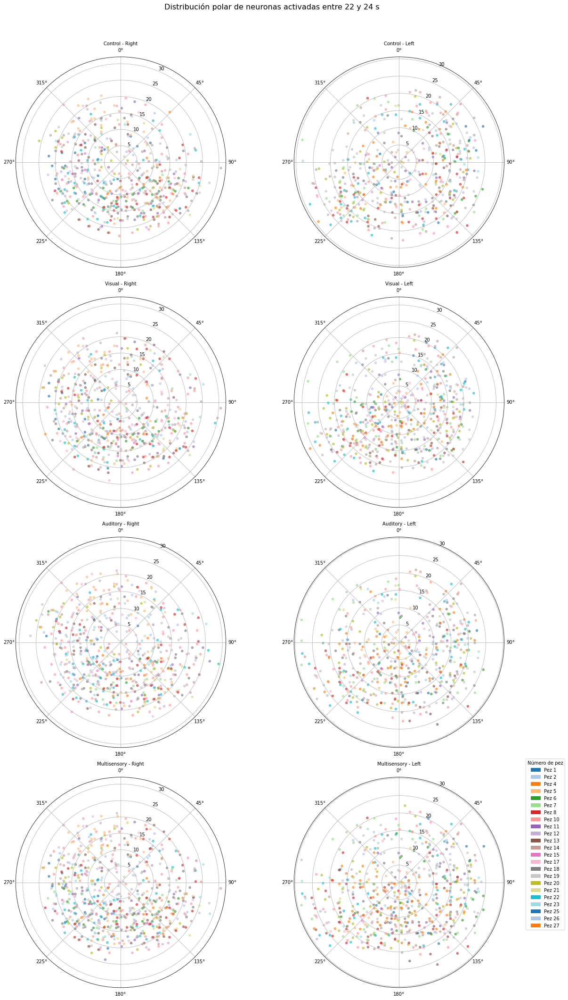

In [820]:
# ---------------------------
# Parámetros y condiciones
# ---------------------------

# Valores de condiciones para audición, visión y lado (leftie)
aud_con_values = [0, 1]
vis_con_values = [0, 1]
leftie_values = [True, False]

# Intervalo de tiempo en segundos que nos interesa (22 a 25 s)
start_sec = 22
end_sec = 24
# Parámetros de la grabación (según tu código original: 230 frames en 35 segundos)
total_frames = 230
total_time = 35.0
frame_rate = total_frames / total_time  # frames por segundo

# Convertir el intervalo de tiempo a índices de frame
lower_frame = int(start_sec * frame_rate)
upper_frame = int(end_sec * frame_rate)
print(f"Intervalo en frames: {lower_frame} a {upper_frame}")

# ---------------------------
# Preparar mapeo de colores por pez
# ---------------------------
# Se recorre el diccionario 'areas' para obtener los números de pez (excluyendo claves con '28' o '51')
fish_set = set()
for key in areas:
    if '28' not in key and '51' not in key:
        fish_set.add(areas[key].pez)
fish_list = sorted(list(fish_set))

# Seleccionamos un colormap según la cantidad de peces
cmap_name = 'tab10' if len(fish_list) <= 10 else 'tab20'
cmap = plt.get_cmap(cmap_name)
fish_colors = { fish: cmap(i % cmap.N) for i, fish in enumerate(fish_list) }

# ---------------------------
# Crear la figura con subplots polares
# ---------------------------
# Hay 2 x 2 x 2 = 8 combinaciones de condiciones. Los organizamos en una grilla (4 filas x 2 columnas)
fig, axes = plt.subplots(4, 2, figsize=(18, 30), subplot_kw={'polar': True})
fig.suptitle(f"Distribución polar de neuronas activadas entre {start_sec} y {end_sec} s", fontsize=16)

# Diccionario para etiquetar las condiciones de audición y visión (como en tu primer código)
trial_labels = {
    (1, 0): "Auditory",
    (0, 1): "Visual",
    (1, 1): "Multisensory",
    (0, 0): "Control"
}

# Índice para recorrer los subplots
ax_index = 0

# ---------------------------
# Loop por cada combinación de condiciones
# ---------------------------
for aud_con in aud_con_values:
    for vis_con in vis_con_values:
        for leftie in leftie_values:
            
            # Listas donde se acumularán los datos para el gráfico polar de esta condición
            global_distances = []
            global_angles = []
            global_colors = []
            
            # Se recorre cada área en 'areas'
            for key in areas:
                # Excluir áreas cuyos nombres contengan '28' o '51'
                if '25' in key or '51' in key:
                    continue
                area = areas[key]
                
                # Verificar que el área tenga la información necesaria para la subárea "Hb"
                if ("Hb" not in area.centers_small or 
                    "Hb" not in area.roi_lefties or 
                    "Hb" not in area.polygons_per_area_small):
                    continue
                
                # Se obtiene el número de pez y su color asignado
                fish_num = area.pez
                current_color = fish_colors.get(fish_num, 'gray')
                
                # ---------------------------
                # 1. Determinar cuáles neuronas se activaron en el intervalo de tiempo
                # ---------------------------
                # Obtener las coordenadas espaciales (centers) de las neuronas para "Hb" filtrando por 'leftie'
                roi_indices = np.where(area.roi_lefties["Hb"] == leftie)[0]
                if len(roi_indices) == 0:
                    continue
                points = area.centers_small["Hb"][roi_indices]  # arreglo (n_neuronas, 2)
                n_neurons = points.shape[0]
                
                # Crear una máscara de activación para cada neurona (inicialmente en False)
                activated_mask = np.zeros(n_neurons, dtype=bool)
                
                # Recorrer los trials del área que cumplan con las condiciones (aud y vis)
                for trial in area.trials:
                    if trial.aud == aud_con and trial.vis == vis_con:
                        # Se extrae la matriz binaria para la subárea "Hb" y se filtra por 'leftie'
                        # print(key)
                        bin_data = trial.roi_binaries["Hb"][area.roi_lefties["Hb"] == leftie]  # shape: (n_neuronas, tiempo)
                        # Para cada neurona, se comprueba si hubo activación en el rango de frames definido
                        trial_activation = np.any(bin_data[:, lower_frame:upper_frame+1], axis=1)
                        # Se acumula la activación (si se activa en al menos un trial, se marca True)
                        activated_mask = activated_mask | trial_activation
                
                # Filtrar los puntos para quedarnos sólo con aquellos que se activaron en el intervalo
                points_activated = points[activated_mask]
                if len(points_activated) == 0:
                    continue
                
                # ---------------------------
                # 2. Asignar los puntos activados a polígonos y calcular coordenadas polares
                # ---------------------------
                # Se itera sobre cada polígono definido para "Hb" en el área
                for polygon_coords in area.polygons_per_area_small["Hb"]:
                    # Calcular el centroide del polígono (se asume que tienes definida la función polygon_centroid)
                    centro_poligono = polygon_centroid(polygon_coords)
                    # Crear un objeto Path a partir de los vértices del polígono
                    polygon_path = Path(polygon_coords)
                    # Determinar cuáles de los puntos activados están dentro del polígono
                    inside_mask = polygon_path.contains_points(points_activated)
                    points_in_poly = points_activated[inside_mask]
                    
                    # Para cada punto dentro del polígono, calcular la distancia y el ángulo respecto al centroide
                    for pt in points_in_poly:
                        dx = pt[0] - centro_poligono[0]
                        dy = pt[1] - centro_poligono[1]
                        dist = np.sqrt(dx**2 + dy**2)
                        
                        # Usamos un vector de referencia vertical ([0, -1]) para calcular el ángulo
                        ref_vec = np.array([0, -1])
                        cross_val = ref_vec[0]*dy - ref_vec[1]*dx
                        dot_val = ref_vec[0]*dx + ref_vec[1]*dy
                        angle = np.arctan2(cross_val, dot_val)
                        
                        # Acumular los valores para graficar
                        global_distances.append(dist)
                        global_angles.append(angle)
                        global_colors.append(current_color)
            
            # ---------------------------
            # 3. Graficar el subplot polar para la combinación actual
            # ---------------------------
            ax = axes.flatten()[ax_index]
            ax_index += 1
            
            if global_distances:
                ax.scatter(global_angles, global_distances, s=20, c=global_colors, alpha=0.6)
            
            # Configurar el gráfico polar: el 0° en "Norte" y sentido horario
            ax.set_theta_zero_location("N")
            ax.set_theta_direction(-1)
            
            # Título del subplot con la condición (usando trial_labels para audición y visión)
            condition_label = trial_labels.get((aud_con, vis_con), f"A{aud_con}-V{vis_con}")
            side_label = "Right" if leftie else "Left"
            ax.set_title(f"{condition_label} - {side_label}", fontsize=10)

# ---------------------------
# 4. Leyenda global de colores (por número de pez)
# ---------------------------
legend_handles = [mpatches.Patch(color=fish_colors[fish], label=f"Pez {fish}") for fish in fish_list]
# Se agrega la leyenda en el último subplot (se puede ajustar la posición)
axes.flatten()[-1].legend(handles=legend_handles, title="Número de pez", loc="upper right", bbox_to_anchor=(1.3, 1.1))

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Matrices de correlación